### Visualization of 'Dataset of legitimate IoT data'

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import glob
import numpy as np

In [3]:
PATH = '.'
csv_files = glob.glob(os.path.join(PATH, '*.csv'))

df_list = [pd.read_csv(file) for file in csv_files]
df = pd.concat(df_list, ignore_index=True)
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11711222 entries, 0 to 11711221
Data columns (total 85 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Flow ID            object 
 1   Src IP             object 
 2   Src Port           float64
 3   Dst IP             object 
 4   Dst Port           float64
 5   Protocol           float64
 6   Timestamp          object 
 7   Flow Duration      float64
 8   Tot Fwd Pkts       float64
 9   Tot Bwd Pkts       float64
 10  TotLen Fwd Pkts    float64
 11  TotLen Bwd Pkts    float64
 12  Fwd Pkt Len Max    float64
 13  Fwd Pkt Len Min    float64
 14  Fwd Pkt Len Mean   float64
 15  Fwd Pkt Len Std    float64
 16  Bwd Pkt Len Max    float64
 17  Bwd Pkt Len Min    float64
 18  Bwd Pkt Len Mean   float64
 19  Bwd Pkt Len Std    float64
 20  Flow Byts/s        float64
 21  Flow Pkts/s        float64
 22  Flow IAT Mean      float64
 23  Flow IAT Std       float64
 24  Flow IAT Max       float64
 25  Flow IAT Min    

In [4]:
df.columns

Index(['Flow ID', 'Src IP', 'Src Port', 'Dst IP', 'Dst Port', 'Protocol',
       'Timestamp', 'Flow Duration', 'Tot Fwd Pkts', 'Tot Bwd Pkts',
       'TotLen Fwd Pkts', 'TotLen Bwd Pkts', 'Fwd Pkt Len Max',
       'Fwd Pkt Len Min', 'Fwd Pkt Len Mean', 'Fwd Pkt Len Std',
       'Bwd Pkt Len Max', 'Bwd Pkt Len Min', 'Bwd Pkt Len Mean',
       'Bwd Pkt Len Std', 'Flow Byts/s', 'Flow Pkts/s', 'Flow IAT Mean',
       'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Tot',
       'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min',
       'Bwd IAT Tot', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
       'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags',
       'Bwd URG Flags', 'Fwd Header Len', 'Bwd Header Len', 'Fwd Pkts/s',
       'Bwd Pkts/s', 'Pkt Len Min', 'Pkt Len Max', 'Pkt Len Mean',
       'Pkt Len Std', 'Pkt Len Var', 'FIN Flag Cnt', 'SYN Flag Cnt',
       'RST Flag Cnt', 'PSH Flag Cnt', 'ACK Flag Cnt', 'URG Flag Cnt',
       'CWE Flag Count', 'ECE 

In [21]:
df['RST Flag Cnt']


0           0.0
1           0.0
2           0.0
3           0.0
4           0.0
           ... 
11711217    2.0
11711218    0.0
11711219    0.0
11711220    0.0
11711221    0.0
Name: RST Flag Cnt, Length: 11711222, dtype: float64

In [5]:
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest

#determining Anomaly

scaler = StandardScaler()


df_scaled = df.copy()

columns_to_drop = ["Flow ID", "Src IP", "Dst IP", "Timestamp"]
df_cleaned = df.drop(columns=[col for col in columns_to_drop if col in df.columns])

df_cleaned = df_cleaned.replace('No Label', 0)


#fit and transform the numerical features
df_scaled = pd.DataFrame(scaler.fit_transform(df_cleaned), columns=df_cleaned.columns)



#anomaly detection - Isolates observations
iso_forest = IsolationForest(n_estimators= 200,contamination=0.05, random_state=42)

iso_forest.fit(df_cleaned)

anomalies = iso_forest.predict(df_cleaned)


df_scaled['anomaly'] =  pd.Series(anomalies).apply(lambda x: 1 if x == -1 else 0)




# df_scaled['anomaly'] = df_scaled['anomaly'].apply(lambda x: 1 if x == -1 else 0)

# df_scaled['is_anomaly'] = df_scaled['anomaly'].apply(lambda x: 'Anomaly' if x == 1 else 'Normal')



/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/3002785780.py:14: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_cleaned = df_cleaned.replace('No Label', 0)


In [ ]:
df['anomaly'].to_csv('anomaly_column.csv', index=False)

In [83]:
df_scaled.columns

Index(['Src Port', 'Dst Port', 'Protocol', 'Flow Duration', 'Tot Fwd Pkts',
       'Tot Bwd Pkts', 'TotLen Fwd Pkts', 'TotLen Bwd Pkts', 'Fwd Pkt Len Max',
       'Fwd Pkt Len Min', 'Fwd Pkt Len Mean', 'Fwd Pkt Len Std',
       'Bwd Pkt Len Max', 'Bwd Pkt Len Min', 'Bwd Pkt Len Mean',
       'Bwd Pkt Len Std', 'Flow Byts/s', 'Flow Pkts/s', 'Flow IAT Mean',
       'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Tot',
       'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min',
       'Bwd IAT Tot', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
       'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags',
       'Bwd URG Flags', 'Fwd Header Len', 'Bwd Header Len', 'Fwd Pkts/s',
       'Bwd Pkts/s', 'Pkt Len Min', 'Pkt Len Max', 'Pkt Len Mean',
       'Pkt Len Std', 'Pkt Len Var', 'FIN Flag Cnt', 'SYN Flag Cnt',
       'RST Flag Cnt', 'PSH Flag Cnt', 'ACK Flag Cnt', 'URG Flag Cnt',
       'CWE Flag Count', 'ECE Flag Cnt', 'Down/Up Ratio', 'Pkt Size Avg',
       

In [19]:
#correlation matrix and heatmap:

from sklearn.preprocessing import MinMaxScaler, RobustScaler

numeric_df_scaled = df.select_dtypes(include=['float64', 'int64'])

# scaler = StandardScaler()

# scaler = MinMaxScaler()
scaler = RobustScaler()


#df_scaled_temp = pd.DataFrame(scaler.fit_transform(numeric_df_scaled), columns=numeric_df_scaled.columns)

#df_scaled = pd.DataFrame(scaler.fit_transform(numeric_df_scaled), columns=numeric_df_scaled.columns)

threshold = 0.05


correlation_matrix = numeric_df_scaled.corr()

# mask = np.abs(correlation_matrix) > threshold
# filtered_corr = correlation_matrix.mask(mask)
#filtered_corr = correlation_matrix[(correlation_matrix > threshold) | (correlation_matrix < -threshold)] 

print(correlation_matrix)

#sort by importance
# correlation rearranges the feature based on correlation and strength

sorted_indices = np.argsort(-correlation_matrix.abs().sum().values)
sorted_corr_matrix = correlation_matrix.iloc[sorted_indices, sorted_indices]

#with filtered
# sorted_indices = np.argsort(-filtered_corr.abs().sum().values)
# sorted_corr_matrix = filtered_corr.iloc[sorted_indices, sorted_indices]


#correlation heatmap

plt.figure(figsize =(55,55), dpi =300)

#sns.heatmap(correlation_matrix, annot = True, cmap="coolwarm", fmt=".2f", linewidths=0.5, cbar = True, annot_kws={"size": 10})

sns.heatmap(sorted_corr_matrix, annot = True, cmap="coolwarm", fmt=".2f", linewidths=0.5, cbar = True, annot_kws={"size": 10})

plt.title('Correlation Heatmap')
plt.xticks(rotation=90, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.show()


               Src Port  Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  \
Src Port       1.000000 -0.329321  0.155531       0.036066      0.017975   
Dst Port      -0.329321  1.000000  0.050343       0.010479     -0.013775   
Protocol       0.155531  0.050343  1.000000      -0.087065     -0.012727   
Flow Duration  0.036066  0.010479 -0.087065       1.000000      0.102659   
Tot Fwd Pkts   0.017975 -0.013775 -0.012727       0.102659      1.000000   
...                 ...       ...       ...            ...           ...   
Idle Mean      0.217400 -0.154679 -0.284684       0.535681      0.083019   
Idle Std      -0.072738  0.057737  0.051283       0.241249     -0.010196   
Idle Max       0.204521 -0.147198 -0.278312       0.554285      0.080364   
Idle Min       0.205439 -0.169751 -0.308687       0.349975      0.071626   
anomaly        0.167018 -0.100110 -0.040125      -0.113308      0.111408   

               Tot Bwd Pkts  TotLen Fwd Pkts  TotLen Bwd Pkts  \
Src Port           0.0

In [86]:
#Identify the protocols implemented
if 'Protocol' in df.columns:
    protocols_unique = df['Protocol'].unique()
    
    unique_list = protocols_unique.tolist()
 
# to count for reference  
# protocol_0 = 0
# protocol_6 = 0
# protocol_17 = 0
# for i in df['Protocol']:
#     if i == unique_list[0]:
#         protocol_6 +=1
#     elif i == unique_list[1]:
#         protocol_17 += 1
#     elif i == unique_list[2]:
#         protocol_0 += 1





In [6]:
df['anomaly'] = df_scaled["anomaly"]

/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1798533014.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


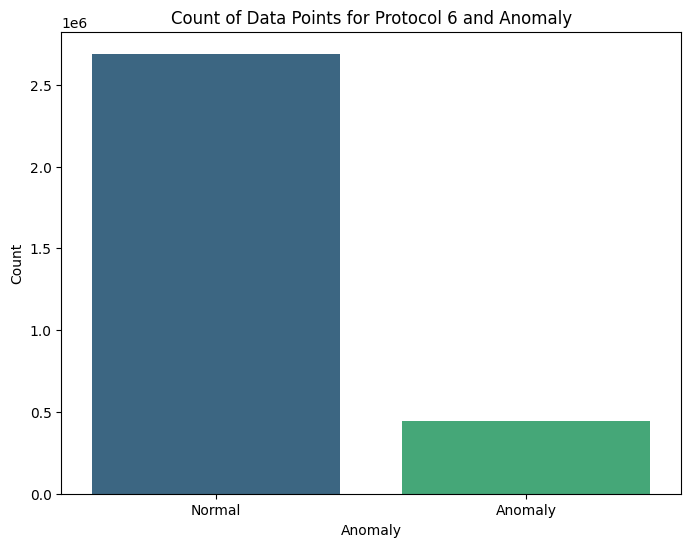

In [7]:
df_protocol_6 = df[df['Protocol'] == 6]

anomaly_counts = df_protocol_6.groupby('anomaly').size().reset_index(name='count')

plt.figure(figsize=(8, 6))
sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')
plt.title('Count of Data Points for Protocol 6 and Anomaly')
plt.xlabel('Anomaly')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1], labels=['Normal', 'Anomaly'])
plt.show()



/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/2914428970.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


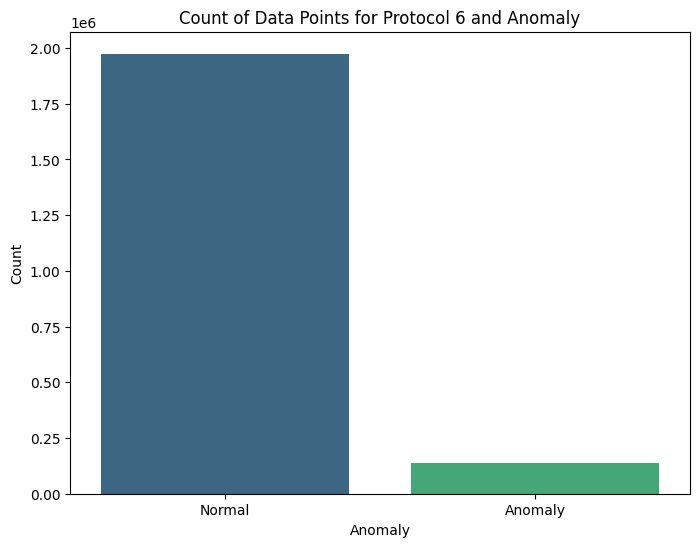

In [8]:
df_protocol_6 = df[df['Protocol'] == 17]

anomaly_counts = df_protocol_6.groupby('anomaly').size().reset_index(name='count')

plt.figure(figsize=(8, 6))
sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')
plt.title('Count of Data Points for Protocol 6 and Anomaly')
plt.xlabel('Anomaly')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1], labels=['Normal', 'Anomaly'])
plt.show()


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_17961/3846162390.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


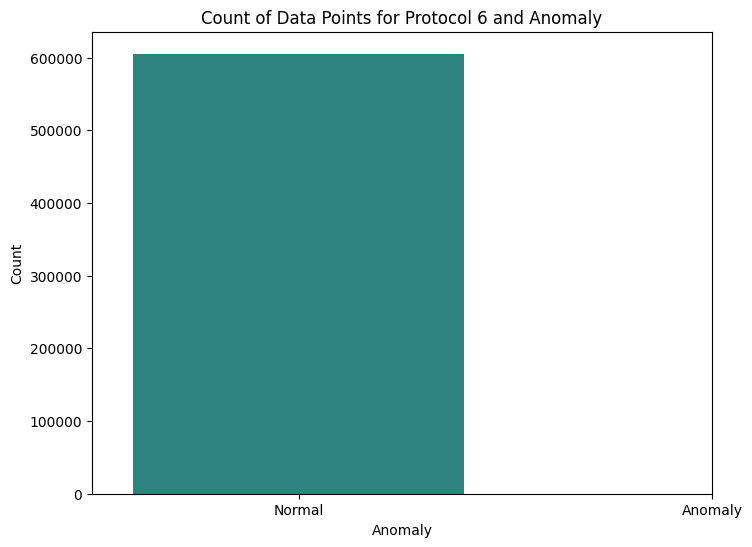

In [107]:
df_protocol_6 = df[df['Protocol'] == 0]

anomaly_counts = df_protocol_6.groupby('anomaly').size().reset_index(name='count')

plt.figure(figsize=(8, 6))
sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')
plt.title('Count of Data Points for Protocol 6 and Anomaly')
plt.xlabel('Anomaly')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1], labels=['Normal', 'Anomaly'])
plt.show()


In [9]:

if 'Dst Port' in df.columns:
    port_unique = df['Dst Port'].unique()
    
    unique_list_port = port_unique.tolist()
    


In [10]:
print(len(unique_list_port))

21320


anomaly count:    anomaly    count
0        0  1163031
1        1   430008


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1617746139.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


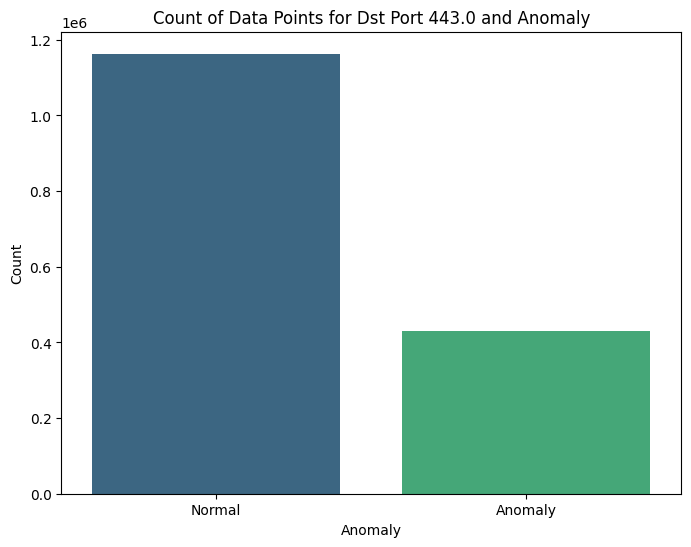

anomaly count:    anomaly   count
0        0  281957


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1617746139.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


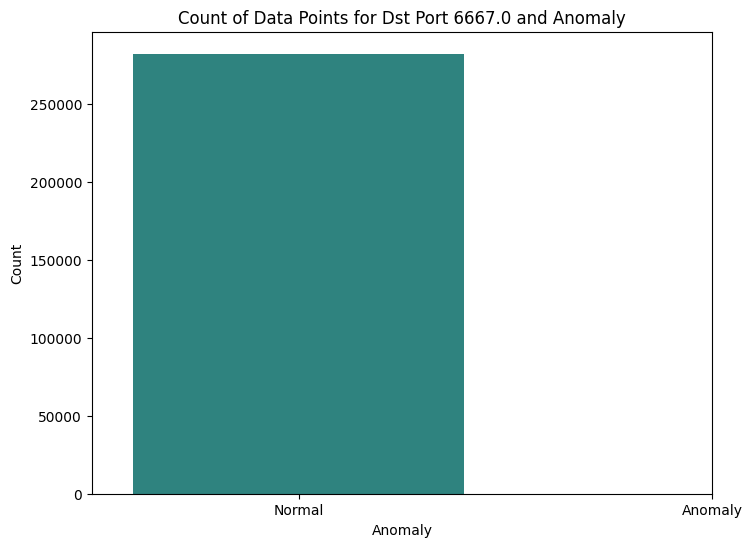

anomaly count:    anomaly   count
0        0  605380
1        1       2


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1617746139.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


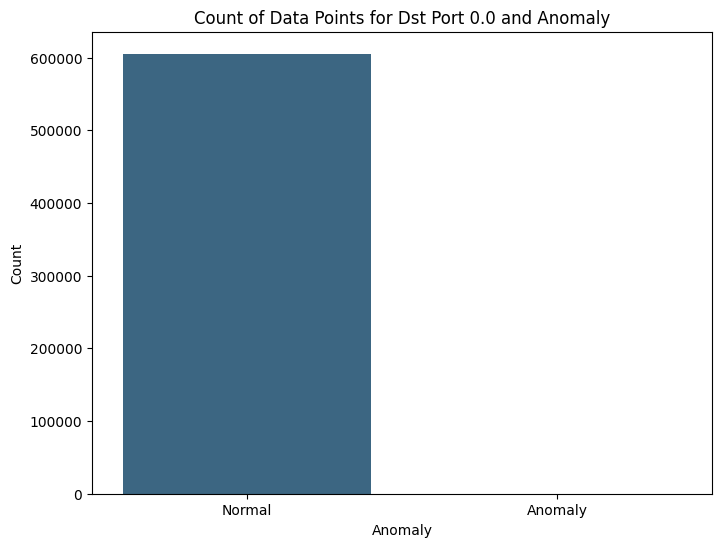

anomaly count:    anomaly   count
0        0  203072


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1617746139.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


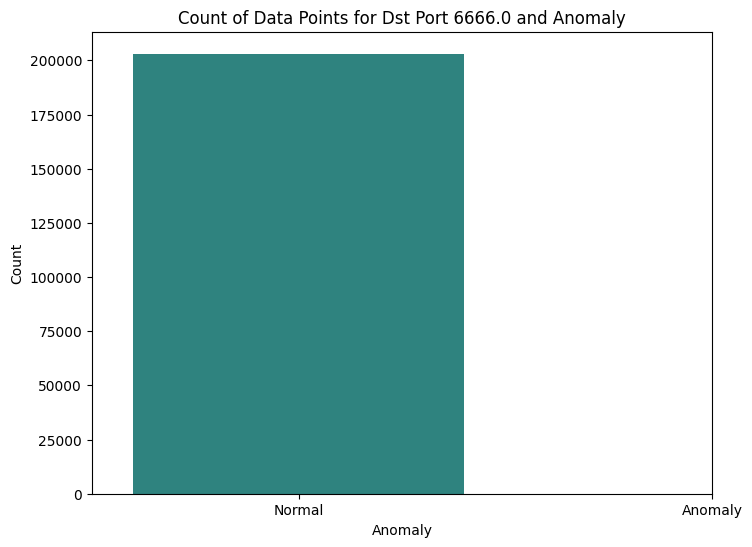

anomaly count:    anomaly   count
0        0  193622


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1617746139.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


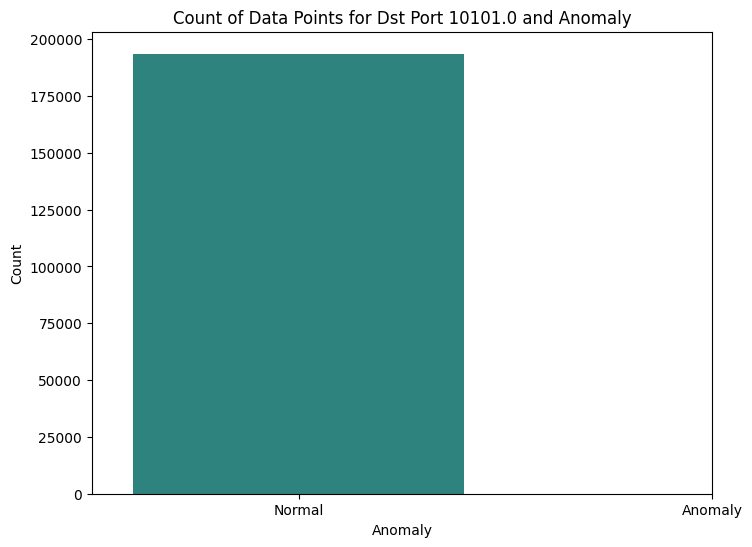

In [11]:
for port in unique_list_port[0:5]:
    current = df[df['Dst Port'] == port]
    
    anomaly_counts = current.groupby('anomaly').size().reset_index(name='count')
    
    if anomaly_counts.empty:
        continue
    else:
        print(f'anomaly count: {anomaly_counts}')
        plt.figure(figsize=(8, 6))
        sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')
        plt.title(f'Count of Data Points for Dst Port {port} and Anomaly')
        plt.xlabel('Anomaly')
        plt.ylabel('Count')
        plt.xticks(ticks=[0, 1], labels=['Normal', 'Anomaly'])
        plt.show()
    
    
    

    
    

anomaly count:    anomaly   count
0        0  272845
1        1       2


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/3495241631.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


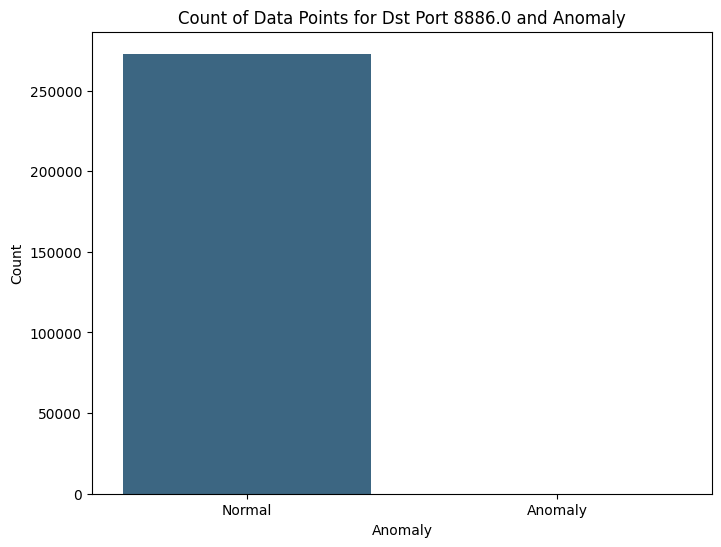

anomaly count:    anomaly   count
0        0  383611
1        1   36372


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/3495241631.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


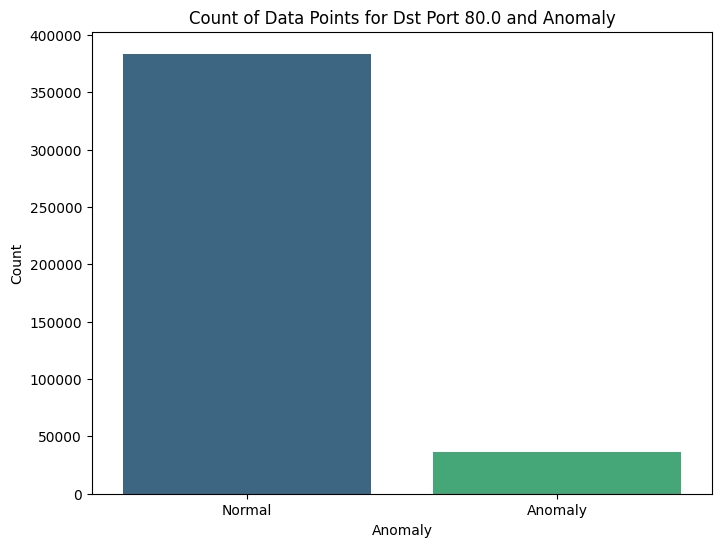

anomaly count:    anomaly  count
0        0     33


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/3495241631.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


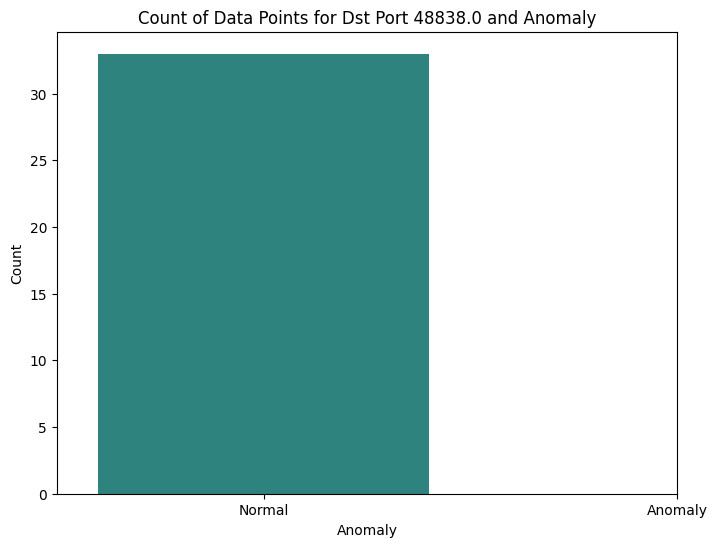

anomaly count:    anomaly  count
0        0     31
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/3495241631.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


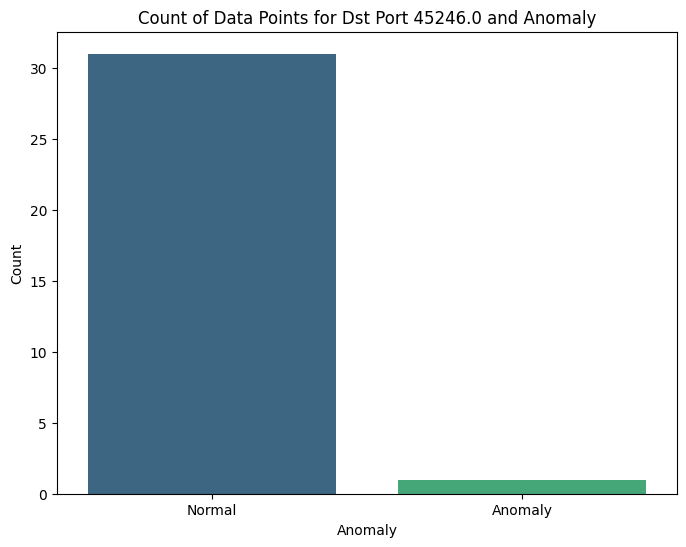

anomaly count:    anomaly   count
0        0  122509


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/3495241631.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


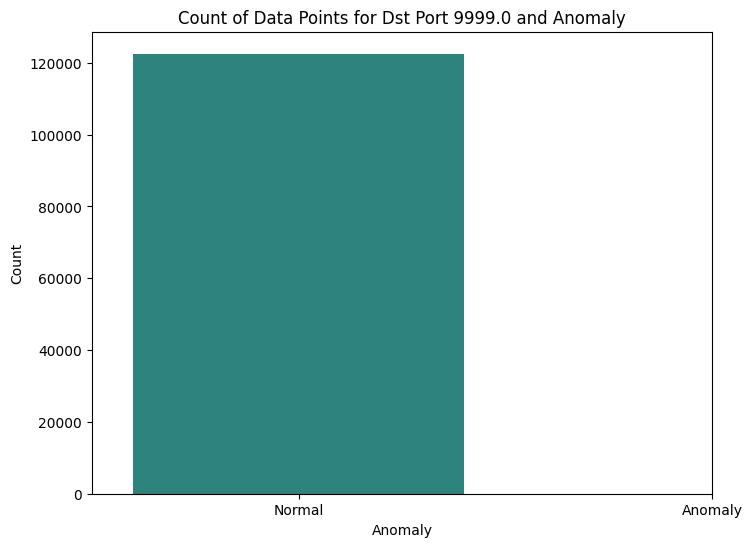

In [12]:
for port in unique_list_port[5:10]:
    current = df[df['Dst Port'] == port]
    
    anomaly_counts = current.groupby('anomaly').size().reset_index(name='count')
    
    if anomaly_counts.empty:
        continue
    else:
        print(f'anomaly count: {anomaly_counts}')
        plt.figure(figsize=(8, 6))
        sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')
        plt.title(f'Count of Data Points for Dst Port {port} and Anomaly')
        plt.xlabel('Anomaly')
        plt.ylabel('Count')
        plt.xticks(ticks=[0, 1], labels=['Normal', 'Anomaly'])
        plt.show()

anomaly count:    anomaly   count
0        0  147639
1        1   69477


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


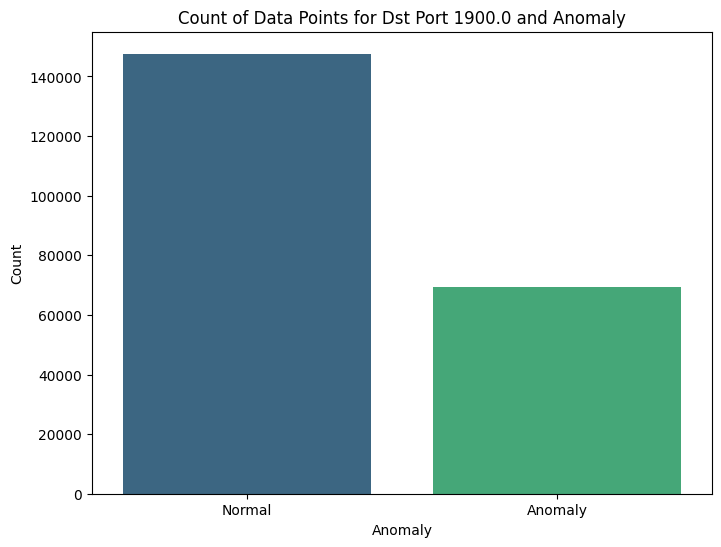

anomaly count:    anomaly   count
0        0  270778
1        1    1881


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


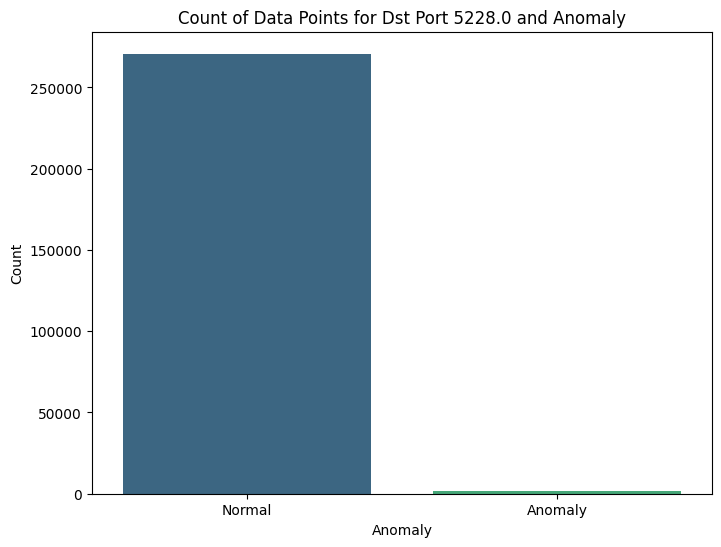

anomaly count:    anomaly   count
0        0  192775
1        1       3


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


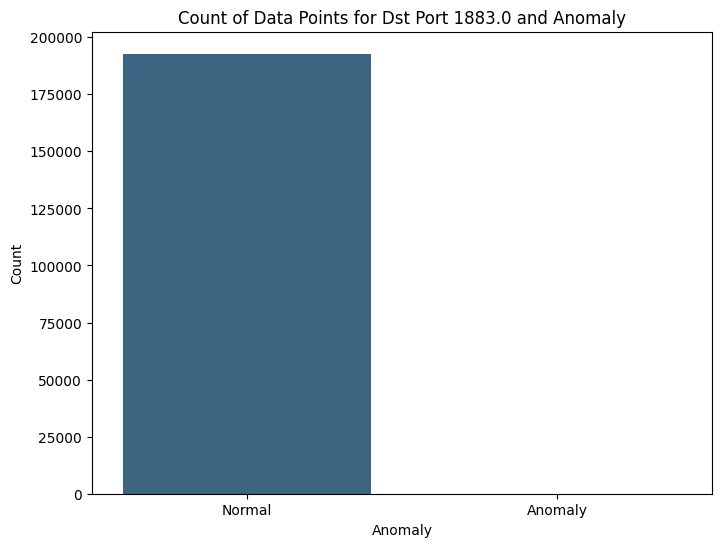

anomaly count:    anomaly  count
0        0  87037
1        1  14644


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


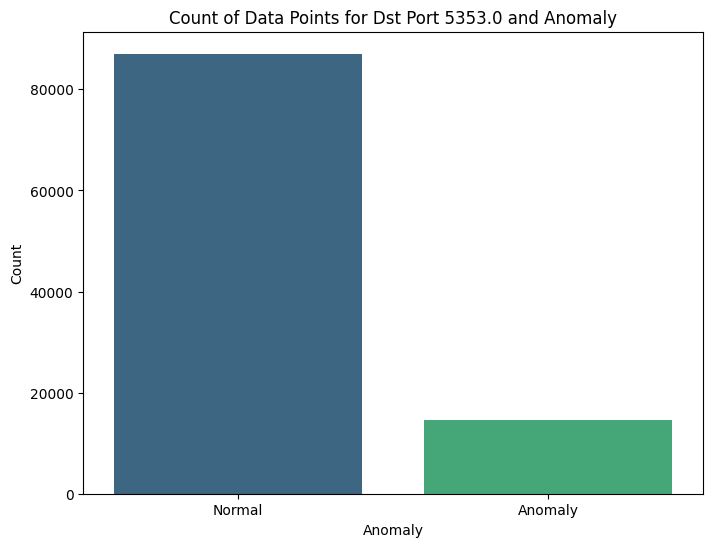

anomaly count:    anomaly  count
0        0      9


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


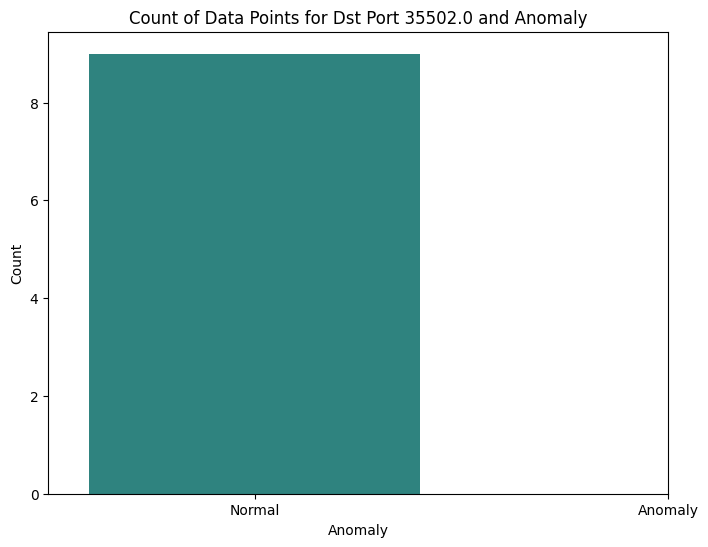

anomaly count:    anomaly  count
0        0  33854
1        1     68


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


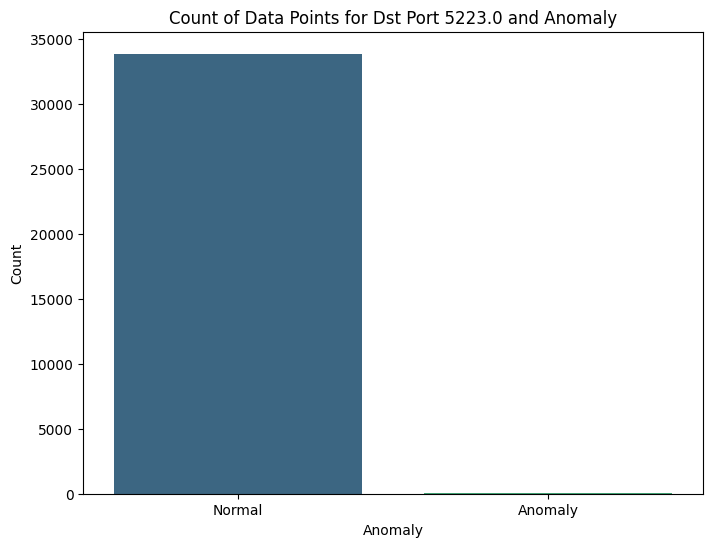

anomaly count:    anomaly  count
0        0      7
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


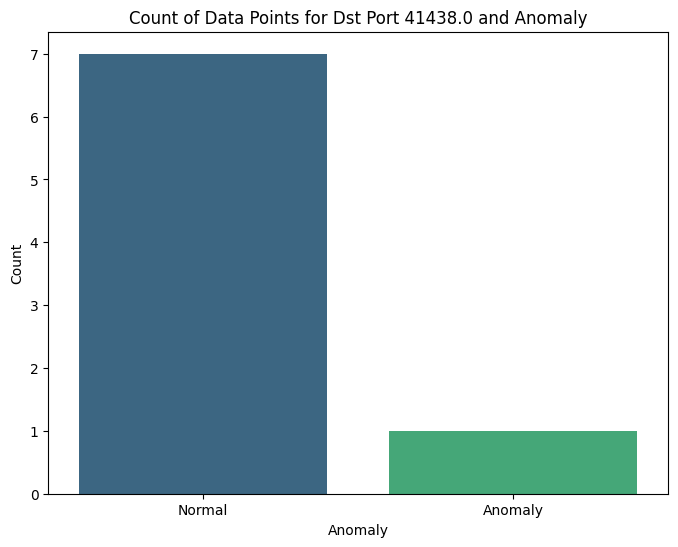

anomaly count:    anomaly  count
0        0      5


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


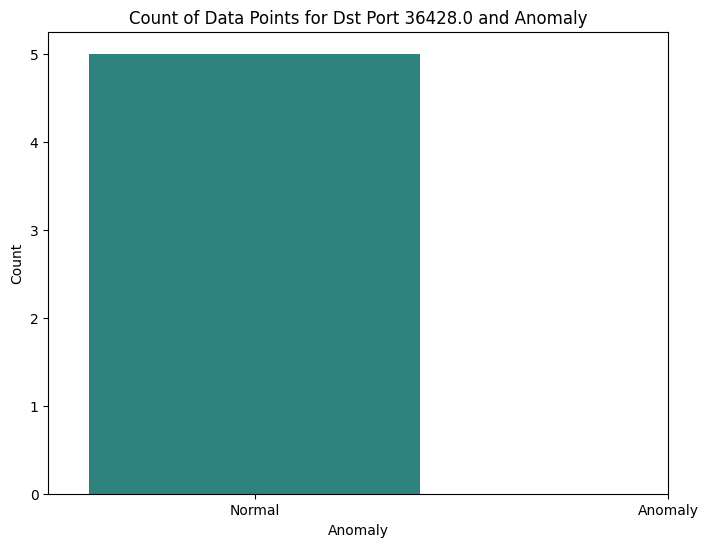

anomaly count:    anomaly  count
0        0      6
1        1      2


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


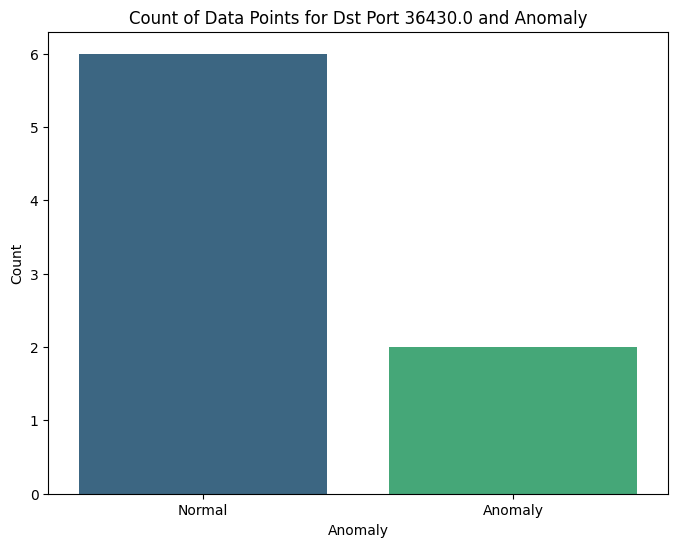

anomaly count:    anomaly  count
0        0   3212
1        1   4710


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


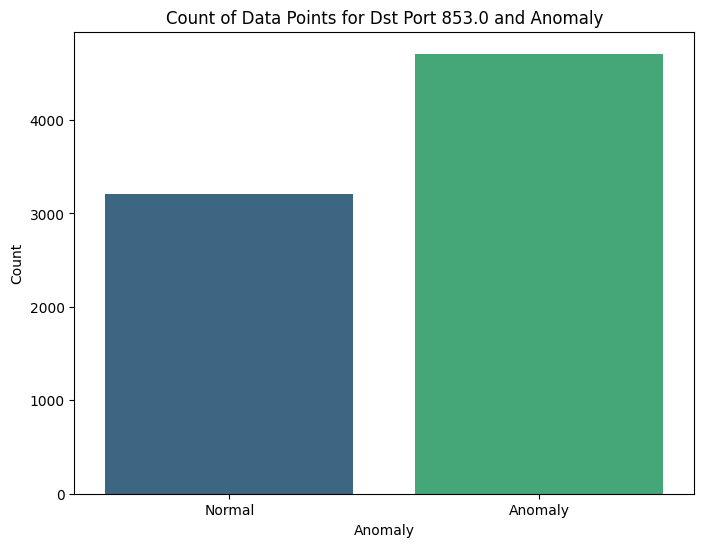

anomaly count:    anomaly  count
0        0    826
1        1    678


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


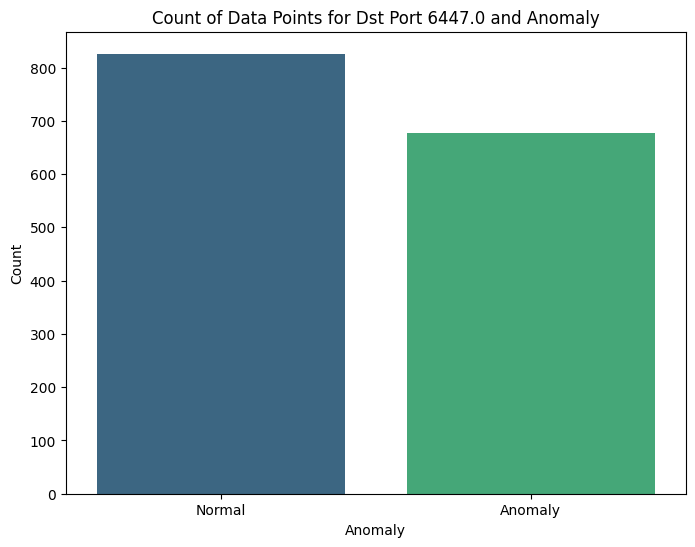

anomaly count:    anomaly  count
0        0      8
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


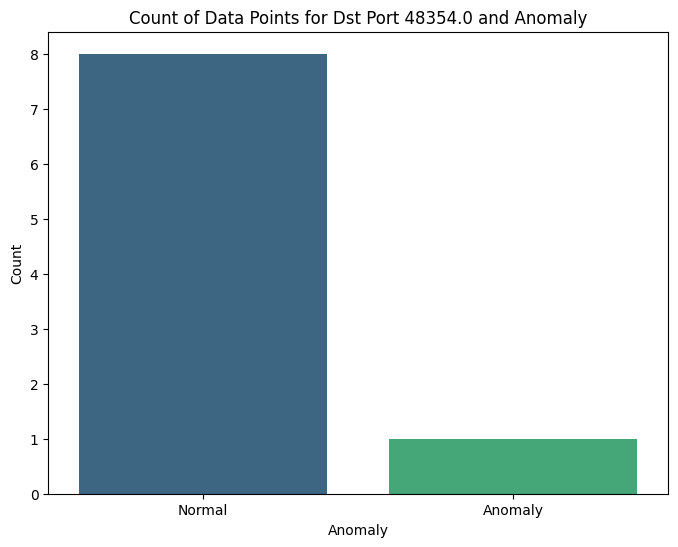

anomaly count:    anomaly  count
0        0     13
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


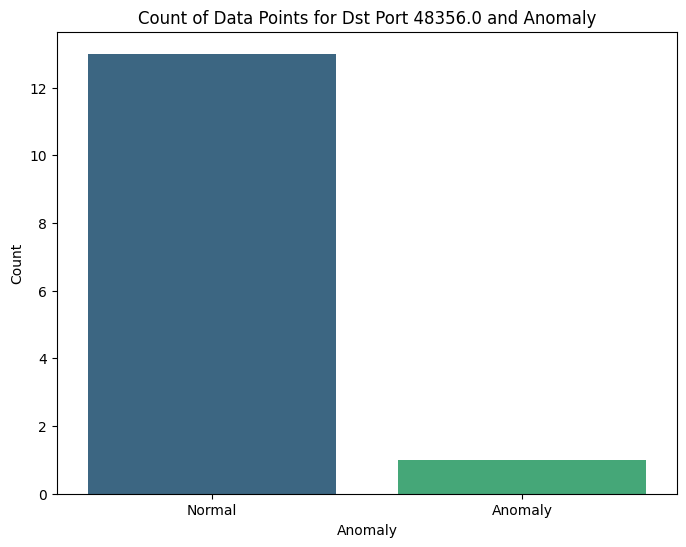

anomaly count:    anomaly  count
0        0  52725
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


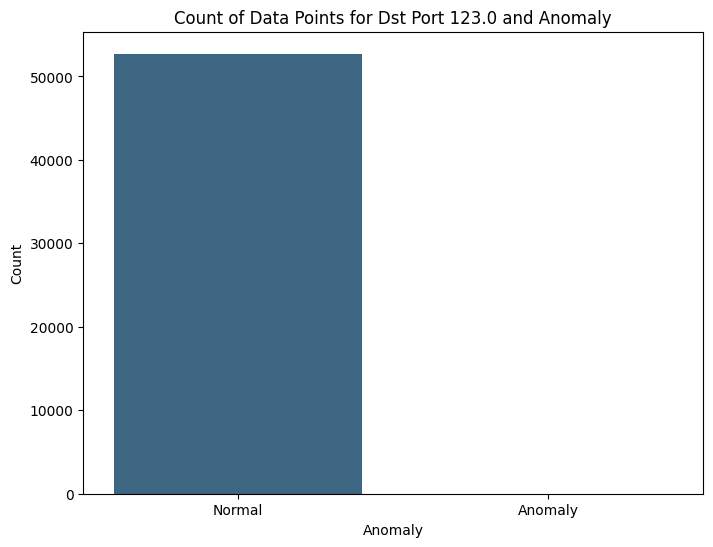

anomaly count:    anomaly  count
0        0     12
1        1      2


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/1079119470.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


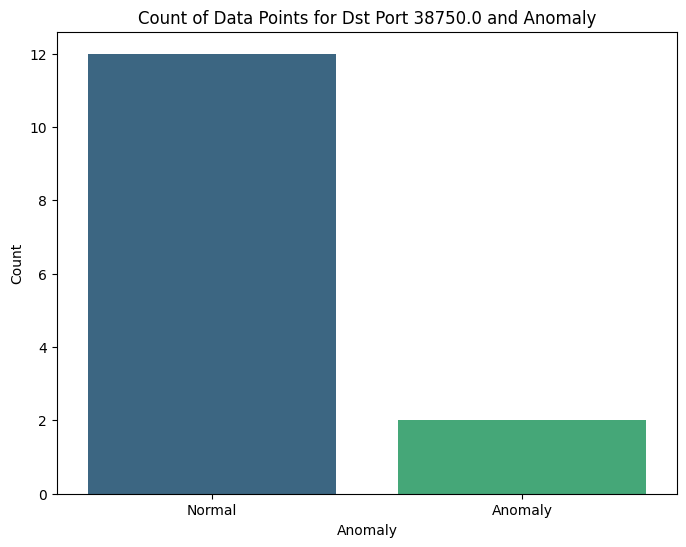

In [13]:
for port in unique_list_port[10:25]:
    current = df[df['Dst Port'] == port]
    
    anomaly_counts = current.groupby('anomaly').size().reset_index(name='count')
    
    if anomaly_counts.empty:
        continue
    else:
        print(f'anomaly count: {anomaly_counts}')
        plt.figure(figsize=(8, 6))
        sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')
        plt.title(f'Count of Data Points for Dst Port {port} and Anomaly')
        plt.xlabel('Anomaly')
        plt.ylabel('Count')
        plt.xticks(ticks=[0, 1], labels=['Normal', 'Anomaly'])
        plt.show()

anomaly count:    anomaly  count
0        0     15


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


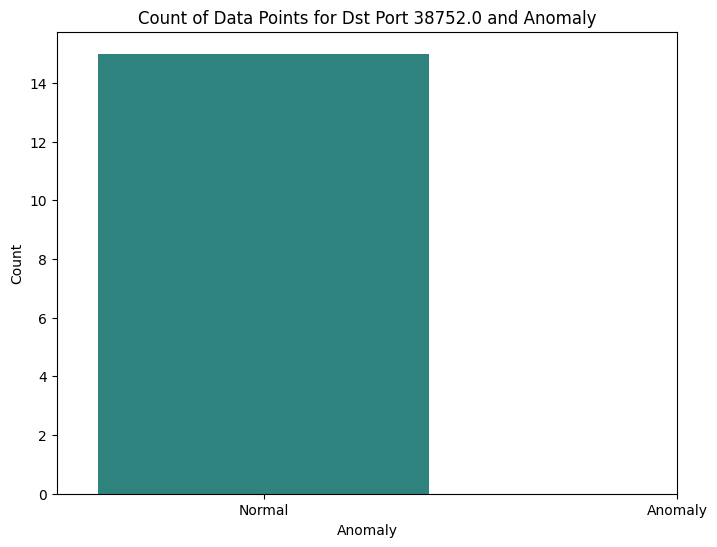

anomaly count:    anomaly  count
0        0     11
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


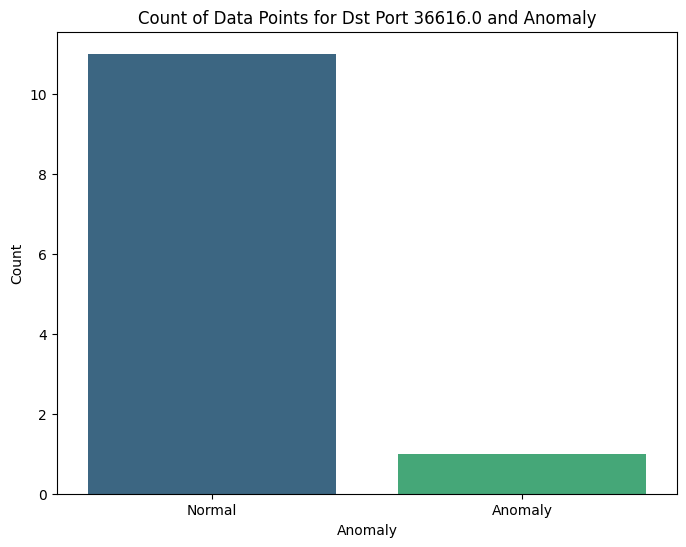

anomaly count:    anomaly  count
0        0     12
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


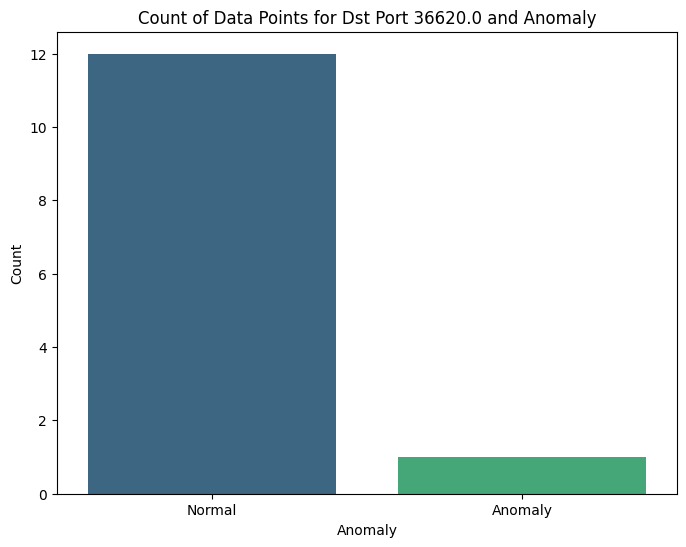

anomaly count:    anomaly  count
0        0     12
1        1      2


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


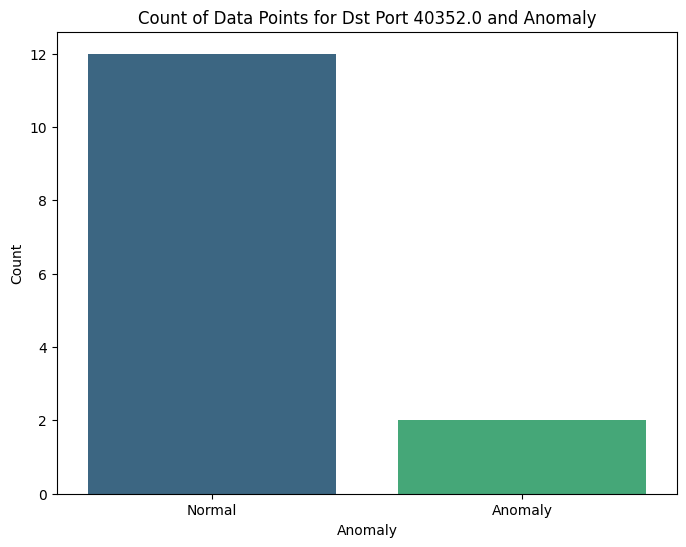

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


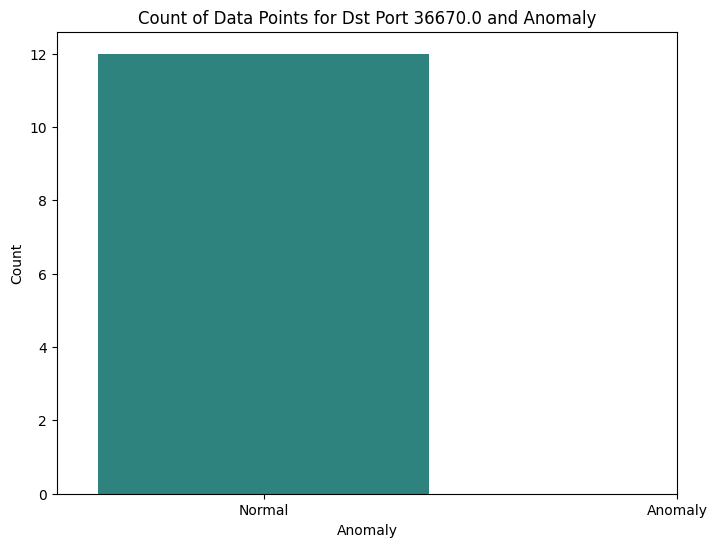

anomaly count:    anomaly  count
0        0     12
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


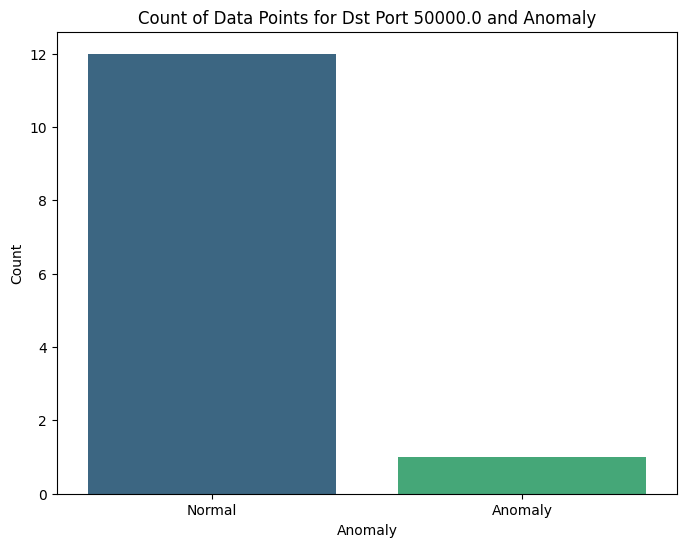

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


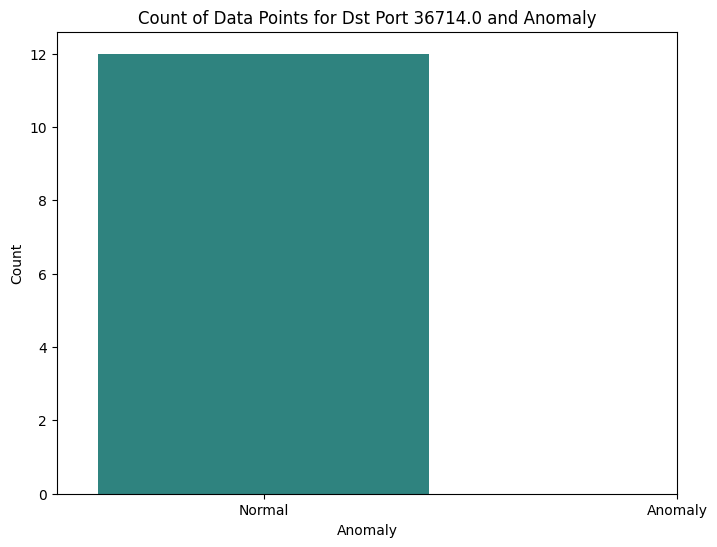

anomaly count:    anomaly  count
0        0      9
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


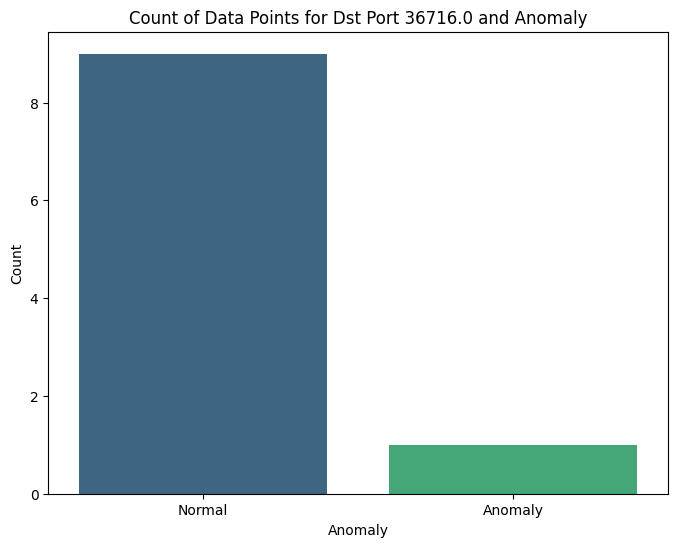

anomaly count:    anomaly  count
0        0     10


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


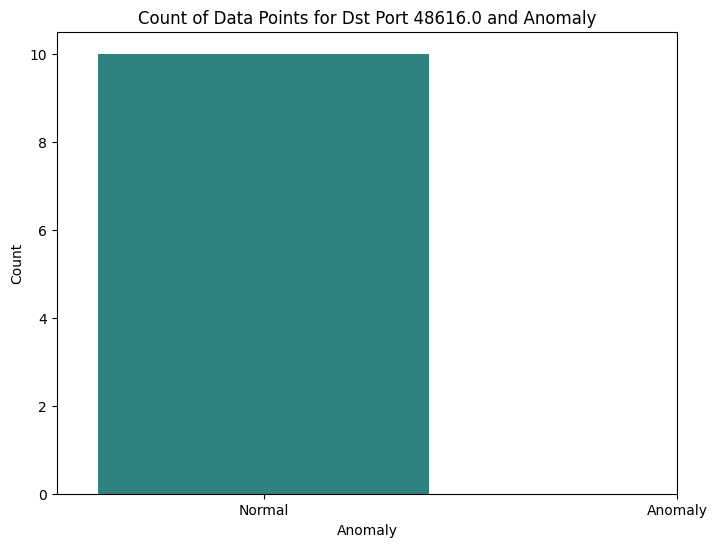

anomaly count:    anomaly  count
0        0     33
1        1      8


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


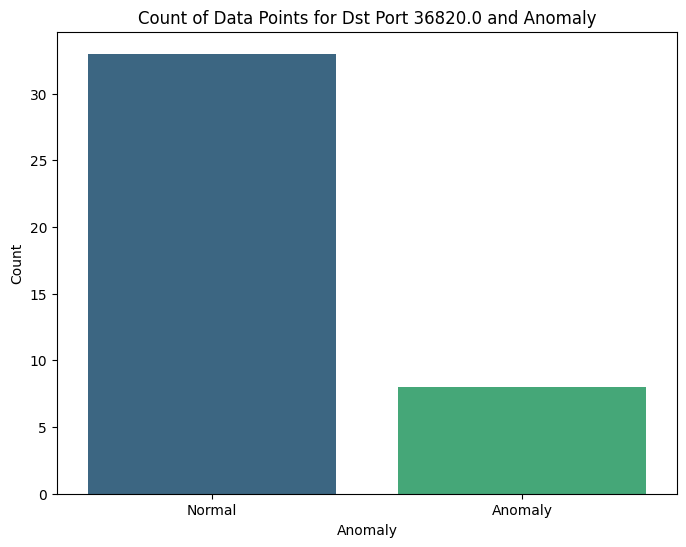

anomaly count:    anomaly  count
0        0     15
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


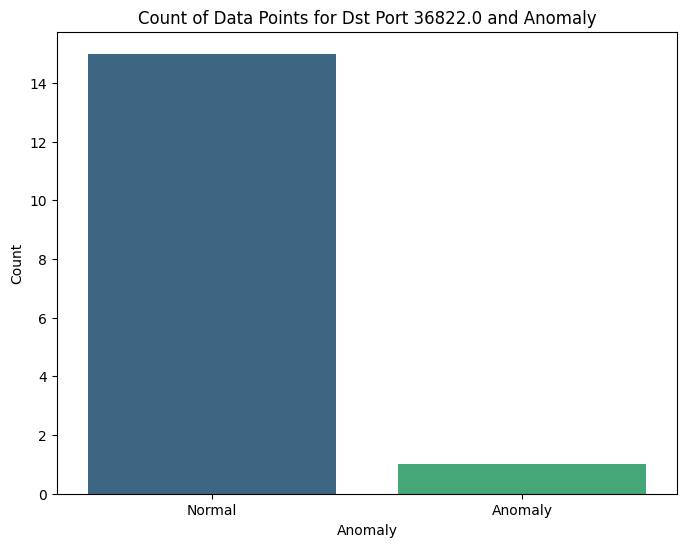

anomaly count:    anomaly  count
0        0    673
1        1  15847


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


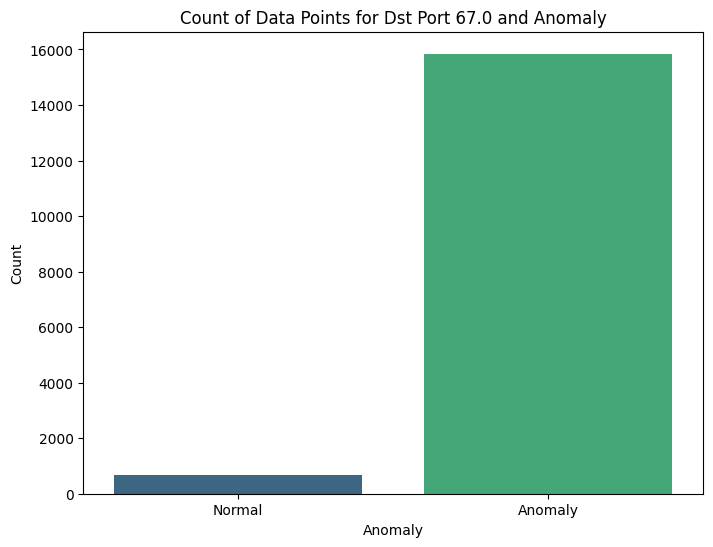

anomaly count:    anomaly  count
0        0      8
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


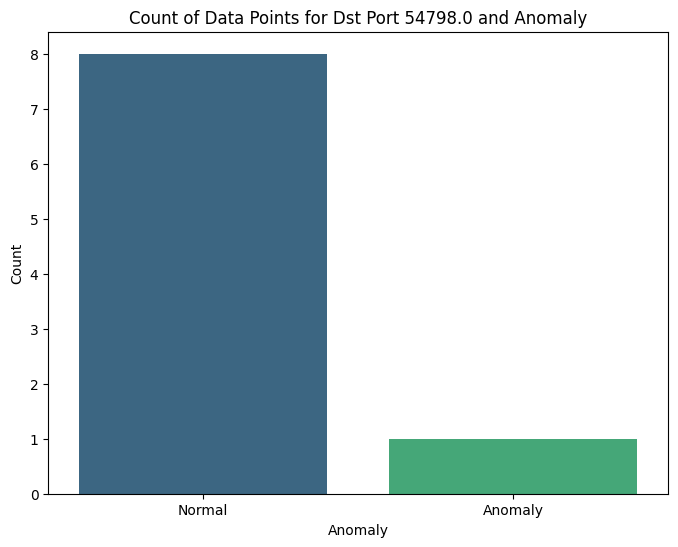

anomaly count:    anomaly  count
0        0     16
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


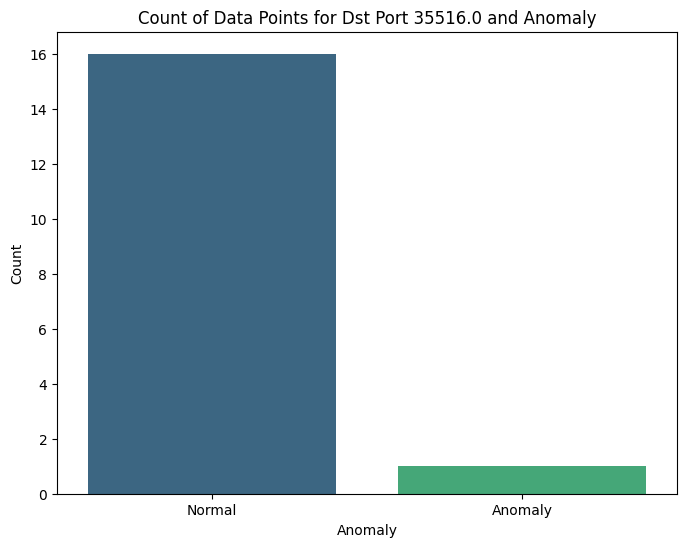

anomaly count:    anomaly  count
0        0      4
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


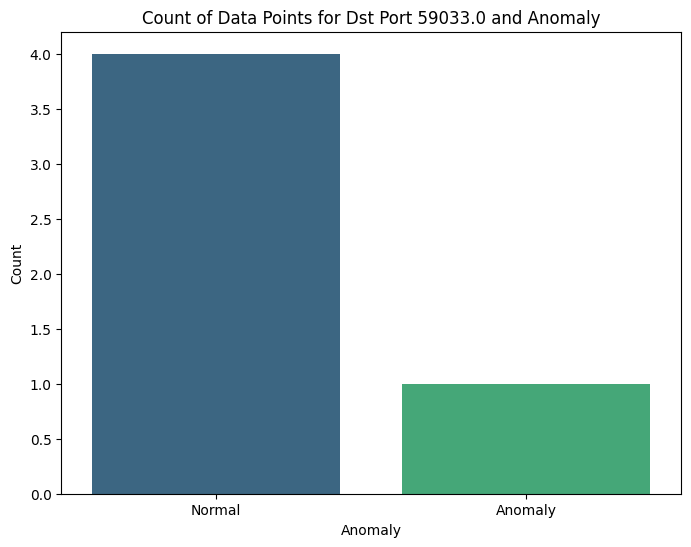

anomaly count:    anomaly  count
0        0     15
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


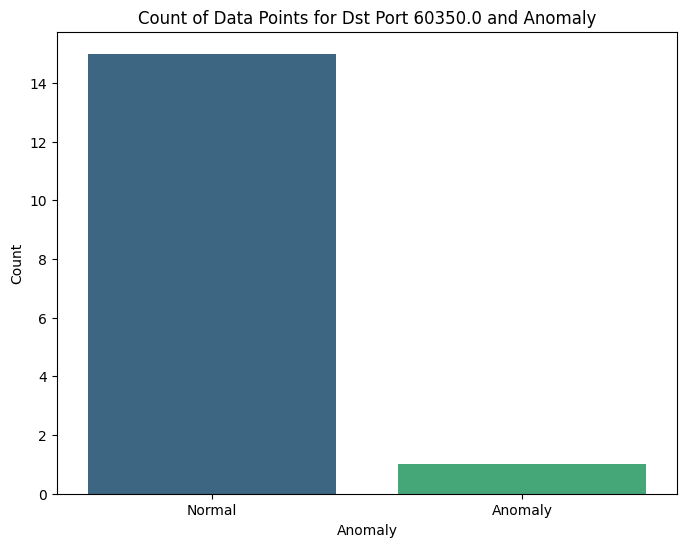

anomaly count:    anomaly  count
0        0      6


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


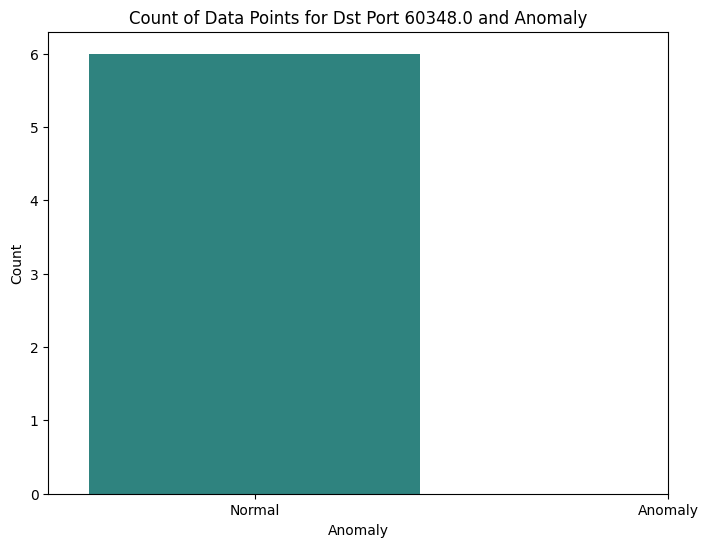

anomaly count:    anomaly  count
0        0      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


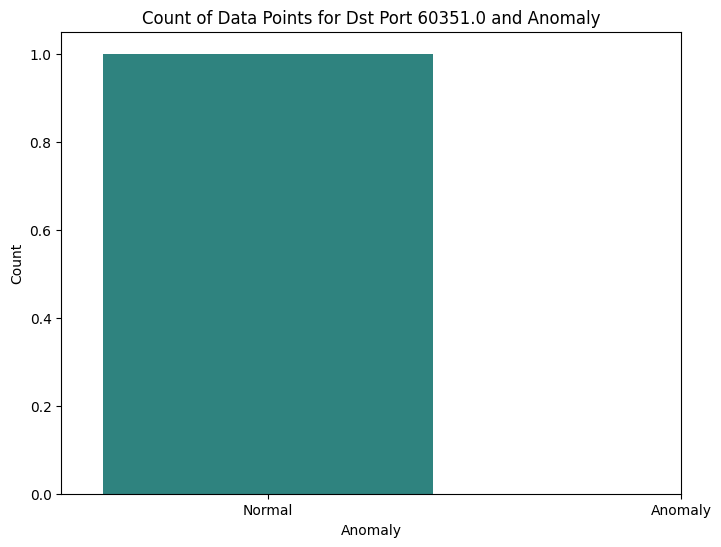

anomaly count:    anomaly  count
0        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


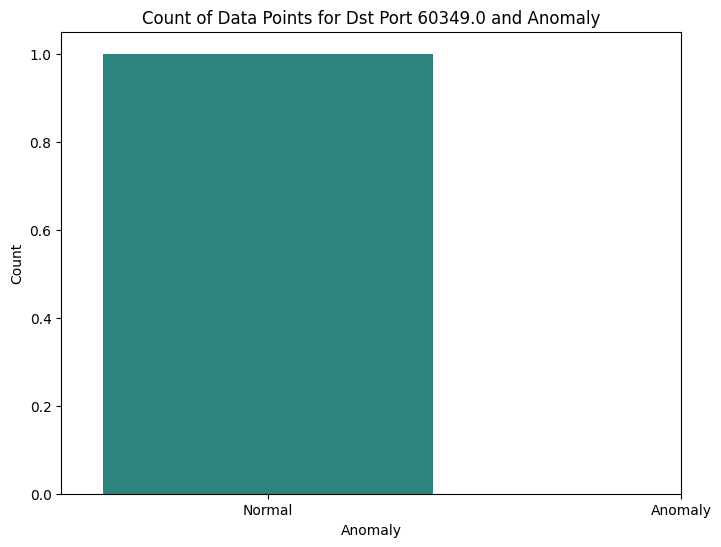

anomaly count:    anomaly  count
0        0     11
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/44549197.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


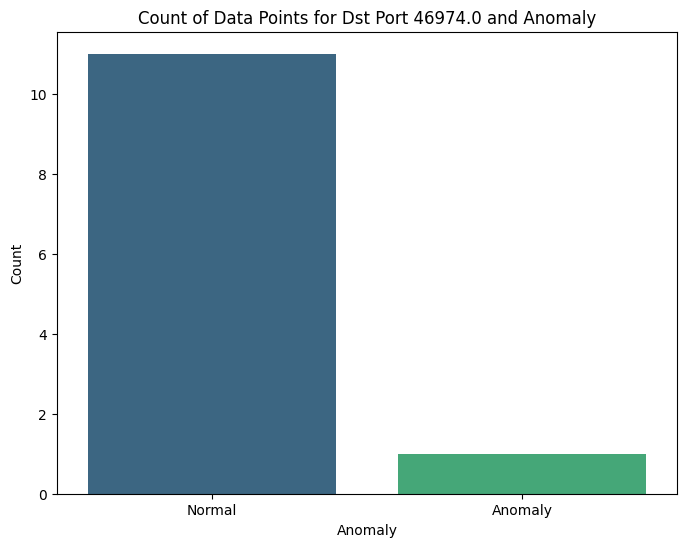

In [14]:
for port in unique_list_port[25:45]:
    current = df[df['Dst Port'] == port]
    
    anomaly_counts = current.groupby('anomaly').size().reset_index(name='count')
    
    if anomaly_counts.empty:
        continue
    else:
        print(f'anomaly count: {anomaly_counts}')
        plt.figure(figsize=(8, 6))
        sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')
        plt.title(f'Count of Data Points for Dst Port {port} and Anomaly')
        plt.xlabel('Anomaly')
        plt.ylabel('Count')
        plt.xticks(ticks=[0, 1], labels=['Normal', 'Anomaly'])
        plt.show()

anomaly count:    anomaly  count
0        0    648
1        1    850


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


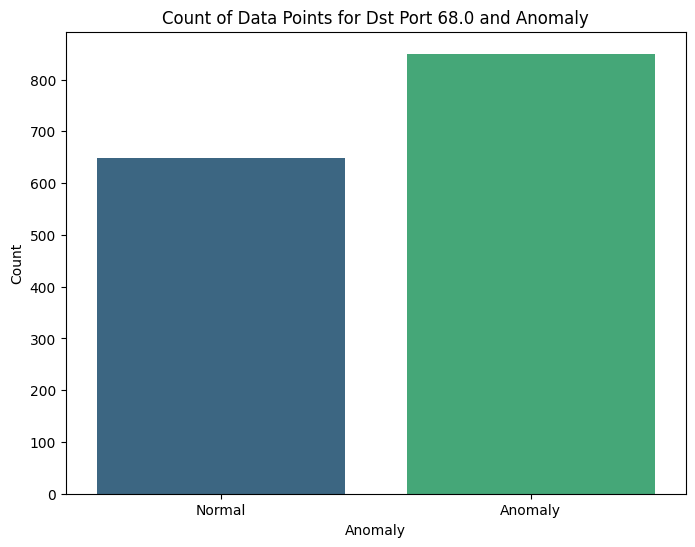

anomaly count:    anomaly  count
0        0     10
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


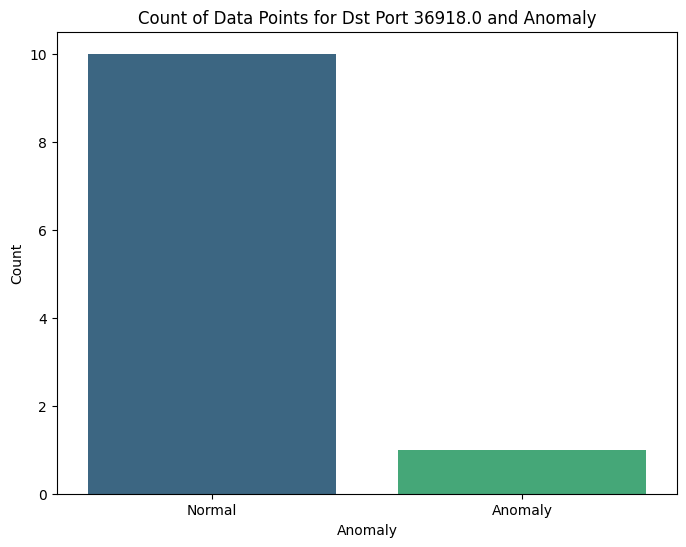

anomaly count:    anomaly  count
0        0      9
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


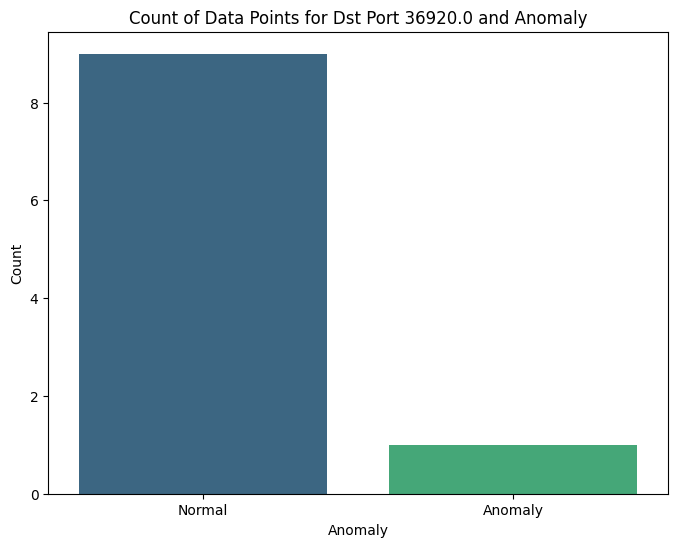

anomaly count:    anomaly  count
0        0      7
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


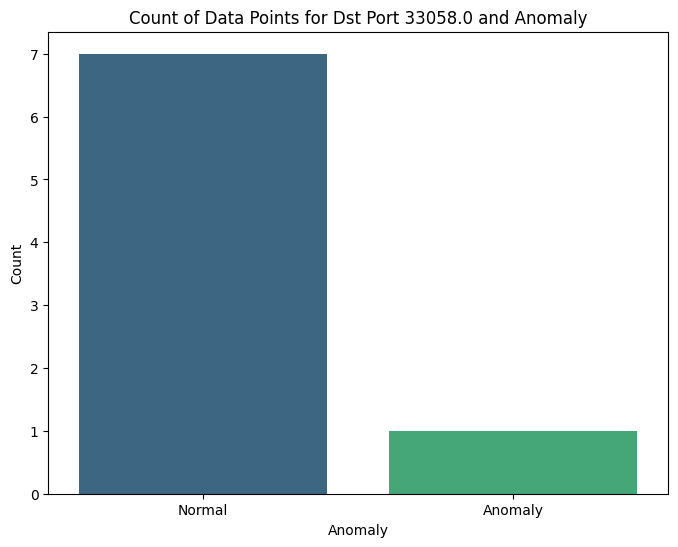

anomaly count:    anomaly  count
0        0     17
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


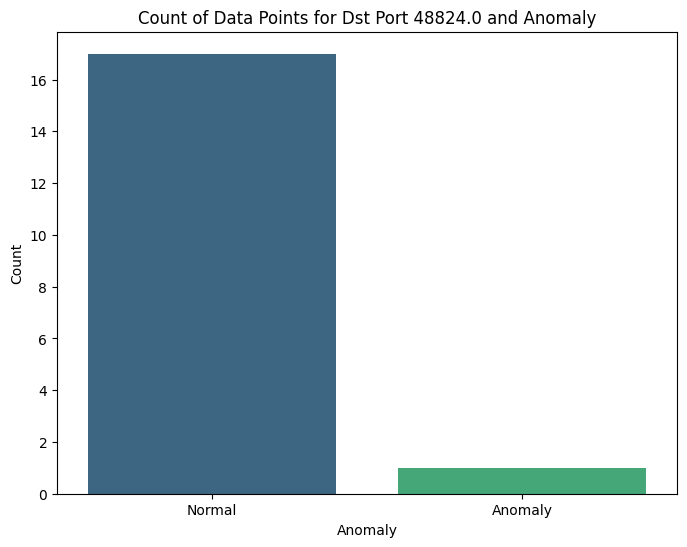

anomaly count:    anomaly  count
0        0     11
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


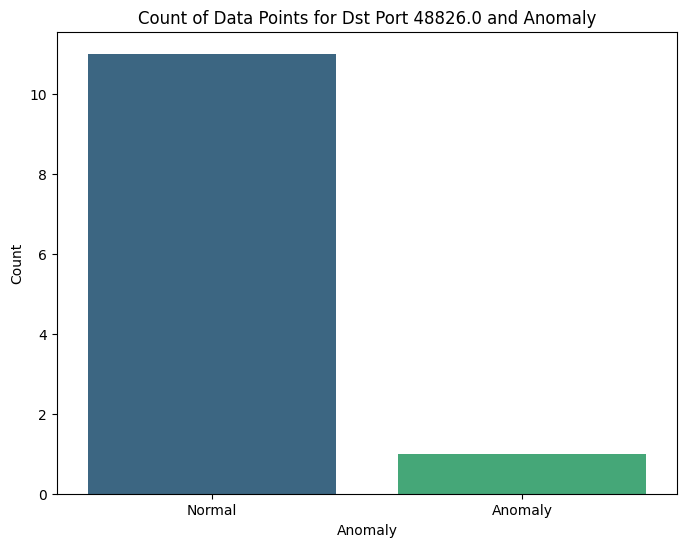

anomaly count:    anomaly   count
0        0  731662
1        1      45


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


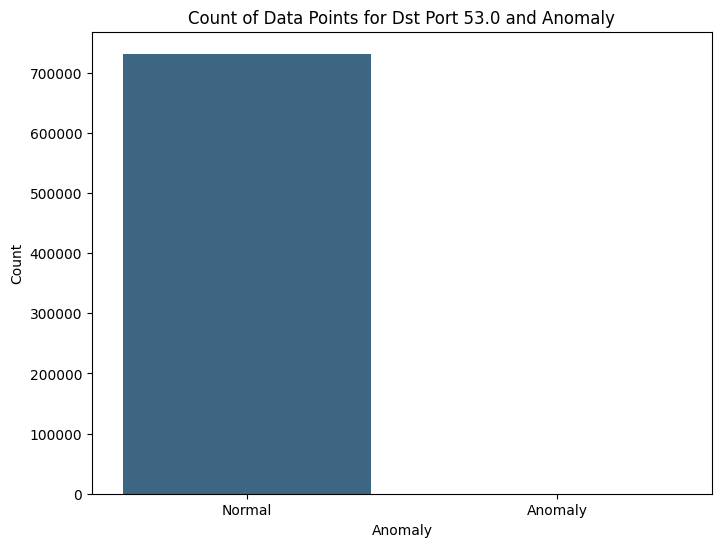

anomaly count:    anomaly  count
0        0     13


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


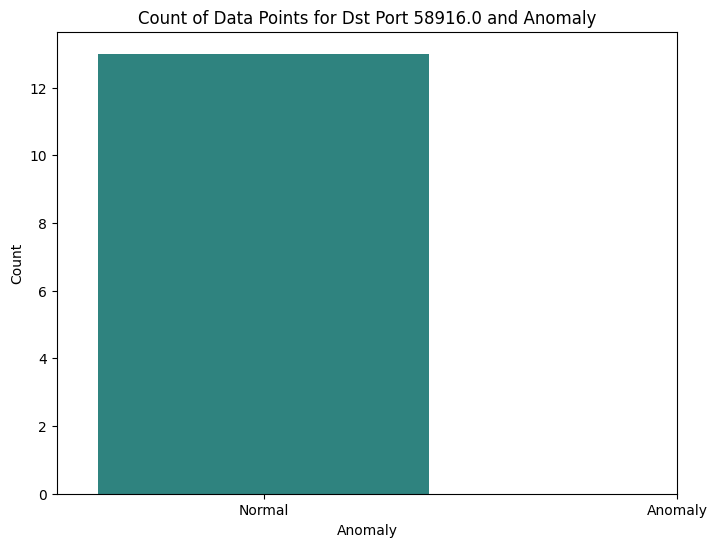

anomaly count:    anomaly  count
0        0     13
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


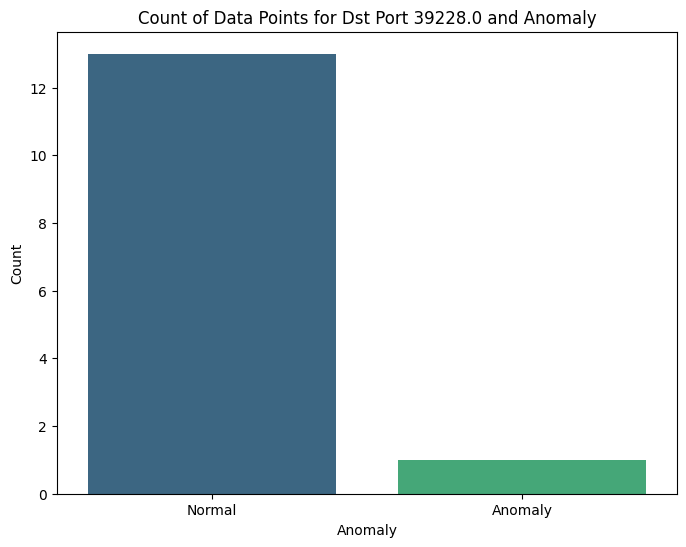

anomaly count:    anomaly  count
0        0      8


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


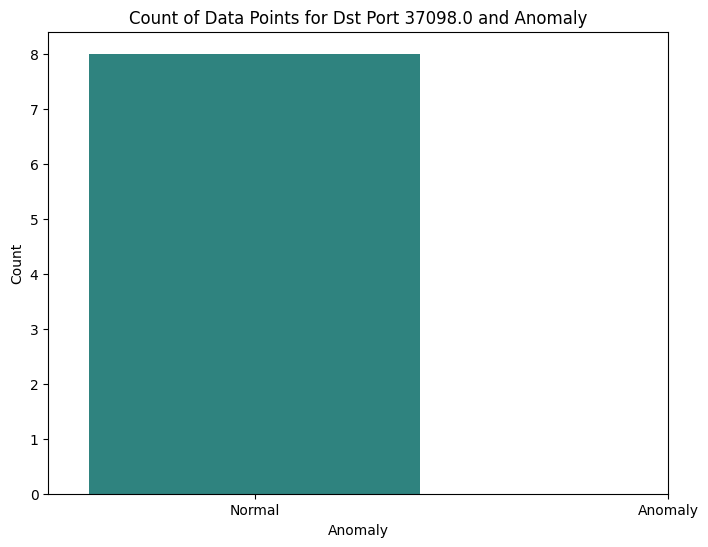

anomaly count:    anomaly  count
0        0      7


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


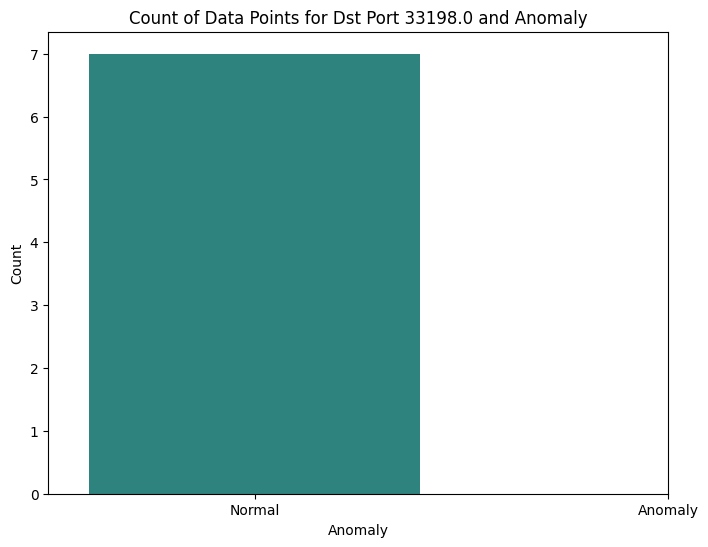

anomaly count:    anomaly  count
0        0     11


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


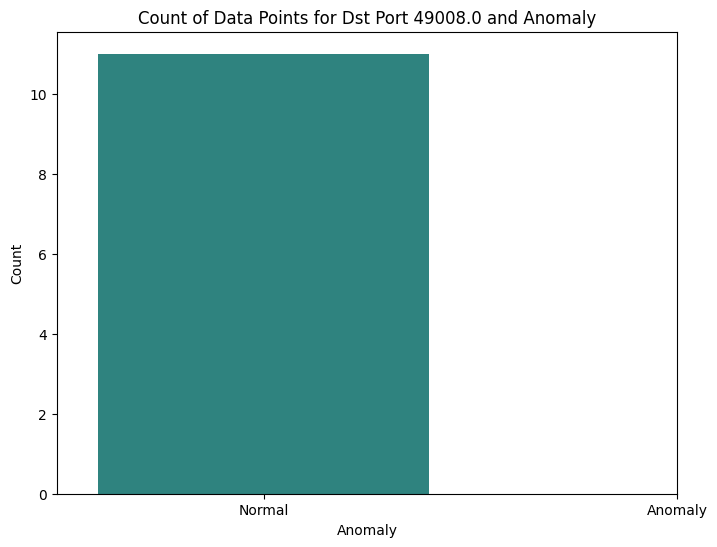

anomaly count:    anomaly  count
0        0      5
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


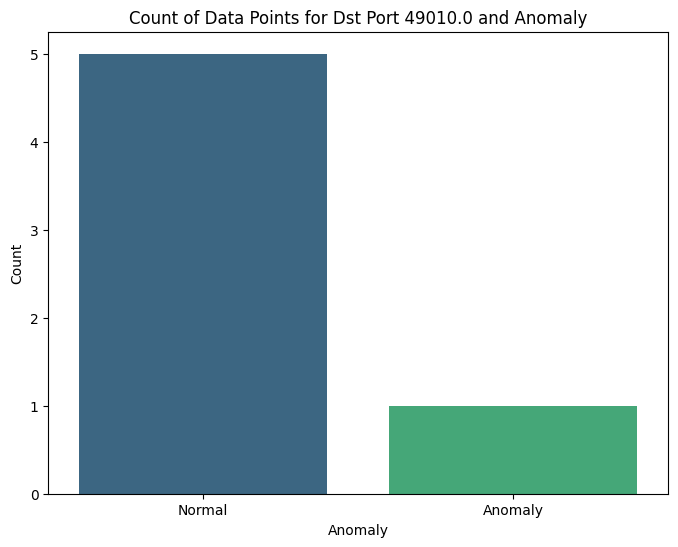

anomaly count:    anomaly  count
0        0      9


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


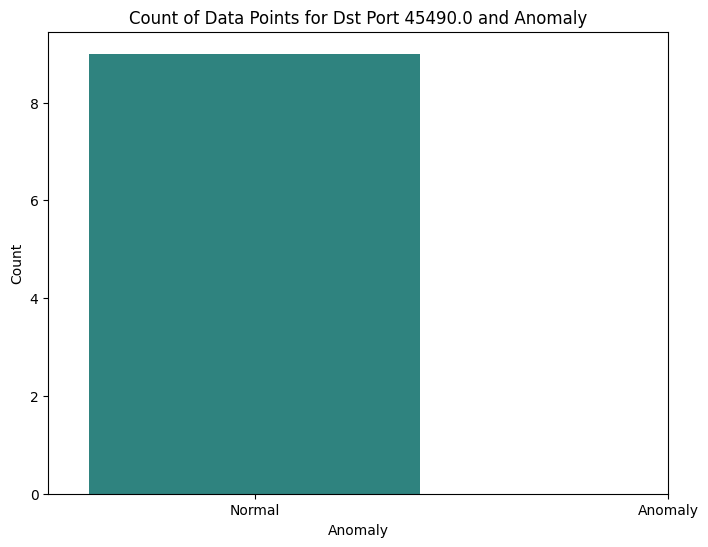

anomaly count:    anomaly  count
0        0     11


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


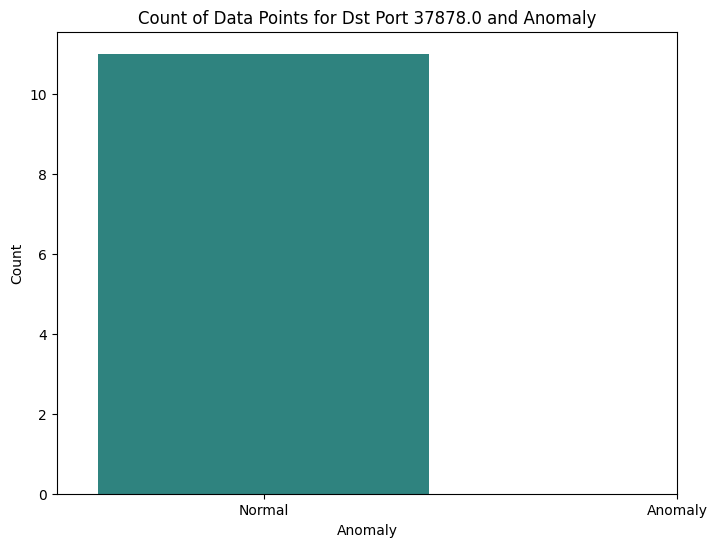

anomaly count:    anomaly  count
0        0     12
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


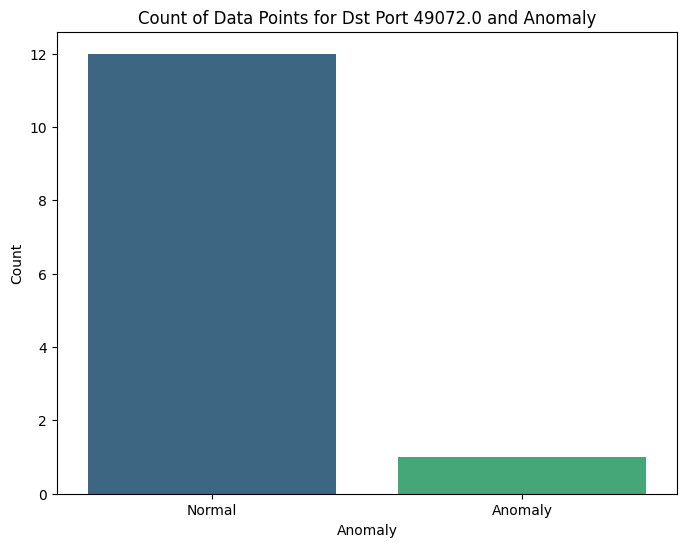

anomaly count:    anomaly  count
0        0      9


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


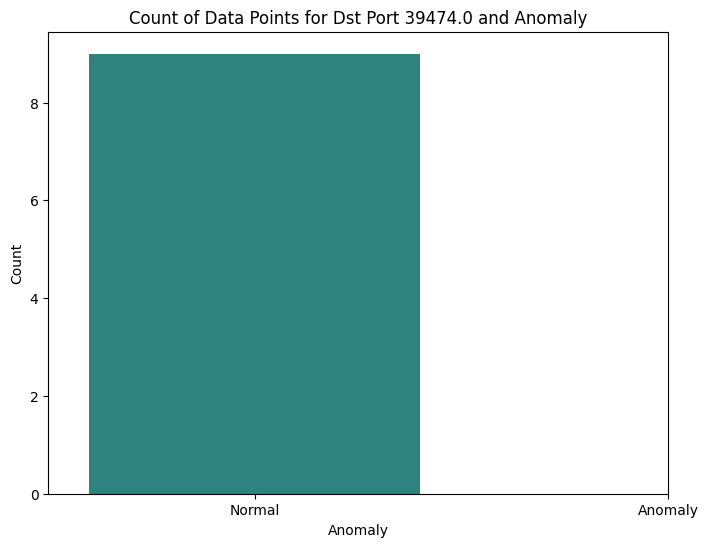

anomaly count:    anomaly  count
0        0     17


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


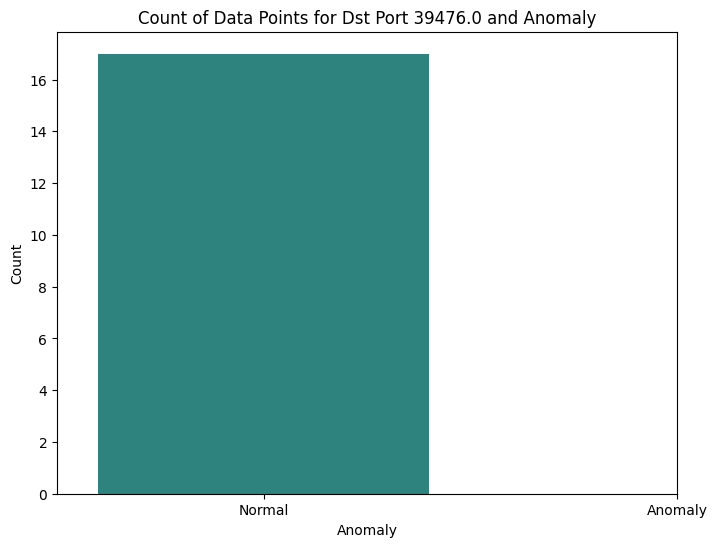

anomaly count:    anomaly  count
0        0      8


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


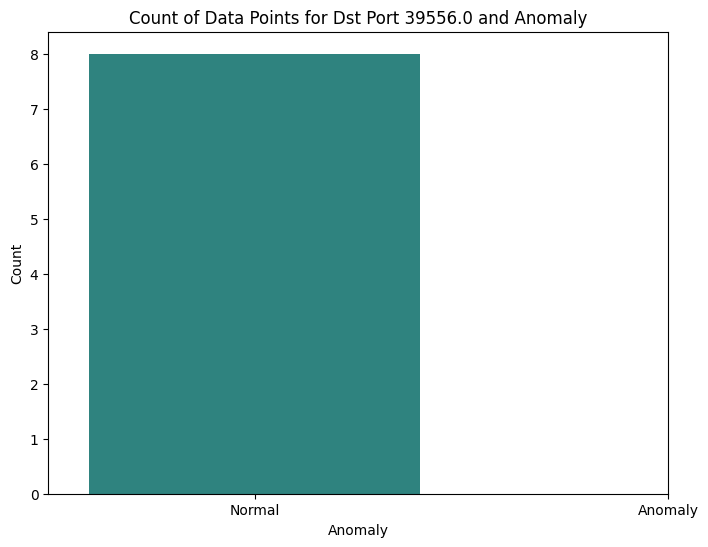

anomaly count:    anomaly  count
0        0     12
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


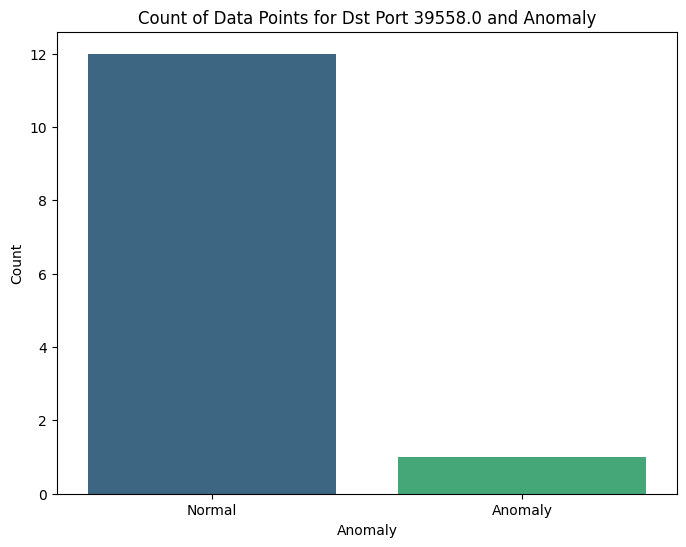

anomaly count:    anomaly  count
0        0     14
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


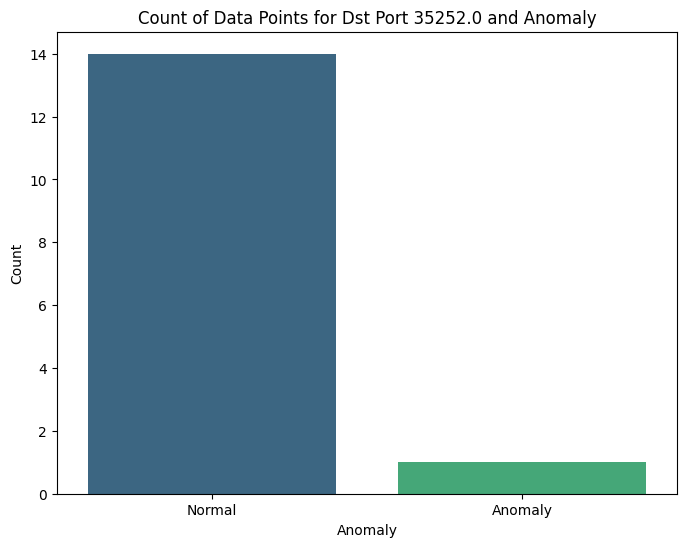

anomaly count:    anomaly  count
0        0     13


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


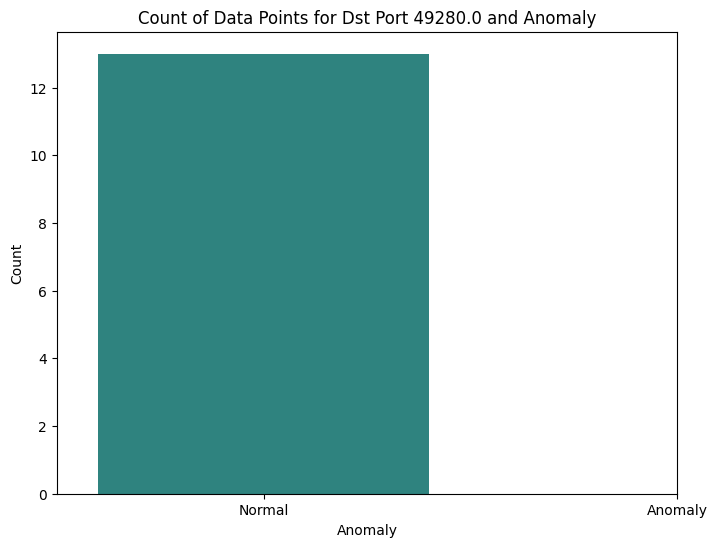

anomaly count:    anomaly  count
0        0     23
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


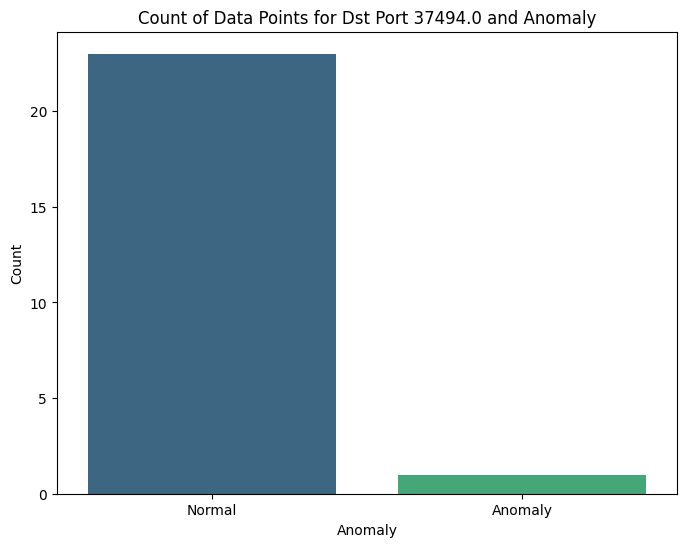

anomaly count:    anomaly  count
0        0      7
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


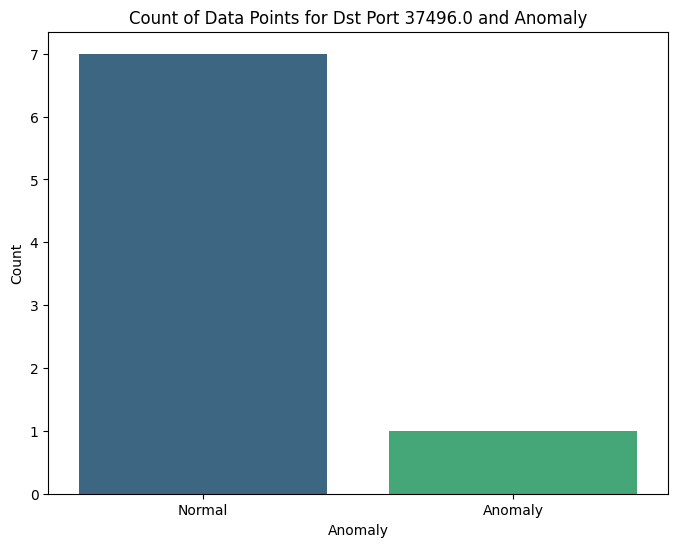

anomaly count:    anomaly  count
0        0     10

/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


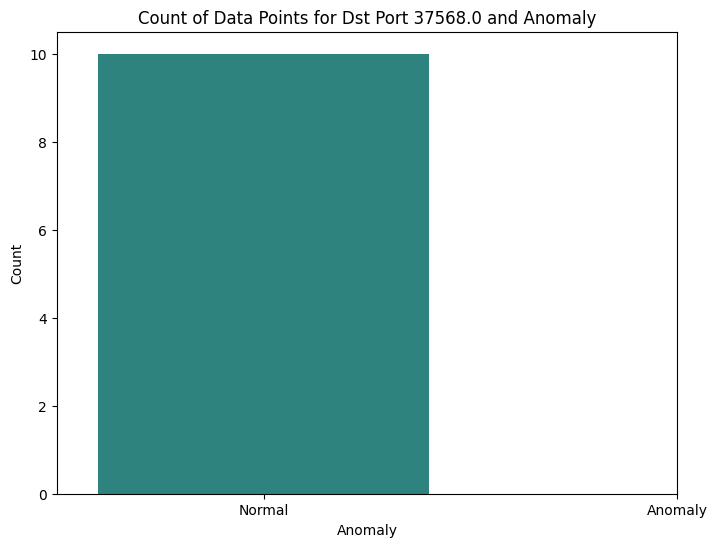

anomaly count:    anomaly  count
0        0     15


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


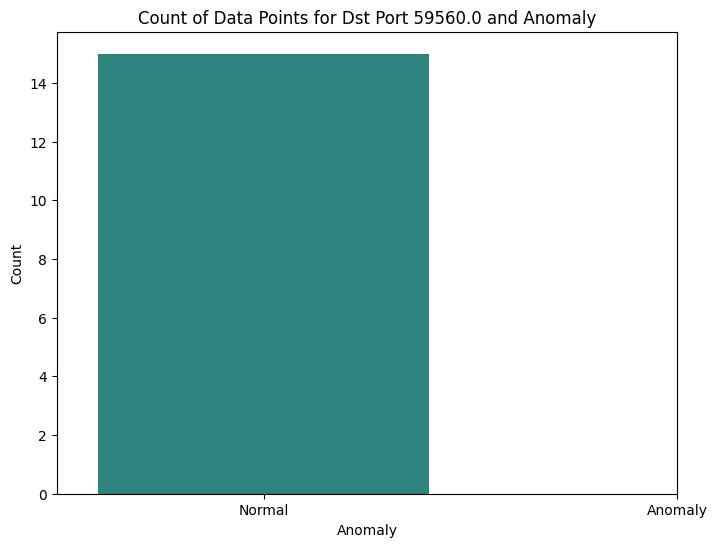

anomaly count:    anomaly  count
0        0     11
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


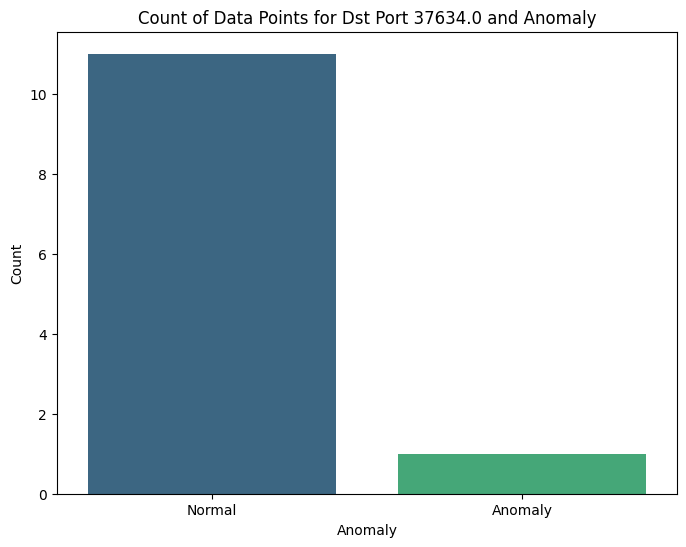

anomaly count:    anomaly  count
0        0      9
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


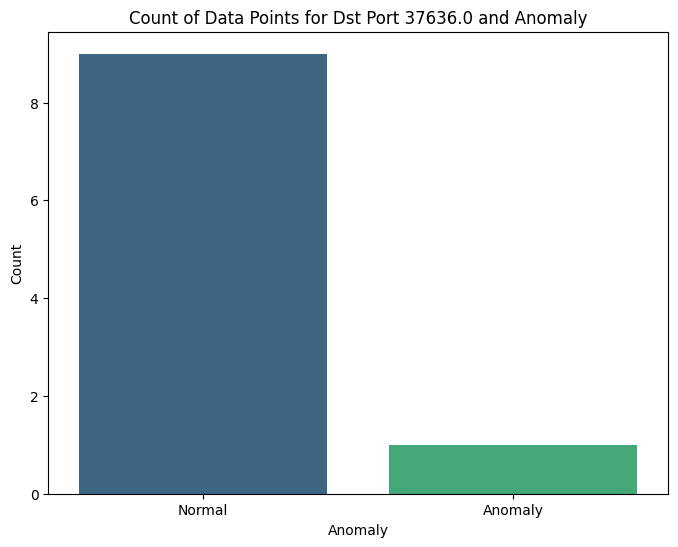

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


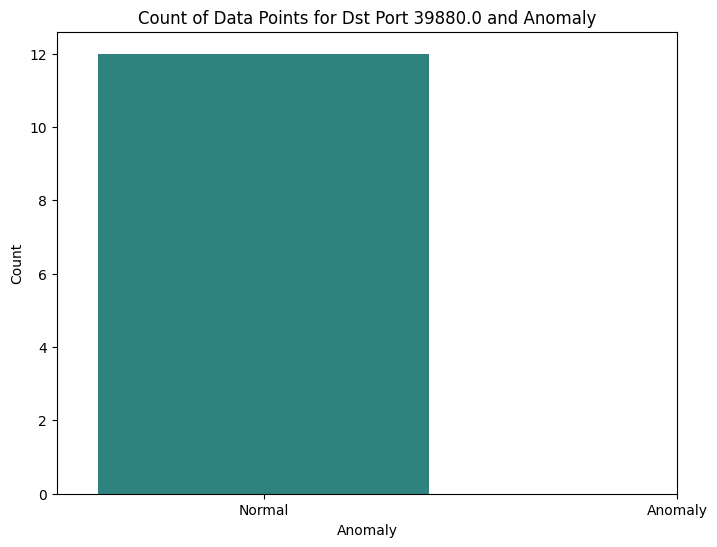

anomaly count:    anomaly  count
0        0      9


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


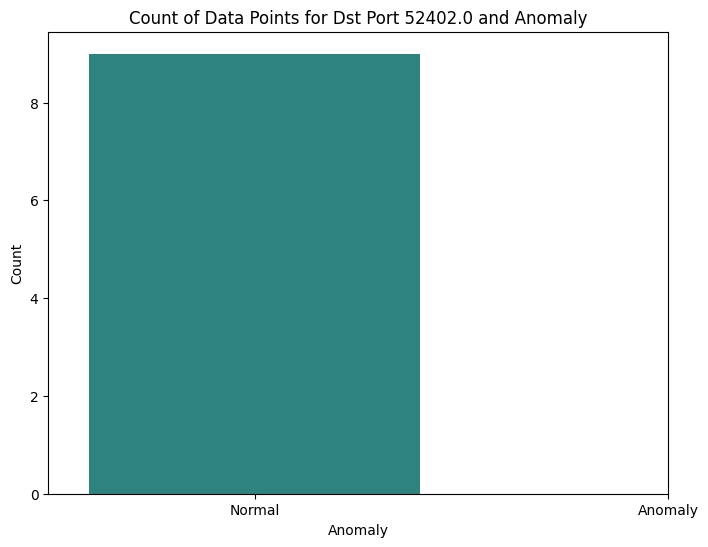

anomaly count:    anomaly  count
0        0     11
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


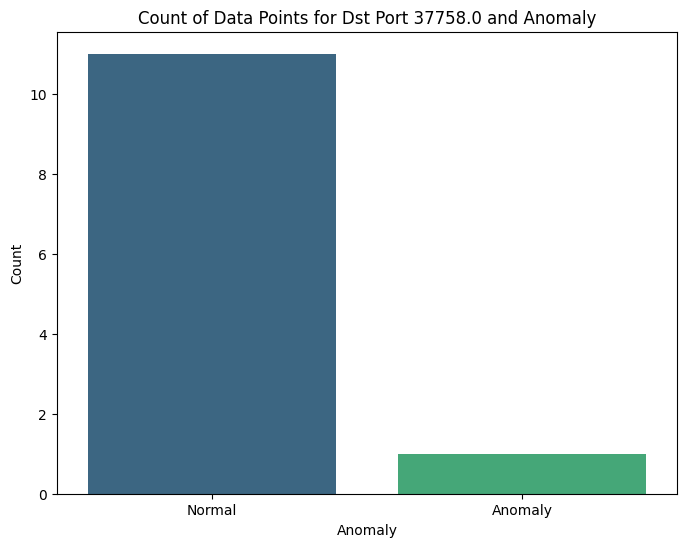

anomaly count:    anomaly  count
0        0     10


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


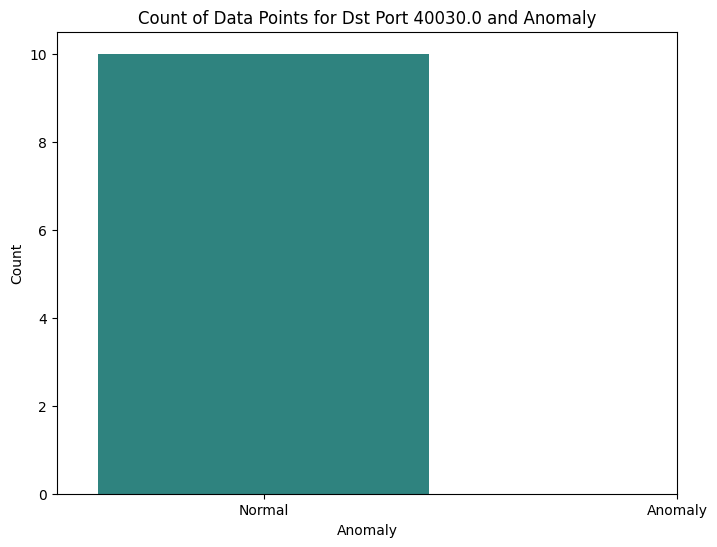

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


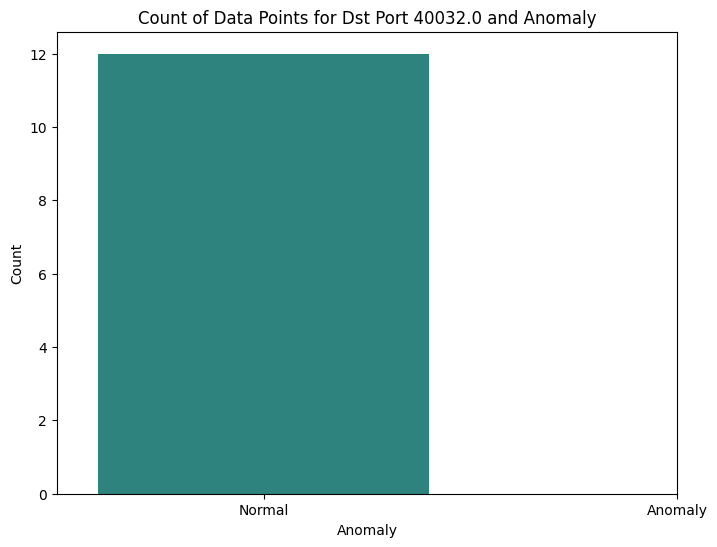

anomaly count:    anomaly  count
0        0     14
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


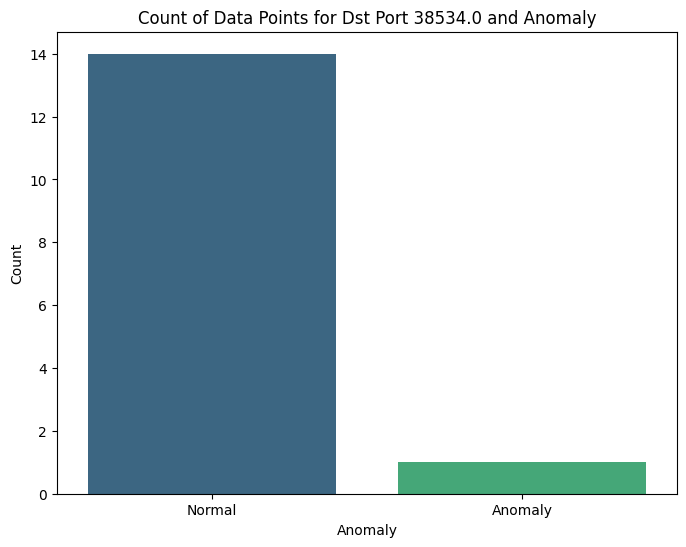

anomaly count:    anomaly  count
0        0    110
1        1    263


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


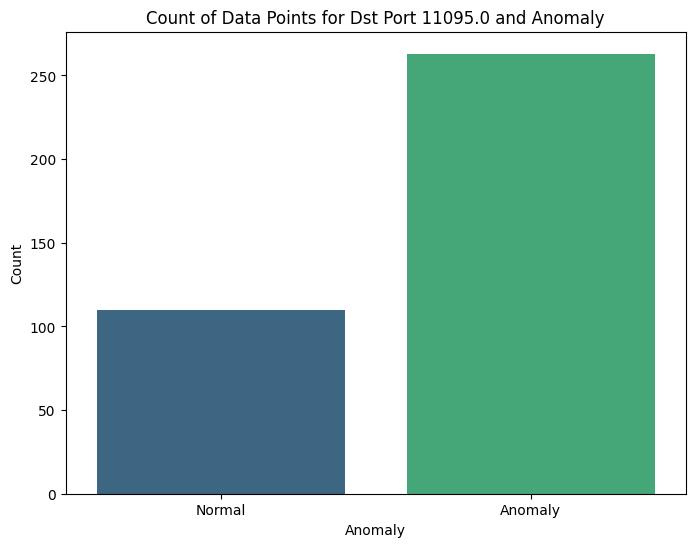

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


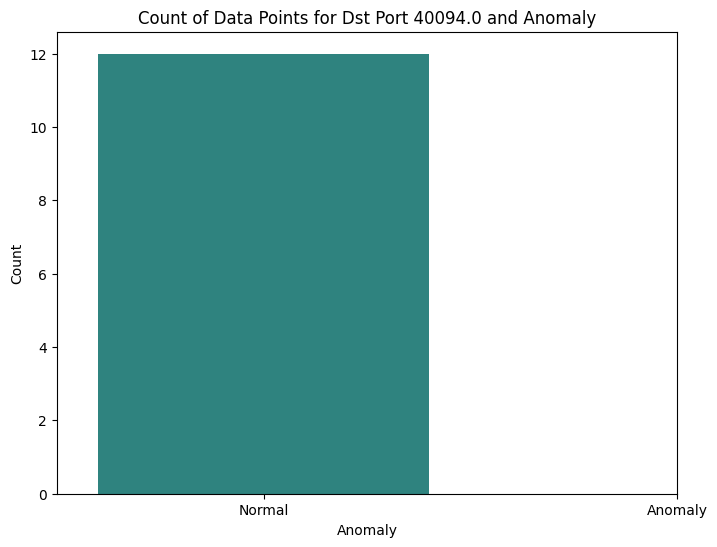

anomaly count:    anomaly  count
0        0     11


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


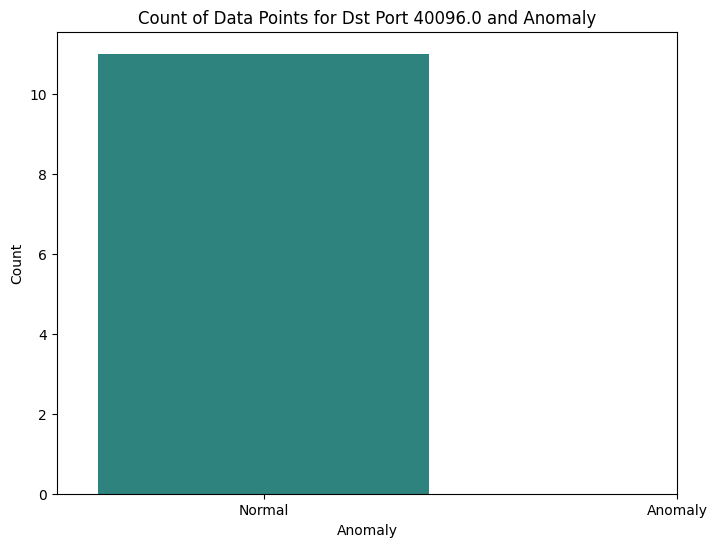

anomaly count:    anomaly  count
0        0     12
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


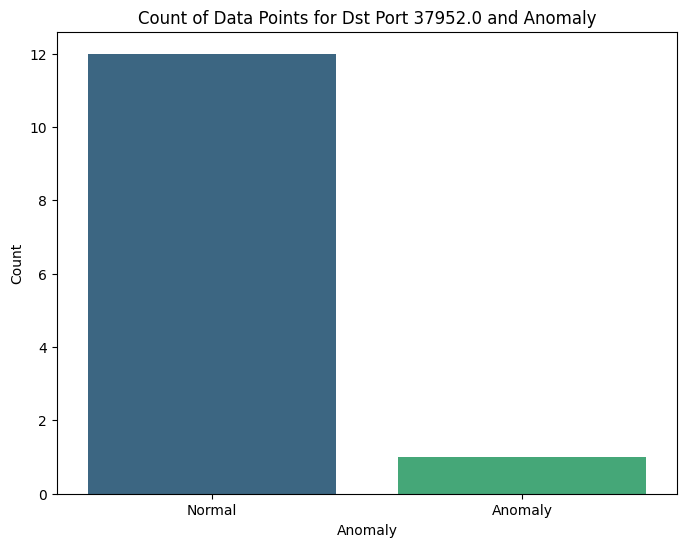

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


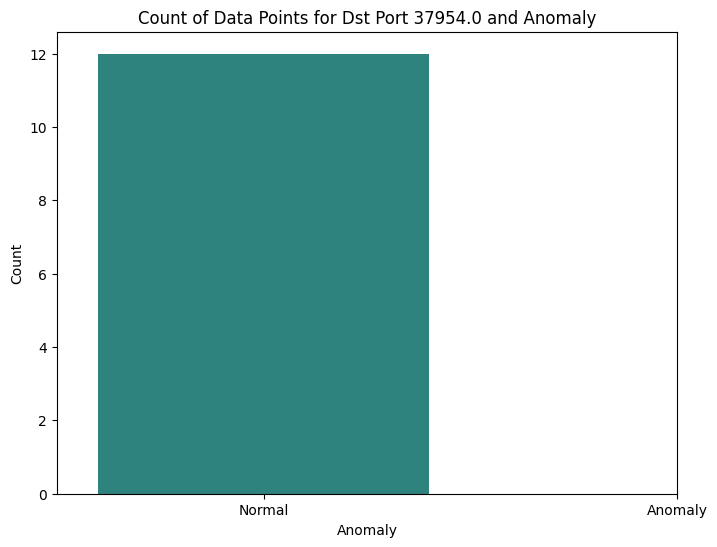

anomaly count:    anomaly  count
0        0     12
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


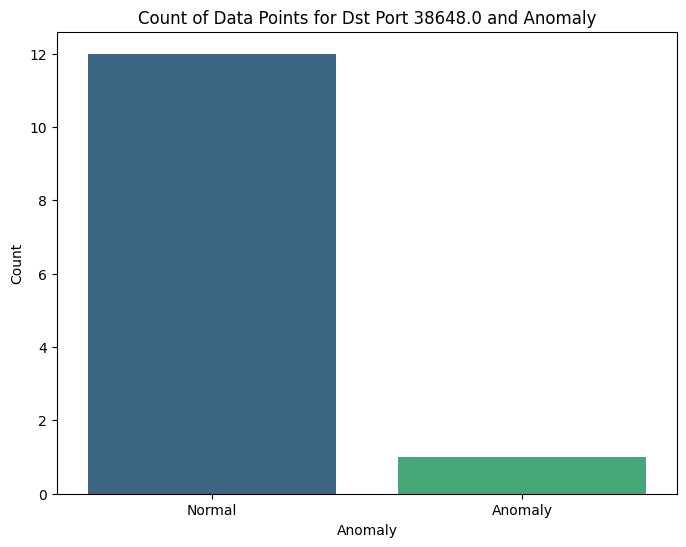

anomaly count:    anomaly  count
0        0     10
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


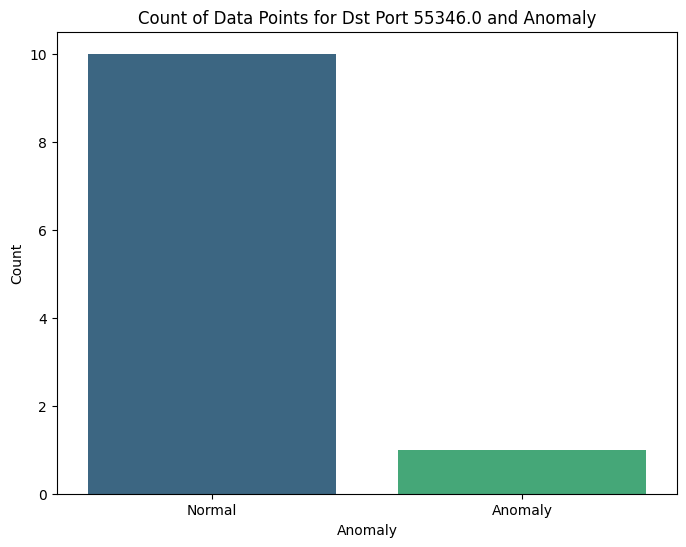

anomaly count:    anomaly  count
0        0     17


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


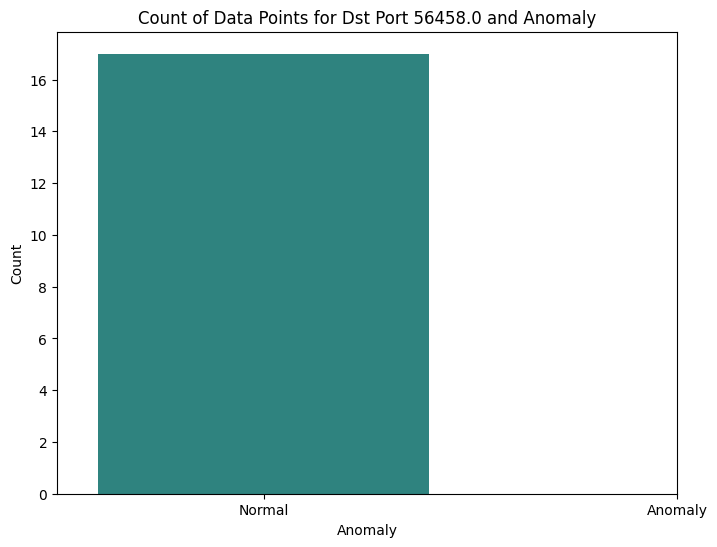

anomaly count:    anomaly  count
0        0      9


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


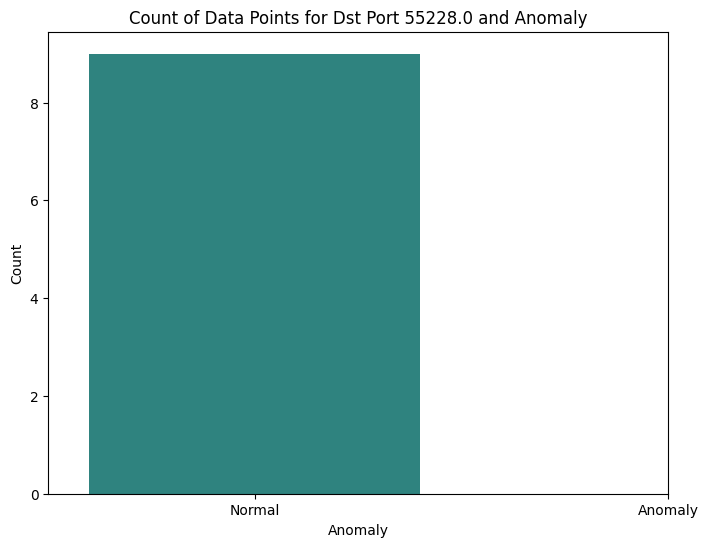

anomaly count:    anomaly  count
0        0     10
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


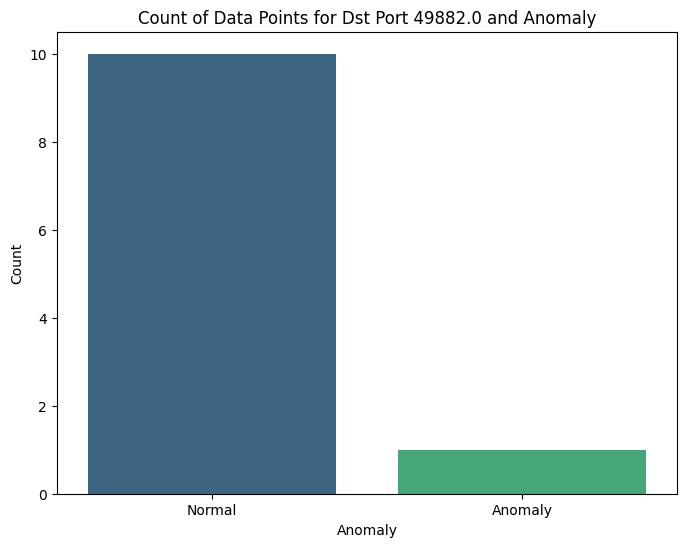

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


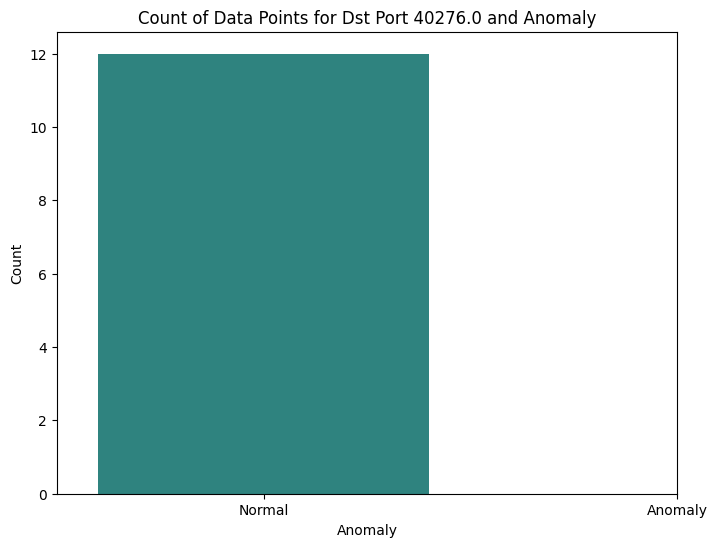

anomaly count:    anomaly  count
0        0     14


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


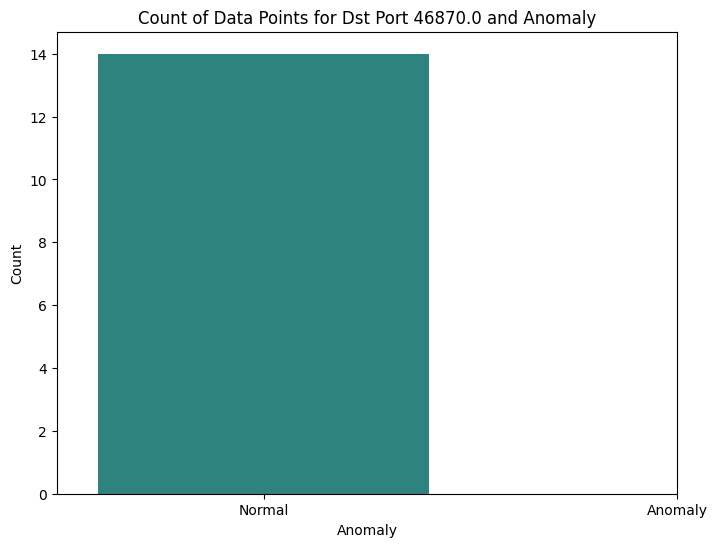

anomaly count:    anomaly  count
0        0     15


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


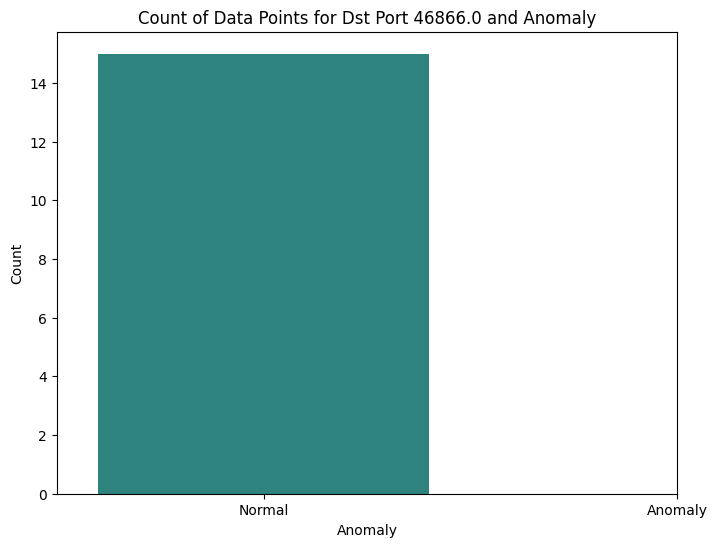

anomaly count:    anomaly  count
0        0     13


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


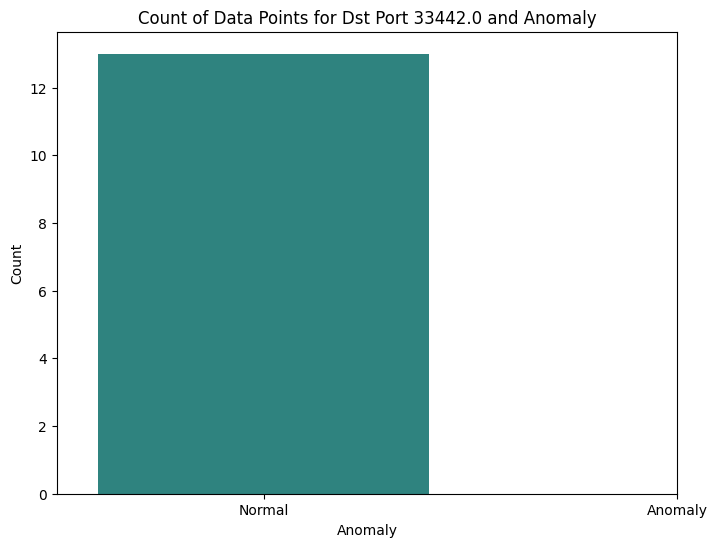

anomaly count:    anomaly  count
0        0     13


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


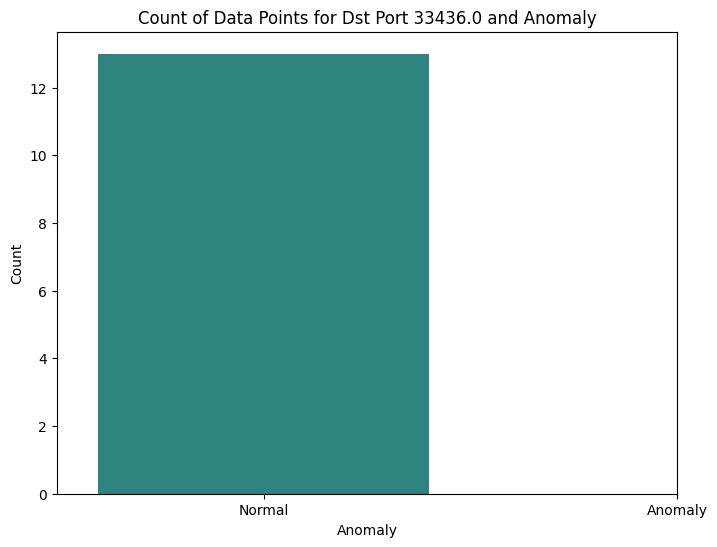

anomaly count:    anomaly  count
0        0     13

/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


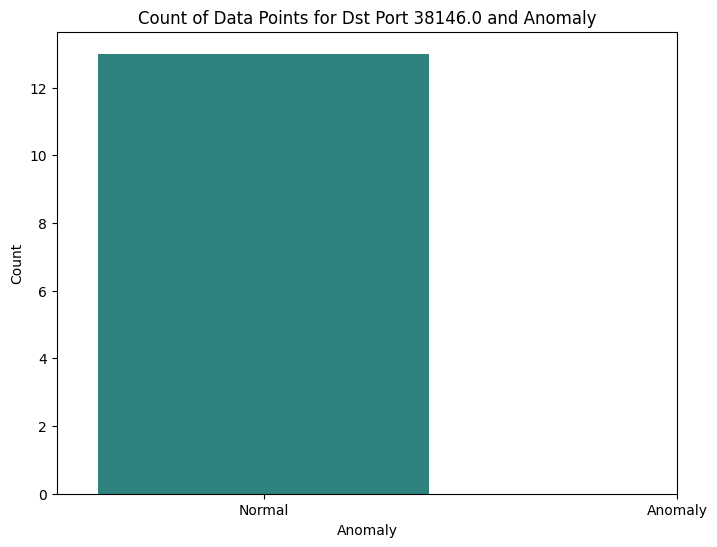

anomaly count:    anomaly  count
0        0      7


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


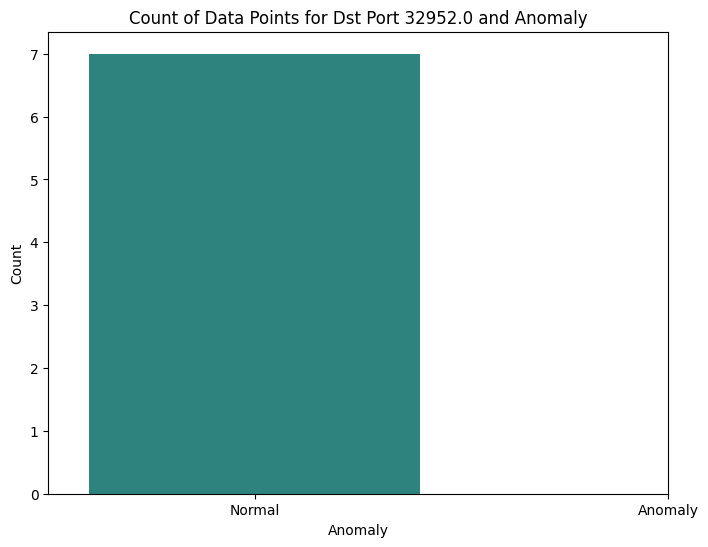

anomaly count:    anomaly  count
0        0     11


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


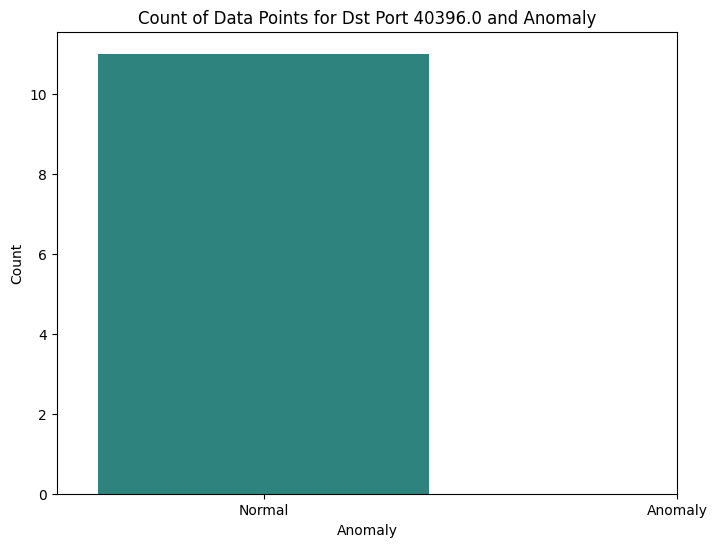

anomaly count:    anomaly  count
0        0   1258


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


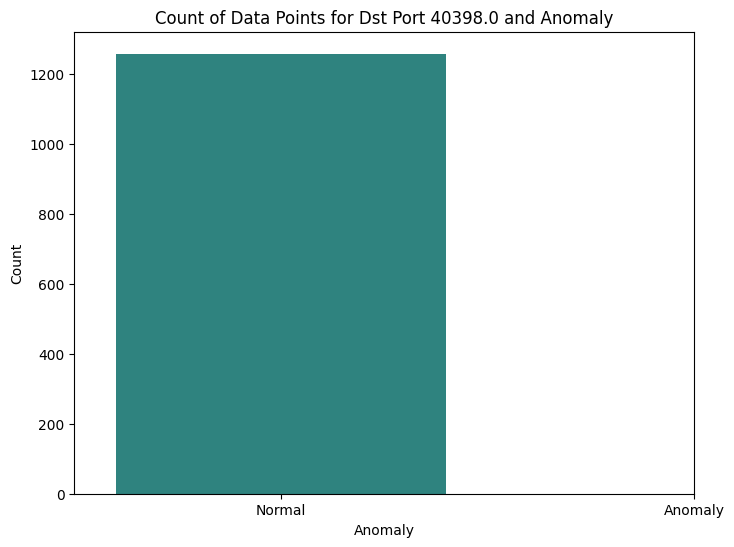

anomaly count:    anomaly  count
0        0     10


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


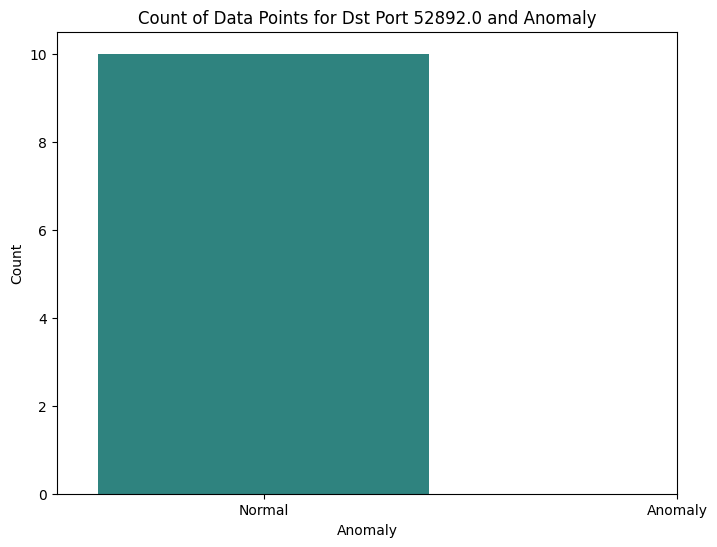

anomaly count:    anomaly  count
0        0     11


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


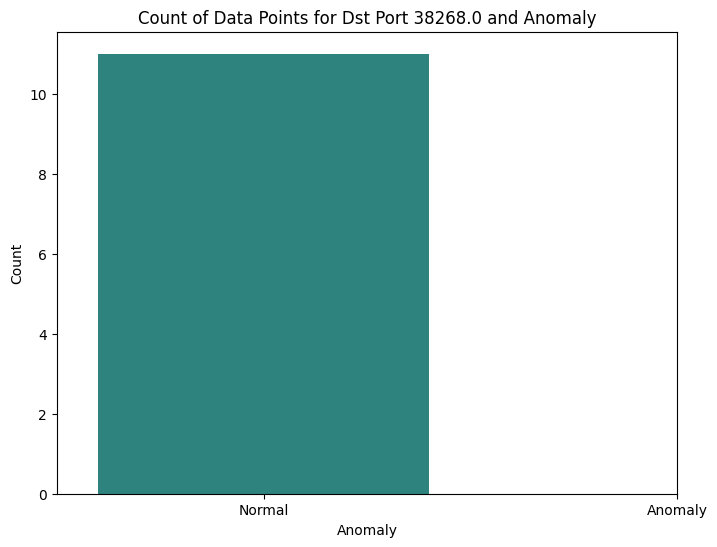

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


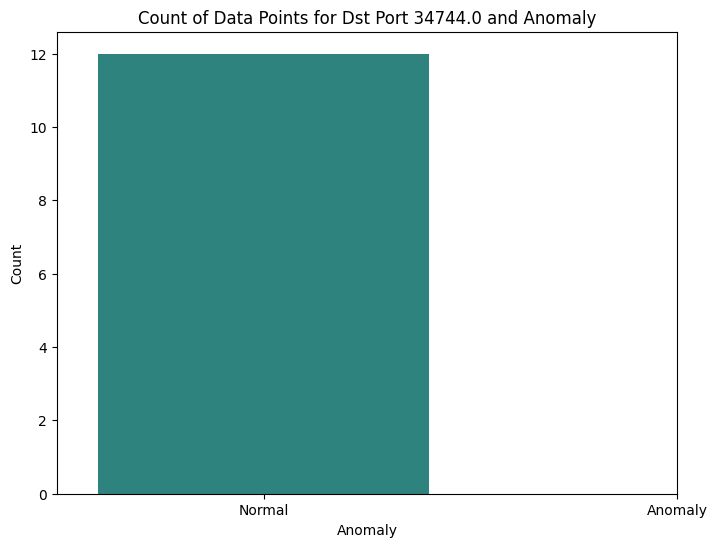

anomaly count:    anomaly  count
0        0      9


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


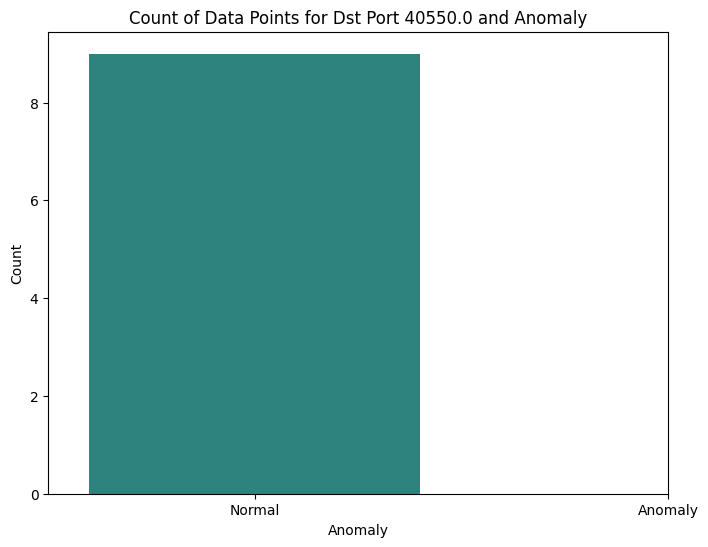

anomaly count:    anomaly  count
0        0   1209


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


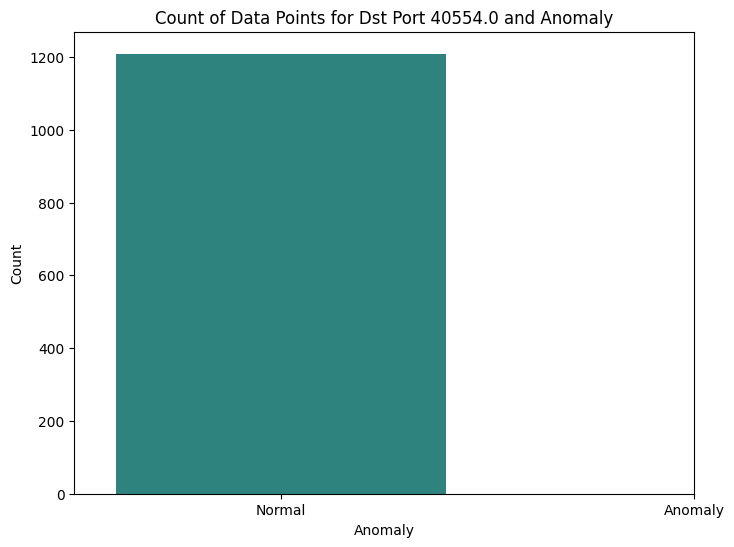

anomaly count:    anomaly  count
0        0     12
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


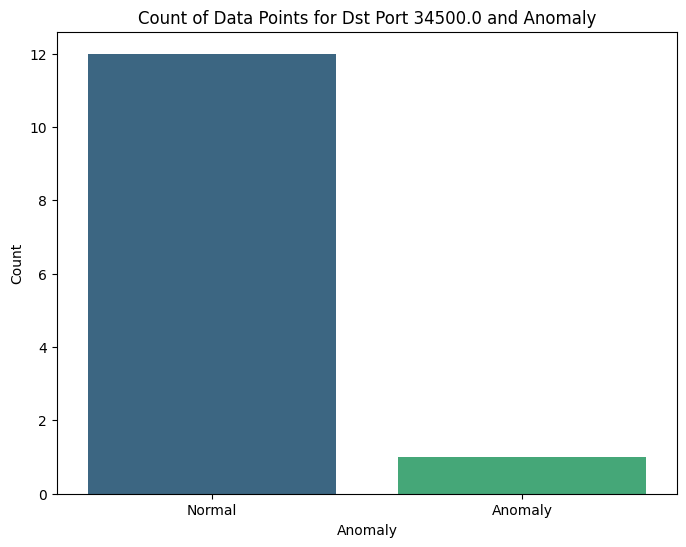

anomaly count:    anomaly  count
0        0      9
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/769622150.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


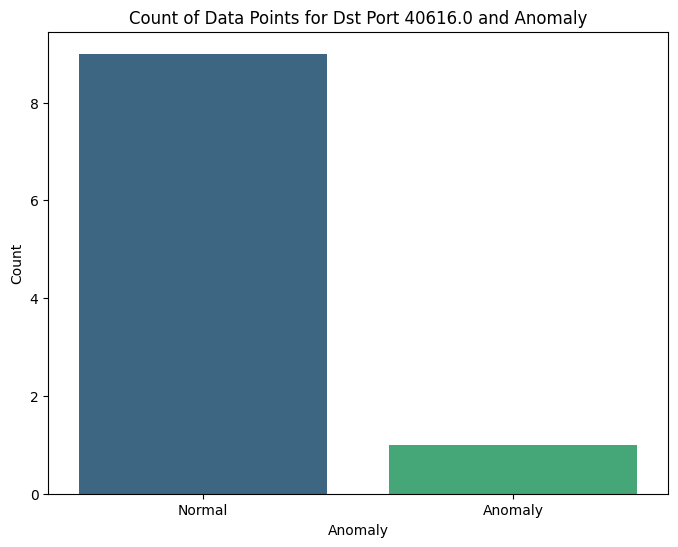

In [15]:
for port in unique_list_port[45:105]:
    current = df[df['Dst Port'] == port]
    
    anomaly_counts = current.groupby('anomaly').size().reset_index(name='count')
    
    if anomaly_counts.empty:
        continue
    else:
        print(f'anomaly count: {anomaly_counts}')
        plt.figure(figsize=(8, 6))
        sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')
        plt.title(f'Count of Data Points for Dst Port {port} and Anomaly')
        plt.xlabel('Anomaly')
        plt.ylabel('Count')
        plt.xticks(ticks=[0, 1], labels=['Normal', 'Anomaly'])
        plt.show()

anomaly count:    anomaly  count
0        0     14


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


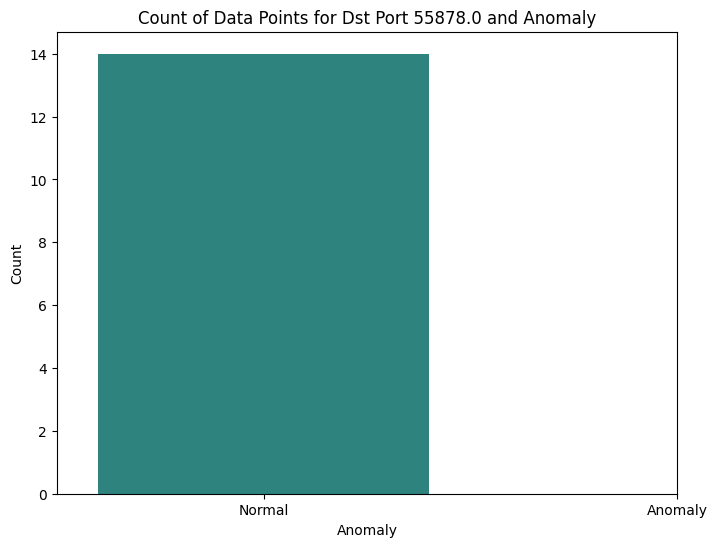

anomaly count:    anomaly  count
0        0      9


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


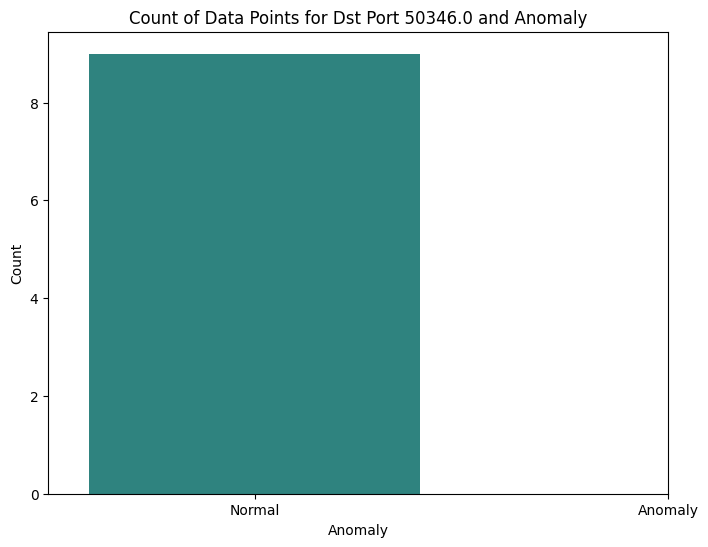

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


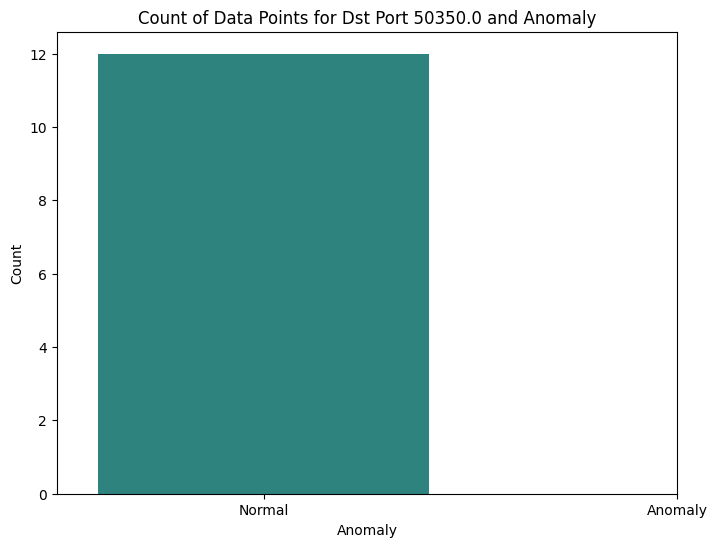

anomaly count:    anomaly  count
0        0      4


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


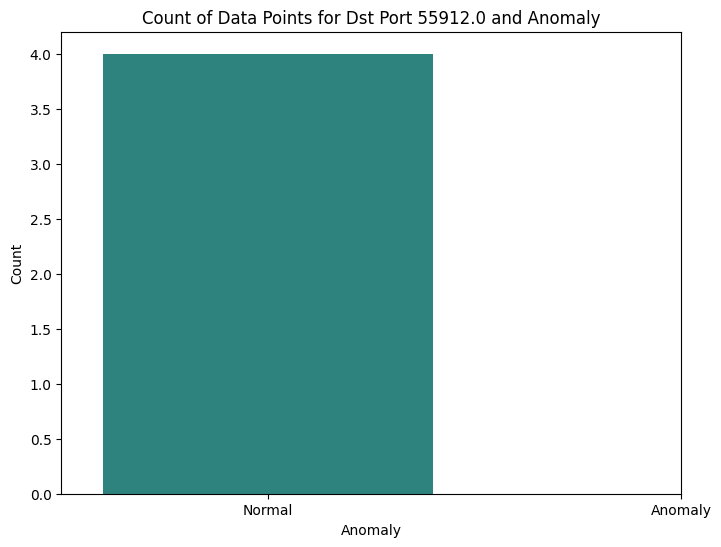

anomaly count:    anomaly  count
0        0     16
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


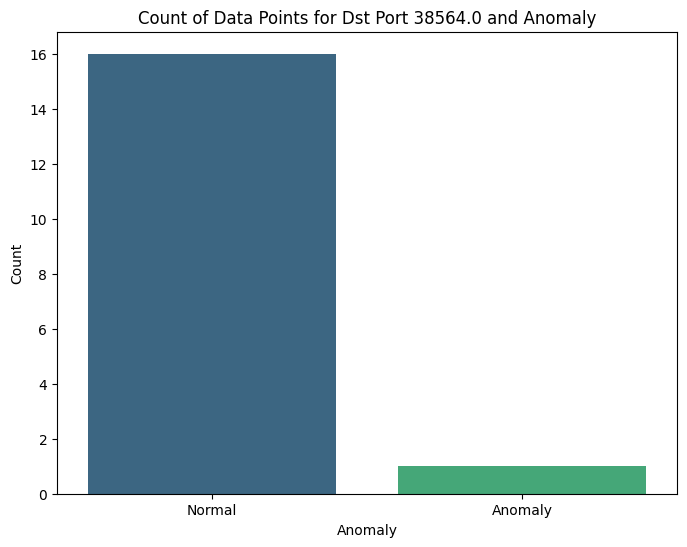

anomaly count:    anomaly  count
0        0     16


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


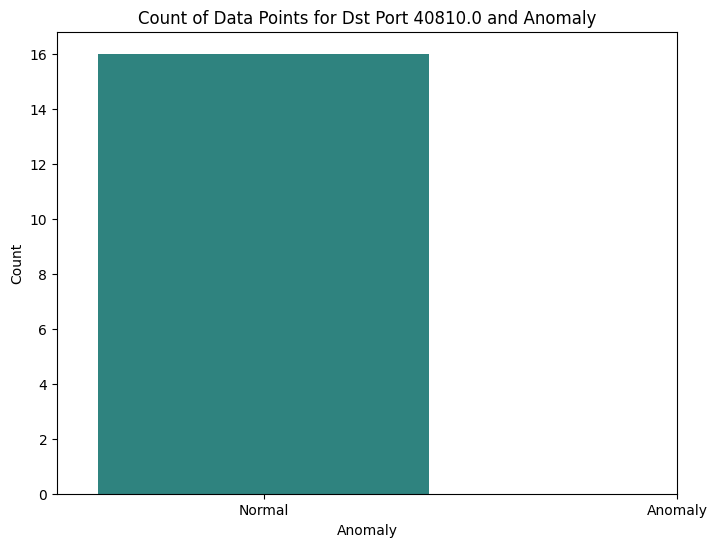

anomaly count:    anomaly  count
0        0      9
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


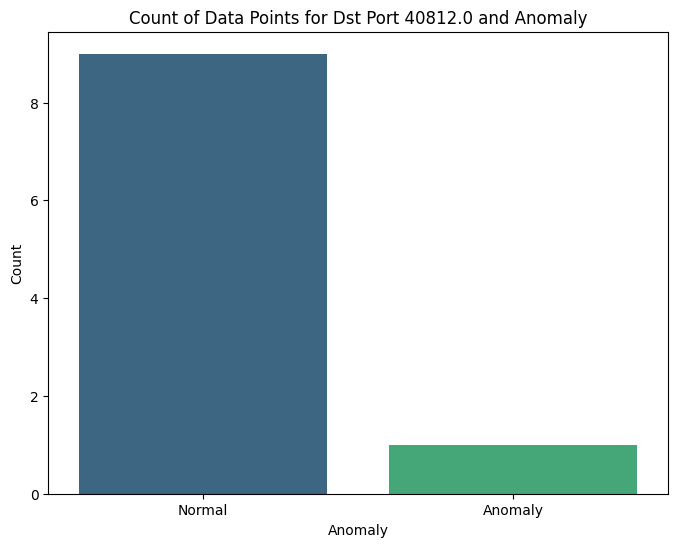

anomaly count:    anomaly  count
0        0     14


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


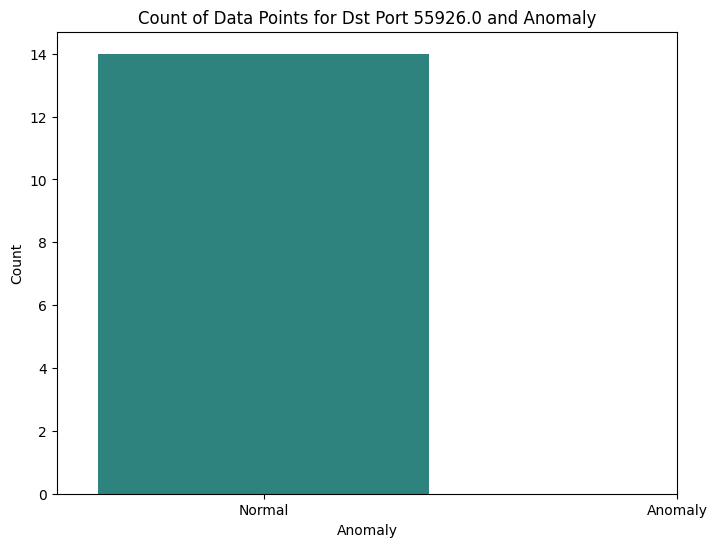

anomaly count:    anomaly  count
0        0     11


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


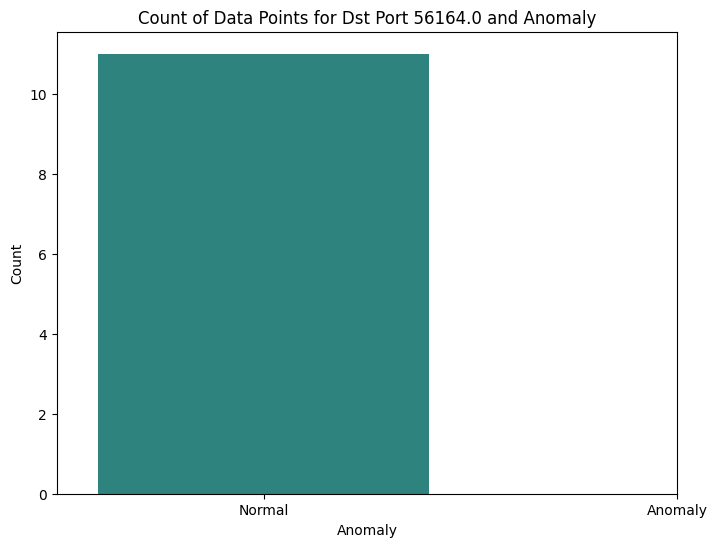

anomaly count:    anomaly  count
0        0      9


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


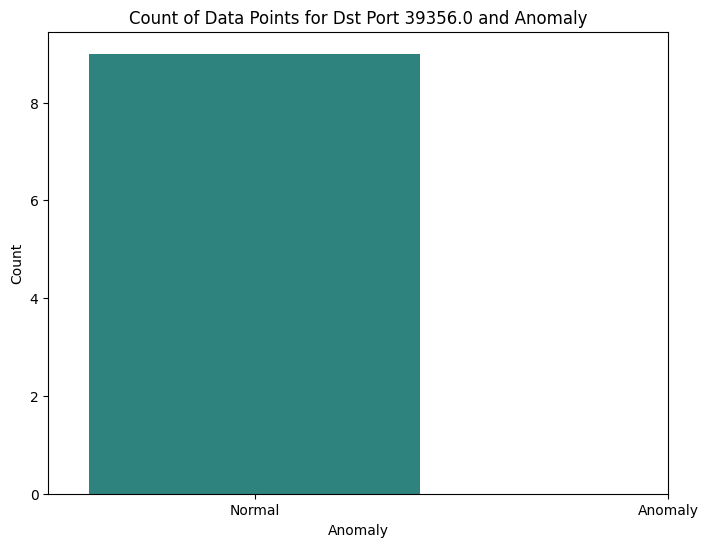

anomaly count:    anomaly  count
0        0     10
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


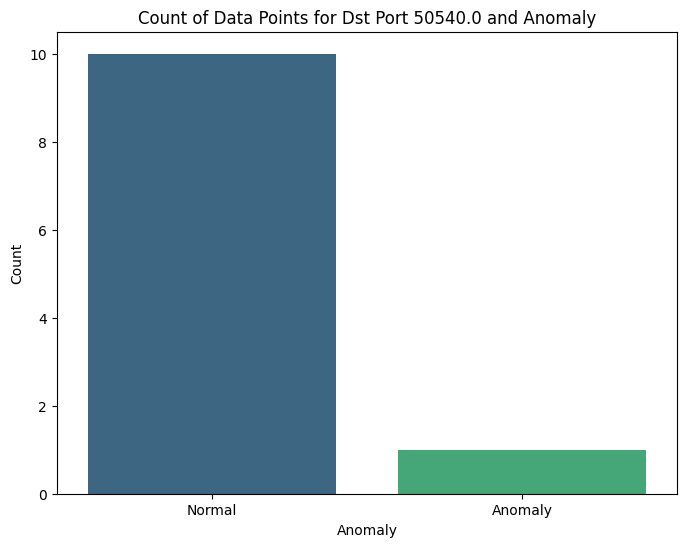

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


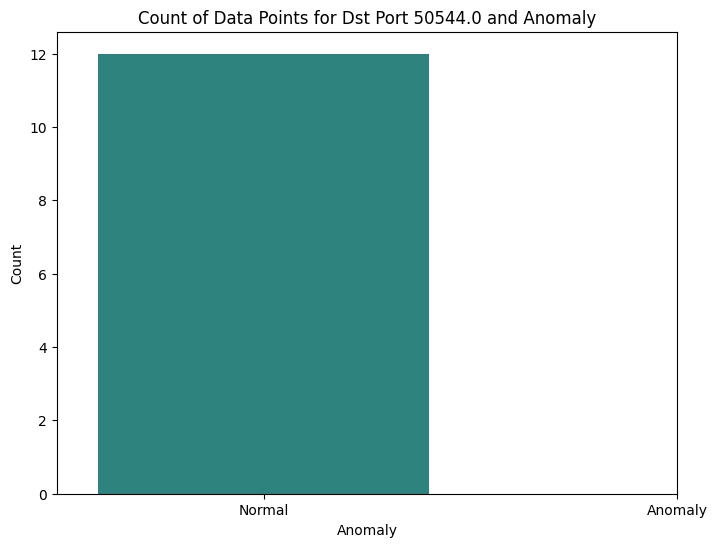

anomaly count:    anomaly  count
0        0     10


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


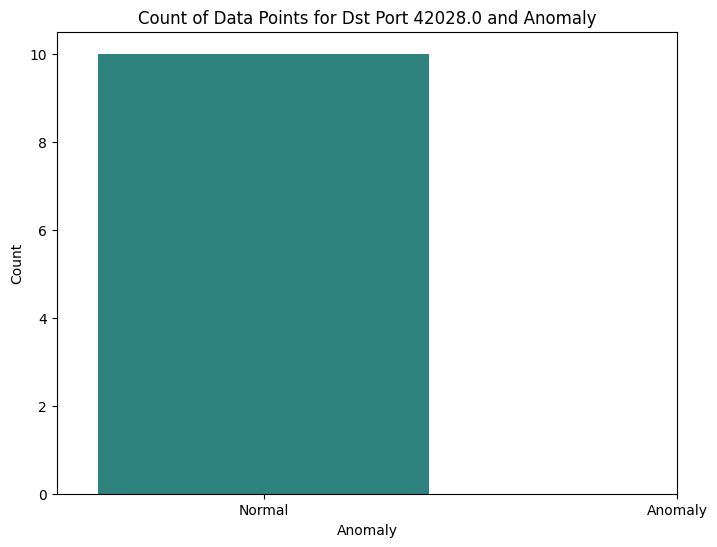

anomaly count:    anomaly  count
0        0      9
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


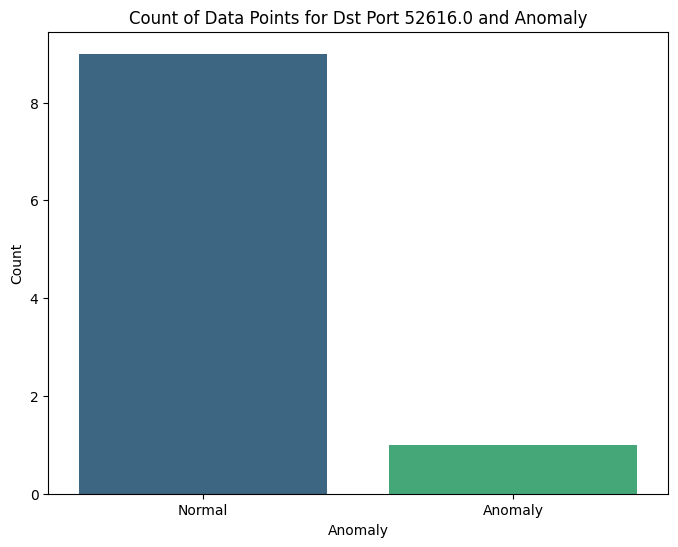

anomaly count:    anomaly  count
0        0     15
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


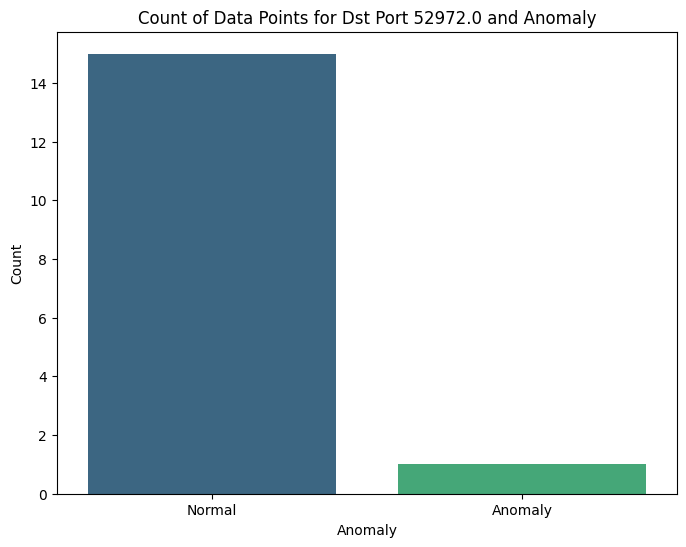

anomaly count:    anomaly  count
0        0      9


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


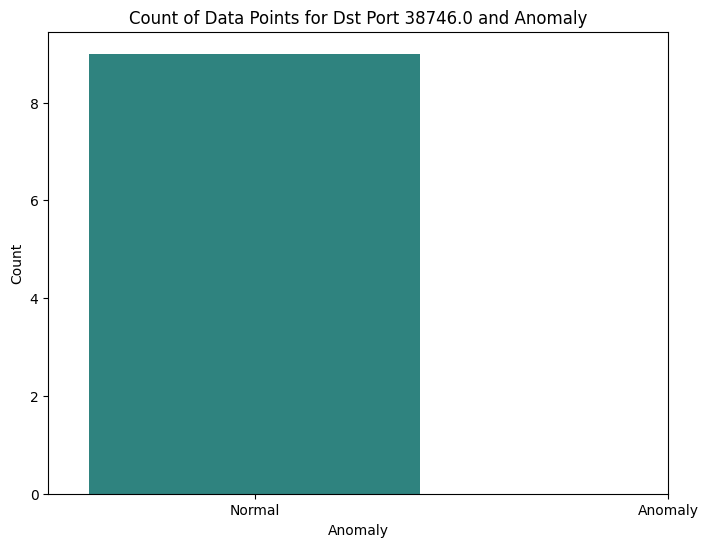

anomaly count:    anomaly  count
0        0     13
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


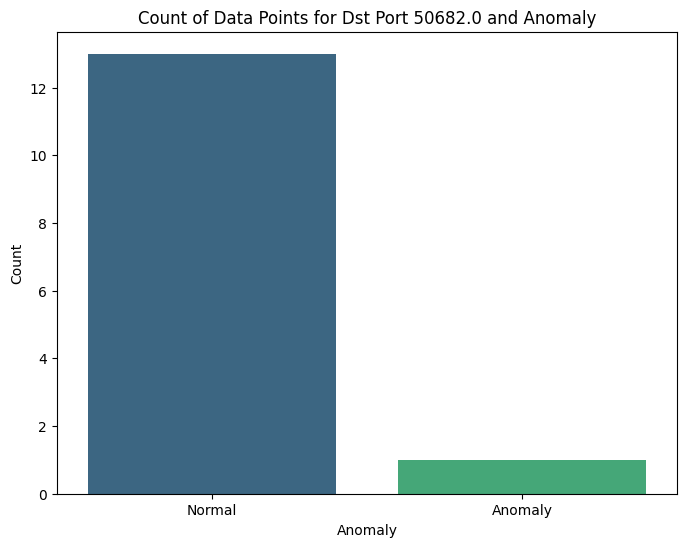

anomaly count:    anomaly  count
0        0      8


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


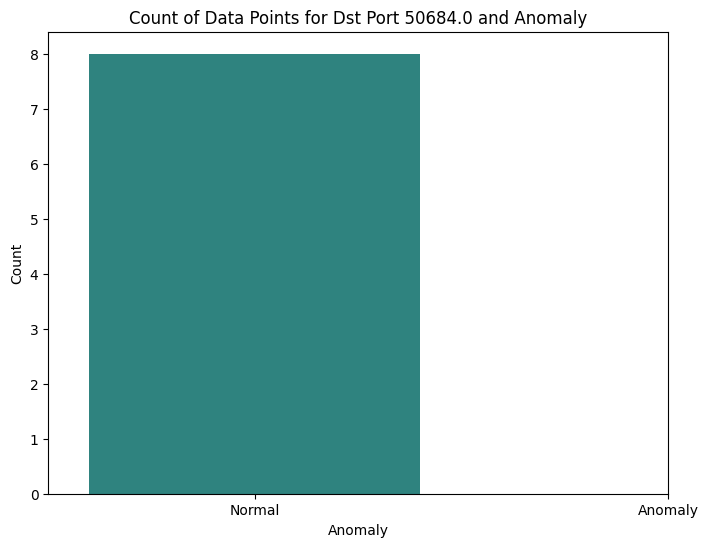

anomaly count:    anomaly  count
0        0     14
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


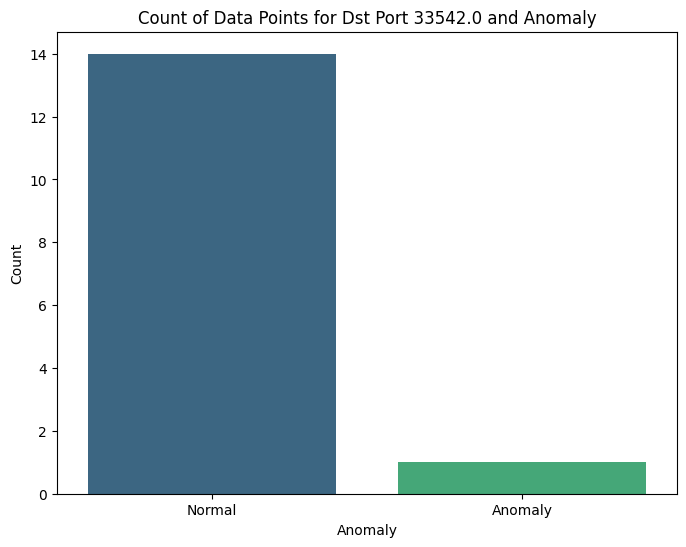

anomaly count:    anomaly  count
0        0      8


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


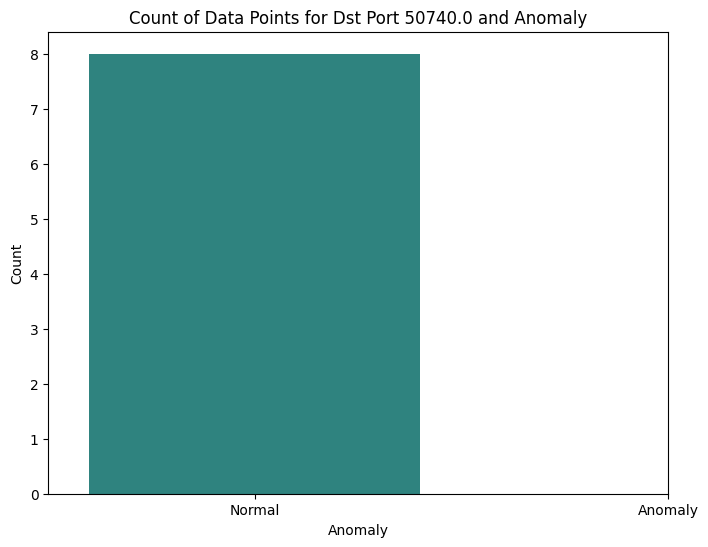

anomaly count:    anomaly  count
0        0     14
1        1      2


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


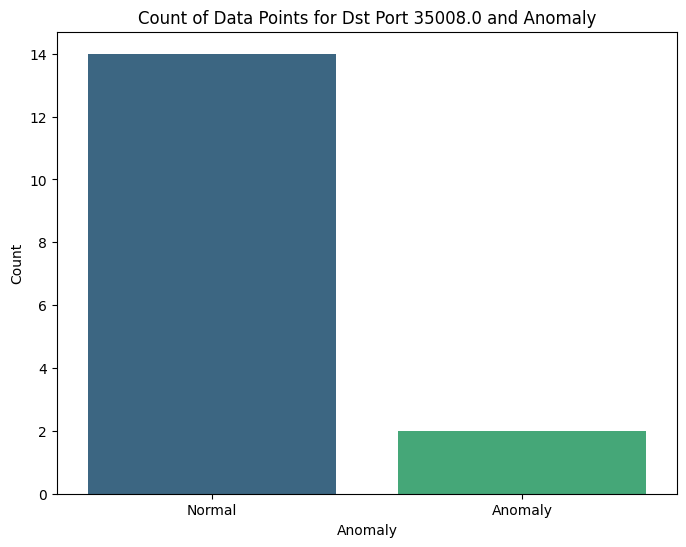

anomaly count:    anomaly  count
0        0      8
1        1      2


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


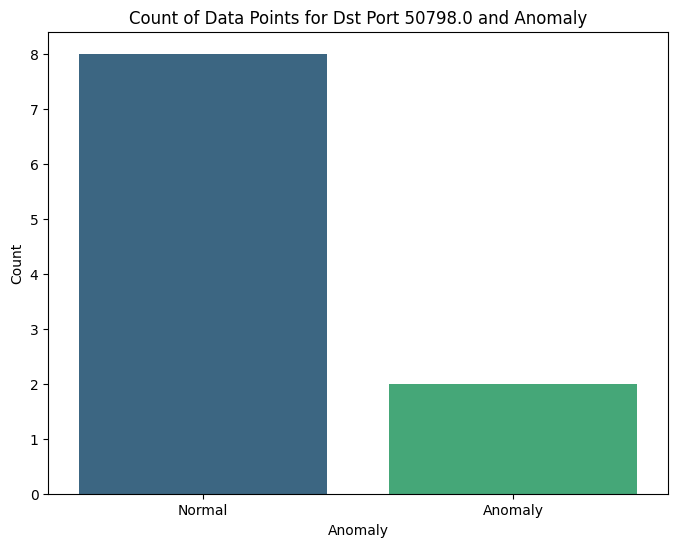

anomaly count:    anomaly  count
0        0     10
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


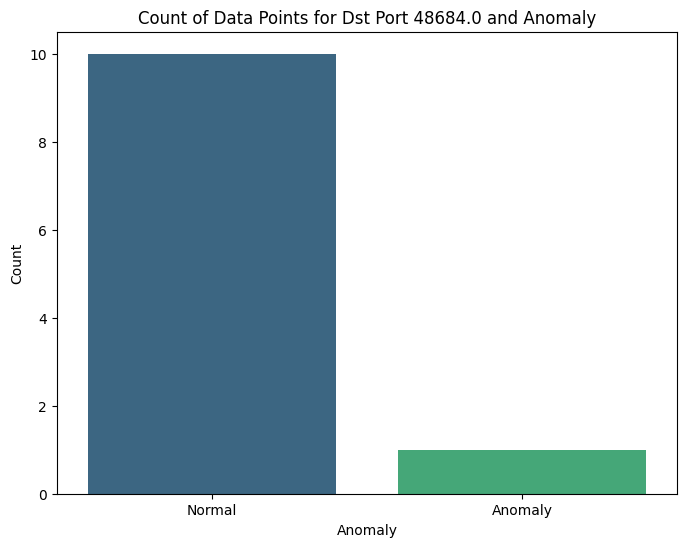

anomaly count:    anomaly  count
0        0     17
1        1      3


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


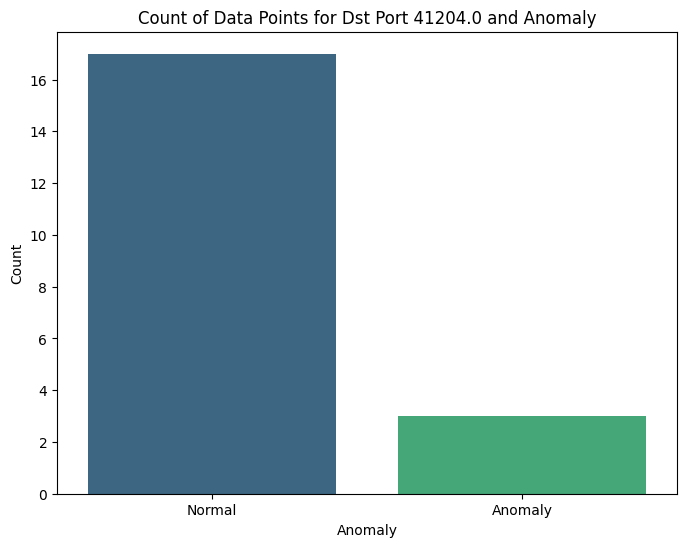

anomaly count:    anomaly  count
0        0     12
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


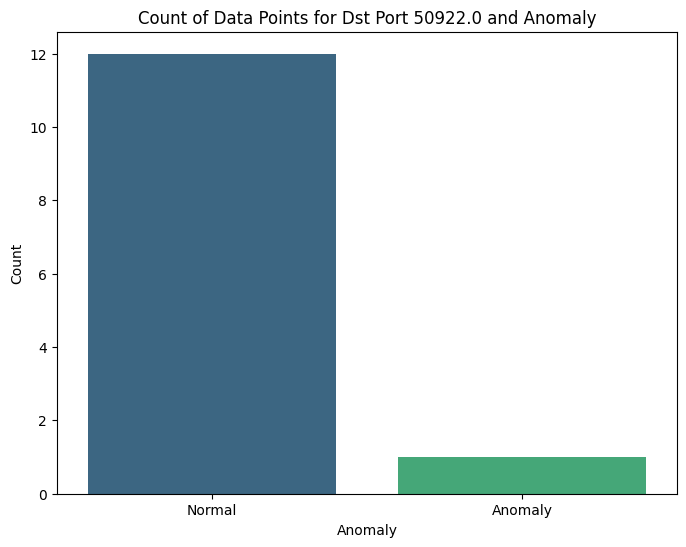

anomaly count:    anomaly  count
0        0     11


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


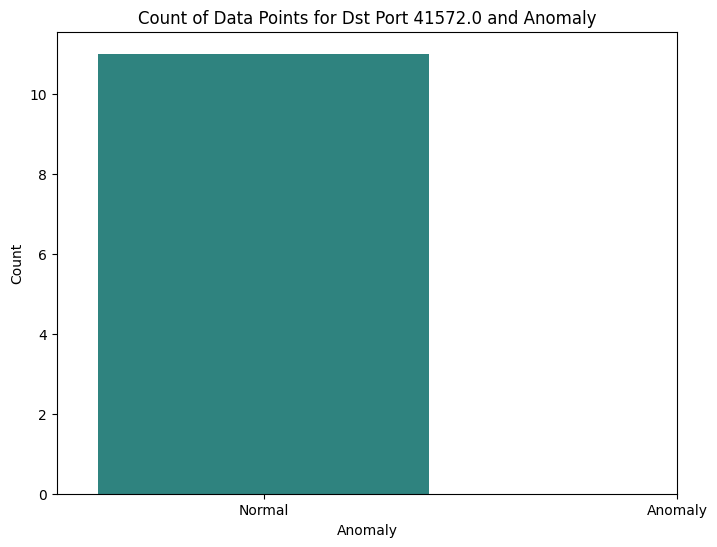

anomaly count:    anomaly  count
0        0     10


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


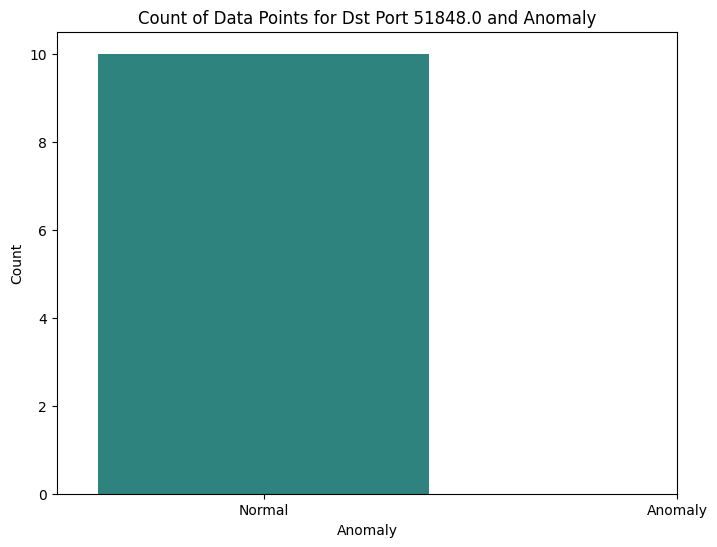

anomaly count:    anomaly  count
0        0      8
1        1      2


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


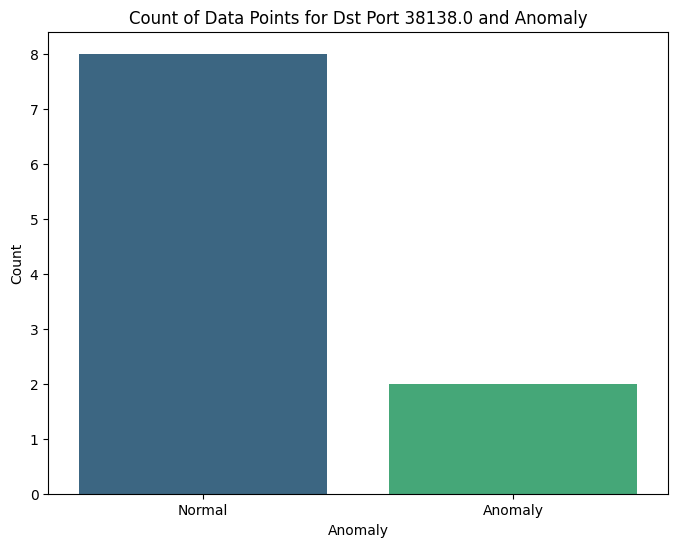

anomaly count:    anomaly  count
0        0      7


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


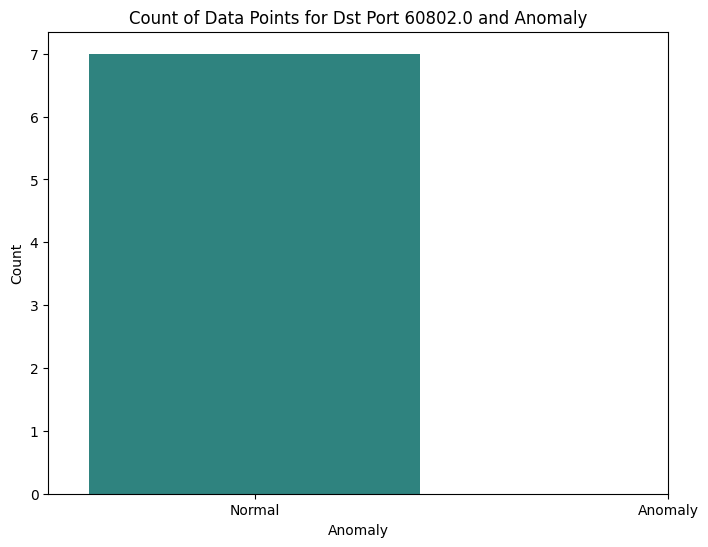

anomaly count:    anomaly  count
0        0     10


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


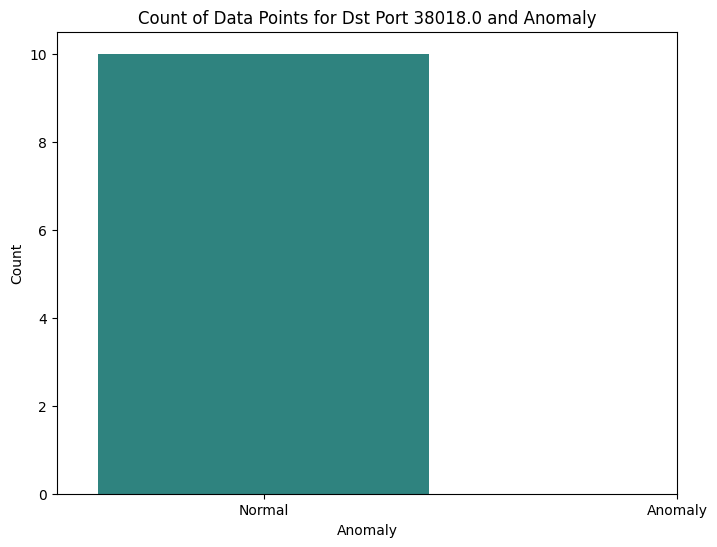

anomaly count:    anomaly  count
0        0     20


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


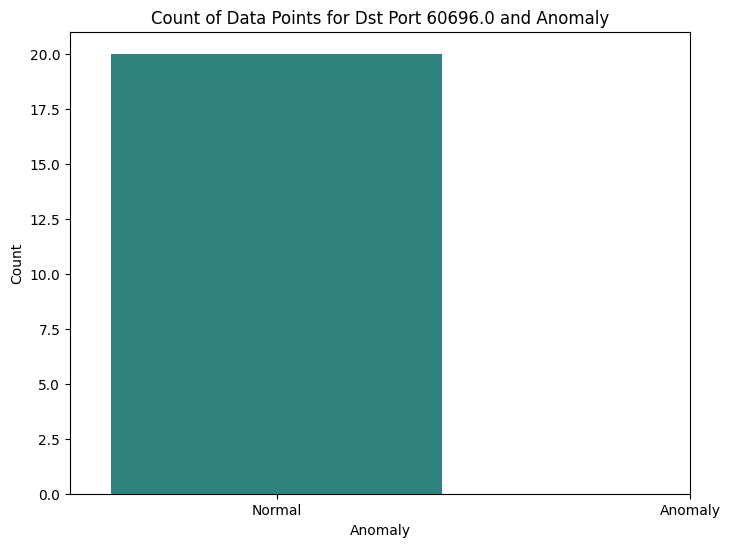

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


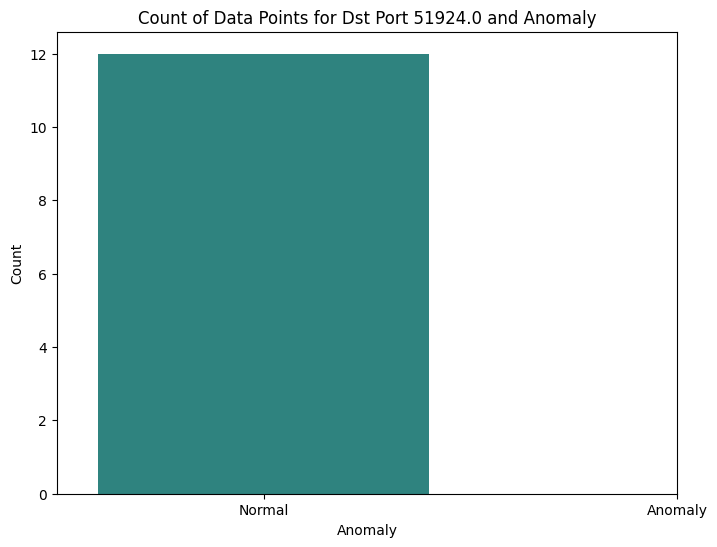

anomaly count:    anomaly  count
0        0     13


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


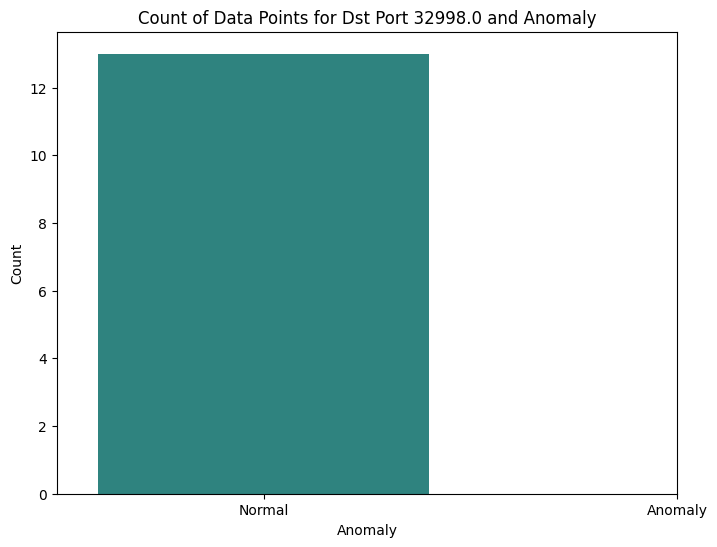

anomaly count:    anomaly  count
0        0     10
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


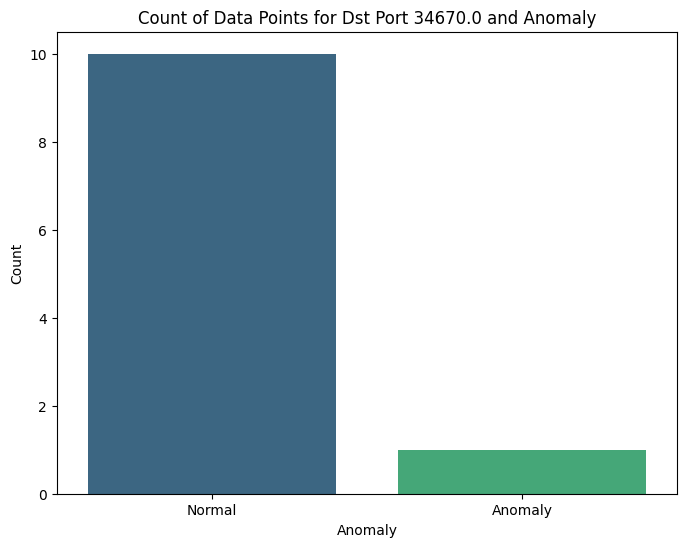

anomaly count:    anomaly  count
0        0     14


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


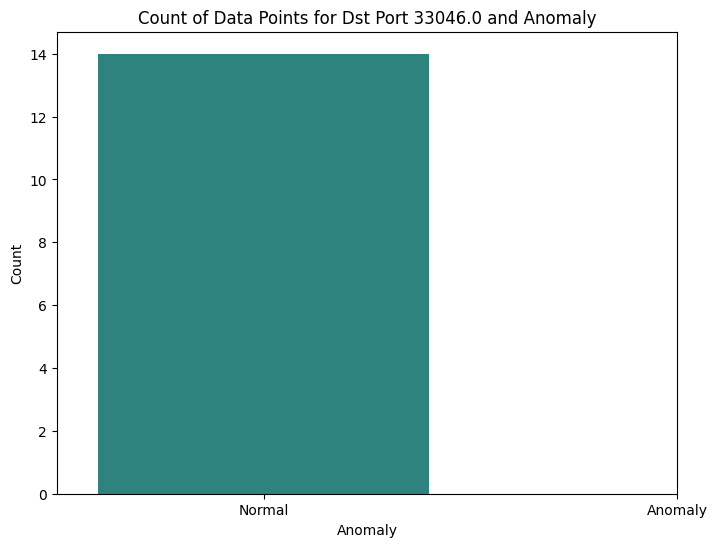

anomaly count:    anomaly  count
0        0     16


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


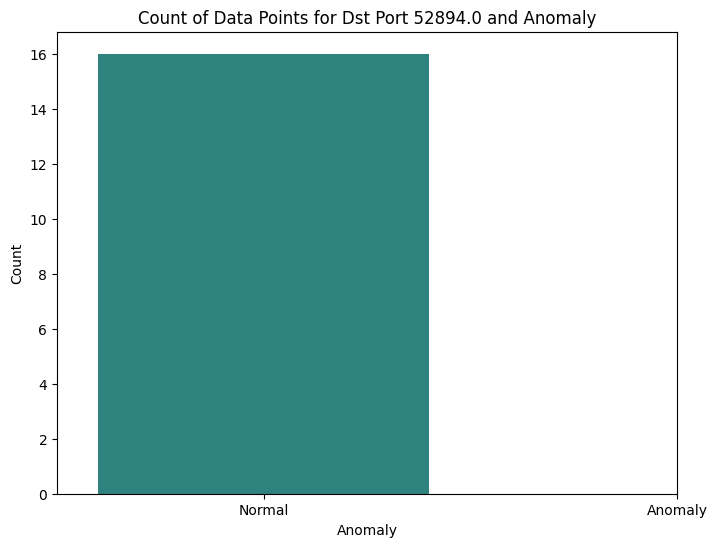

anomaly count:    anomaly  count
0        0     11


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


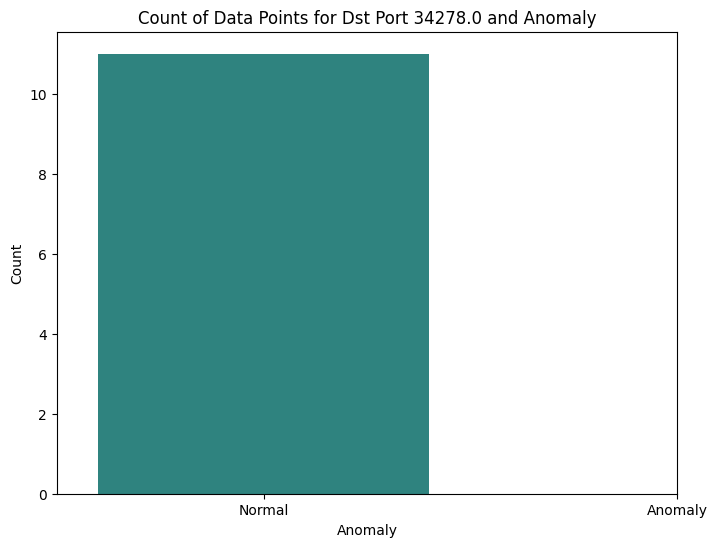

anomaly count:    anomaly  count
0        0     13
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


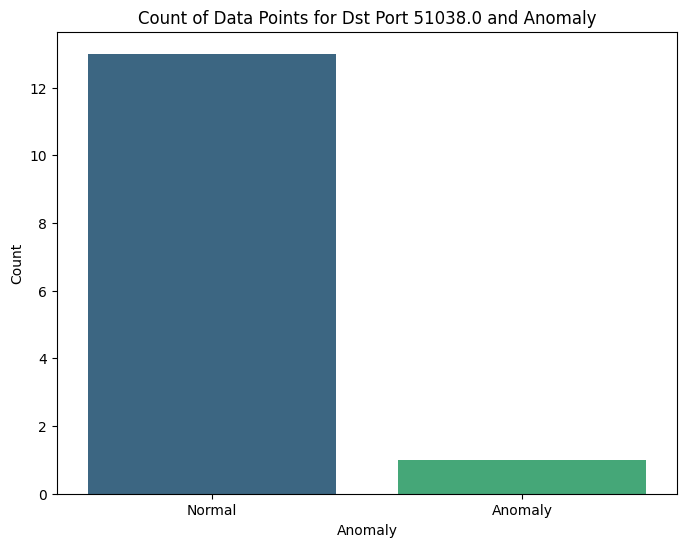

anomaly count:    anomaly  count
0        0      7


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


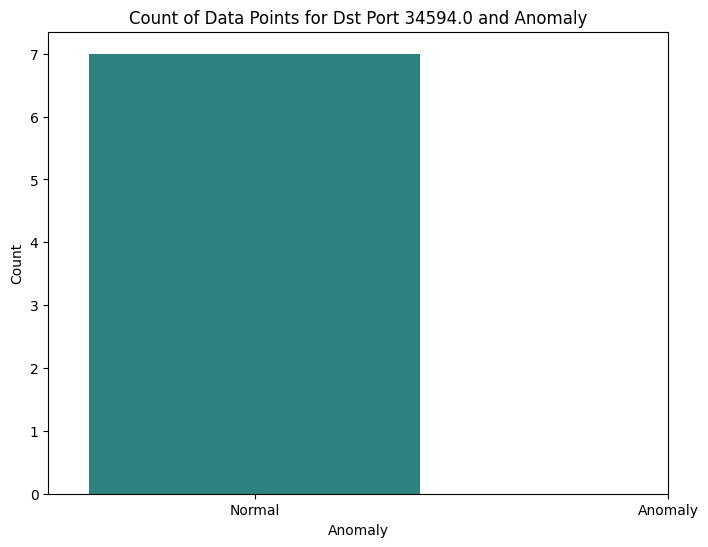

anomaly count:    anomaly  count
0        0      6


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


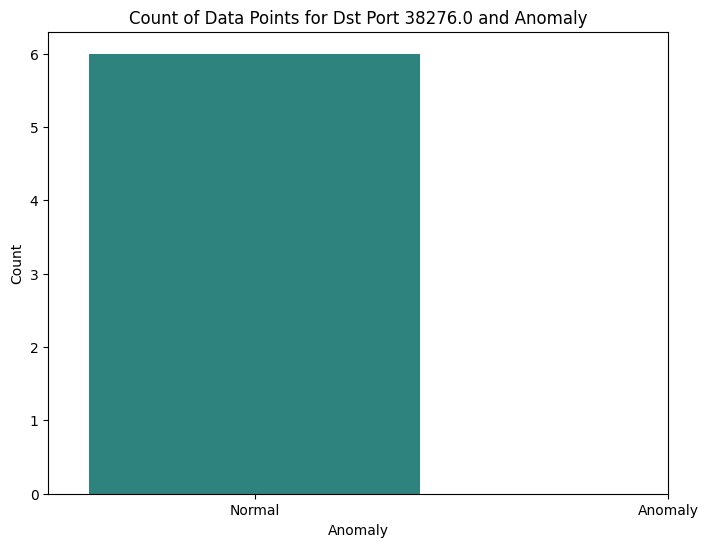

anomaly count:    anomaly  count
0        0     13


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


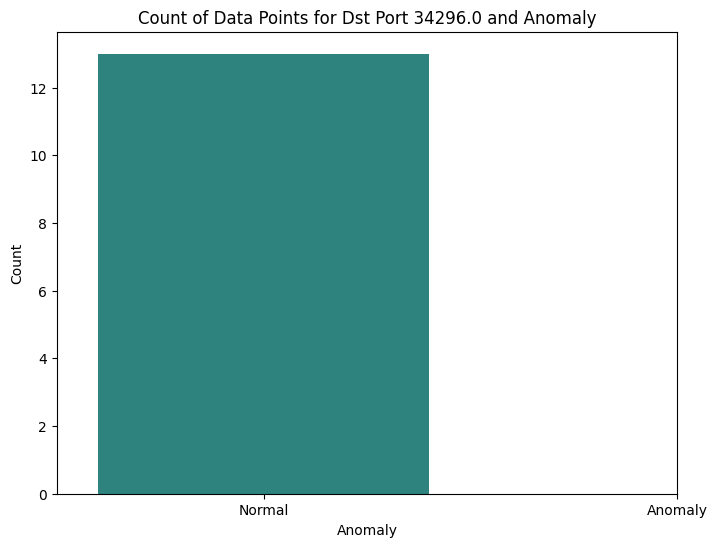

anomaly count:    anomaly  count
0        0      7


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


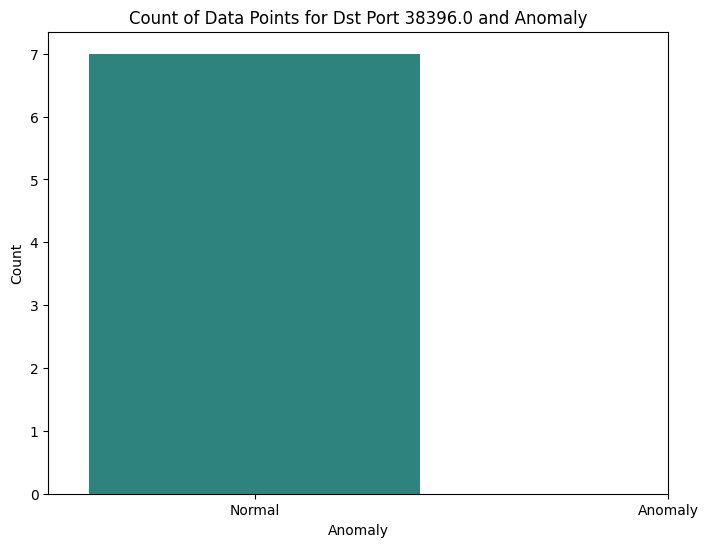

anomaly count:    anomaly  count
0        0      2


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


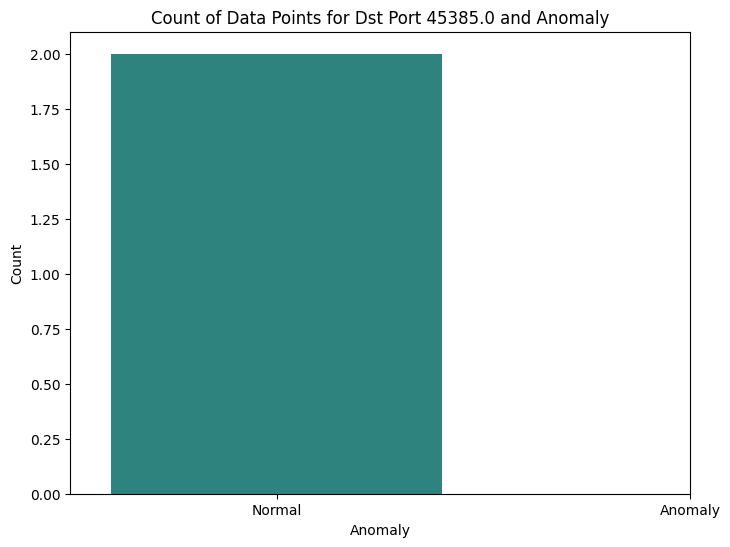

anomaly count:    anomaly  count
0        0      9


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


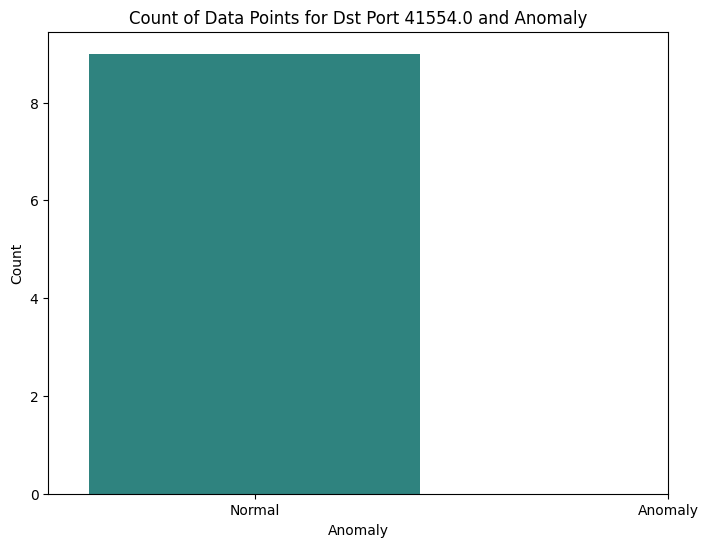

anomaly count:    anomaly  count
0        0      8
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


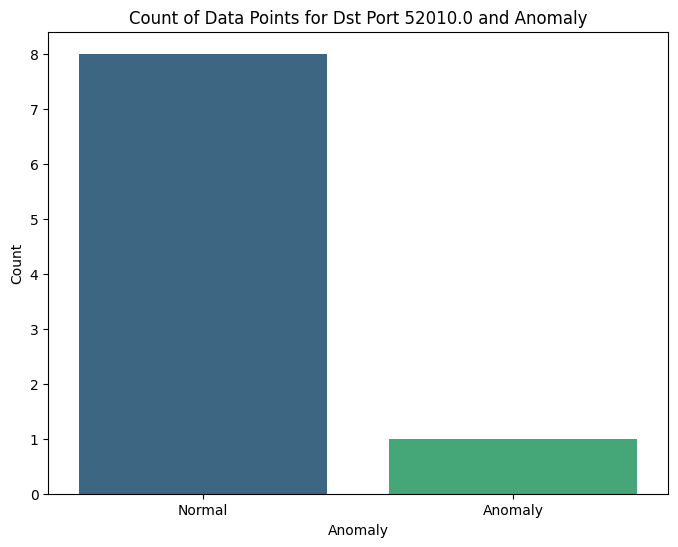

anomaly count:    anomaly  count
0        0     17


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


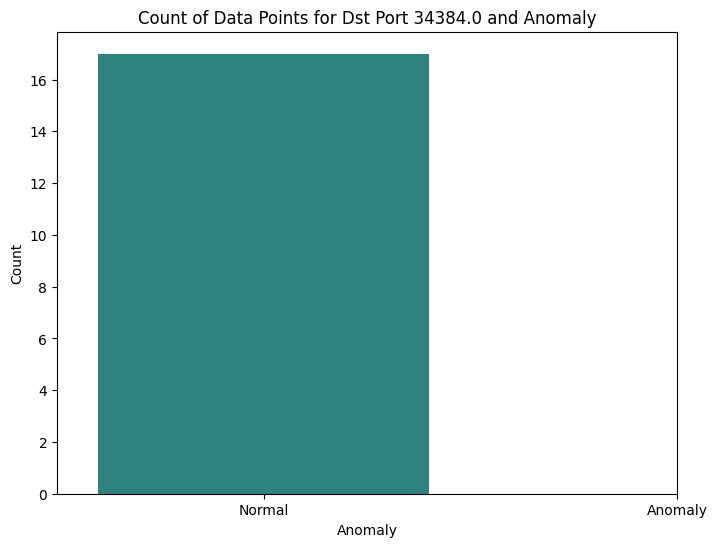

anomaly count:    anomaly  count
0        0     10


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


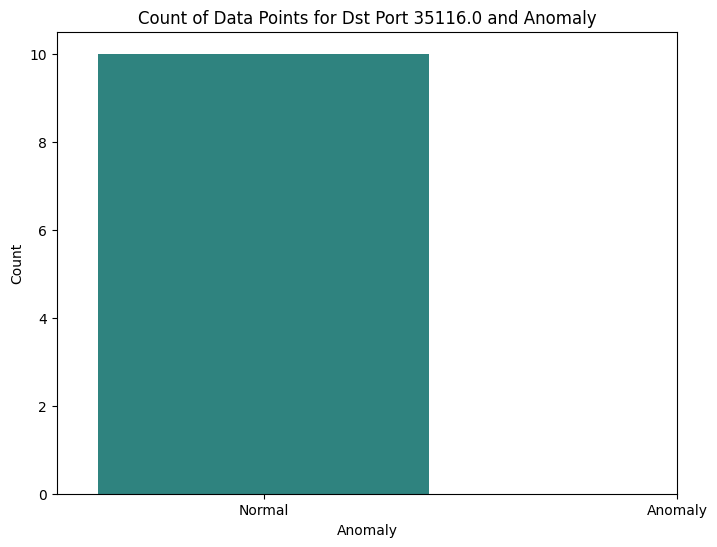

anomaly count:    anomaly  count
0        0      6


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


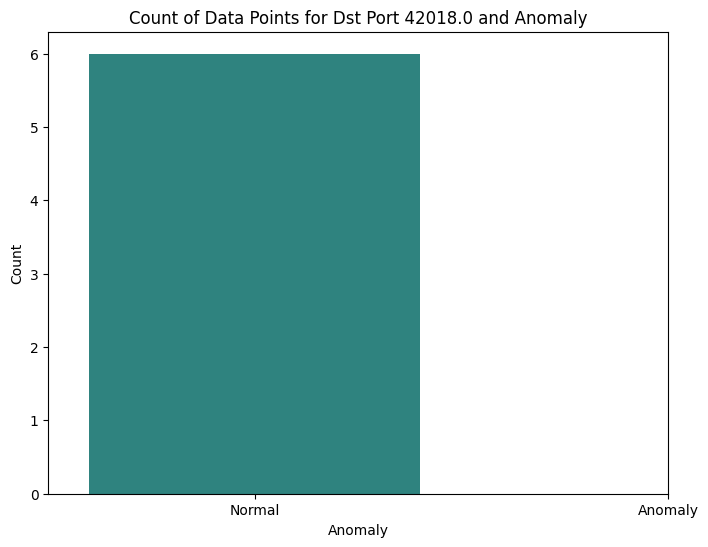

anomaly count:    anomaly  count
0        0      8
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


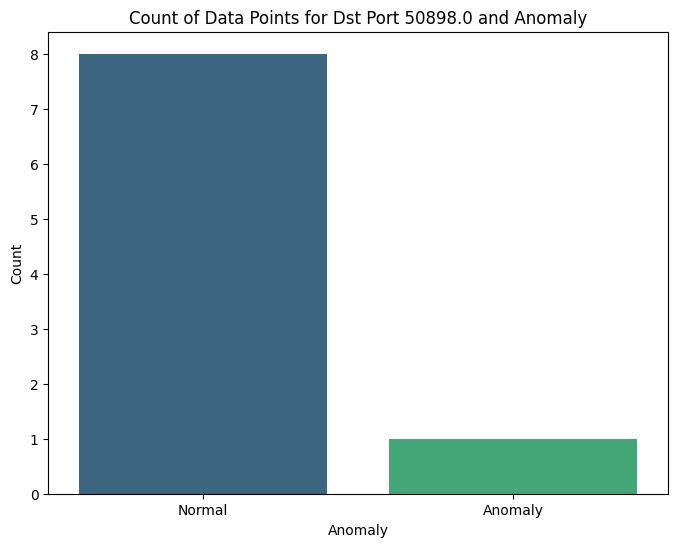

anomaly count:    anomaly  count
0        0     11
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


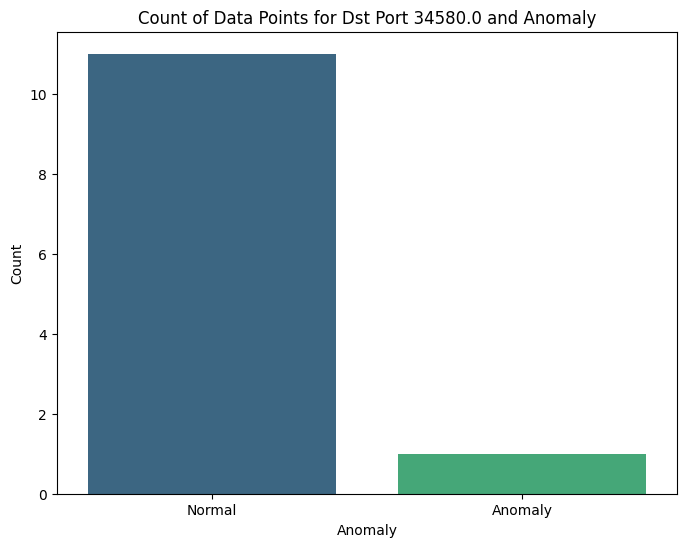

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


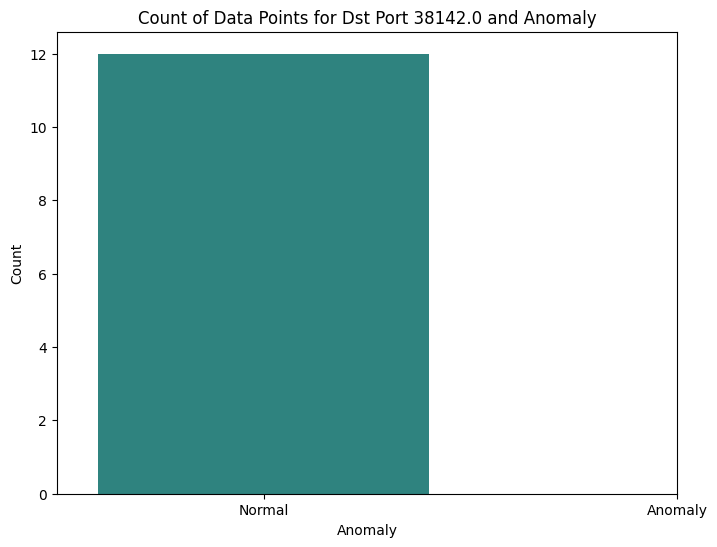

anomaly count:    anomaly  count
0        0     16


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


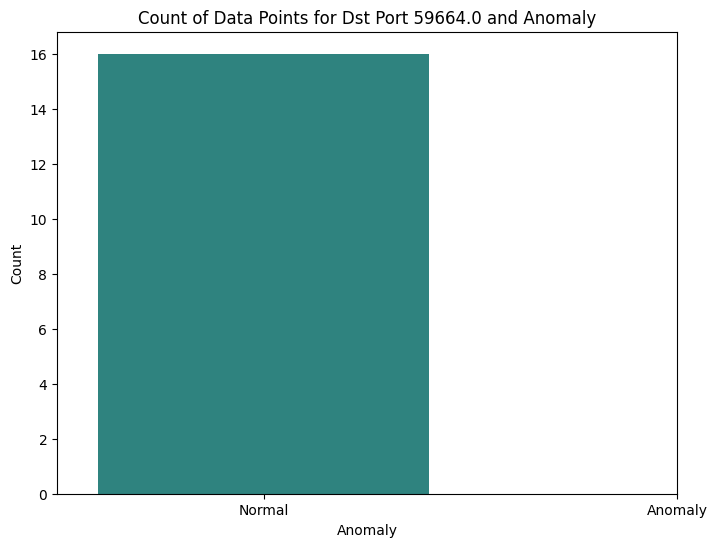

anomaly count:    anomaly  count
0        0     12
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


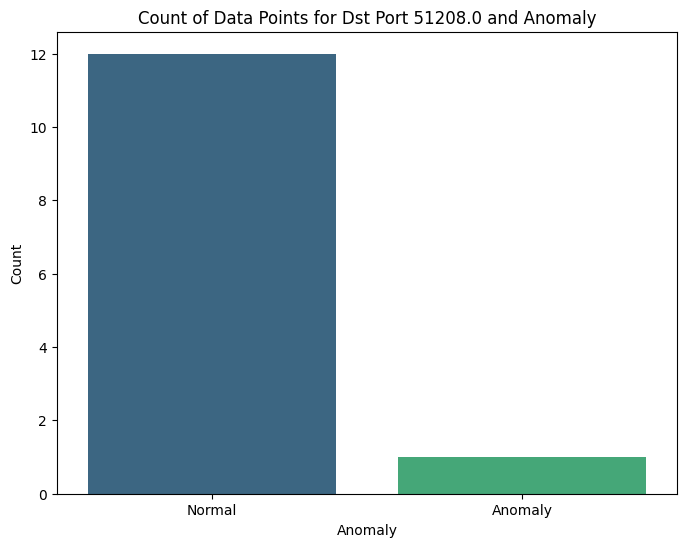

anomaly count:    anomaly  count
0        0     15


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


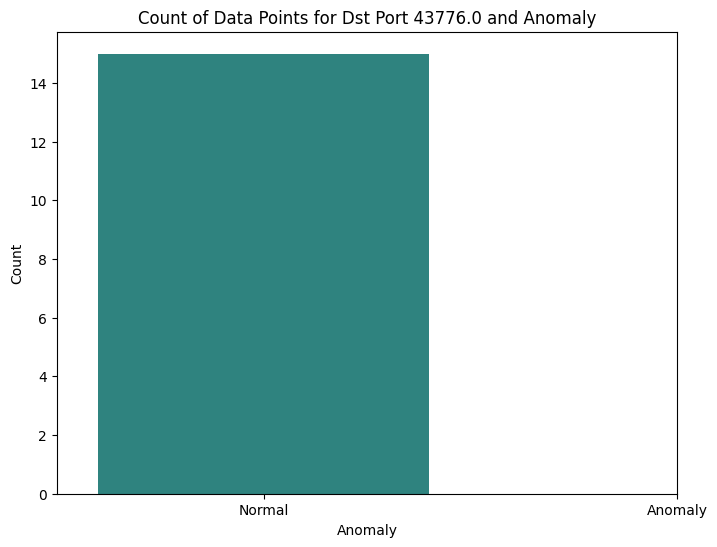

anomaly count:    anomaly  count
0        0      8


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


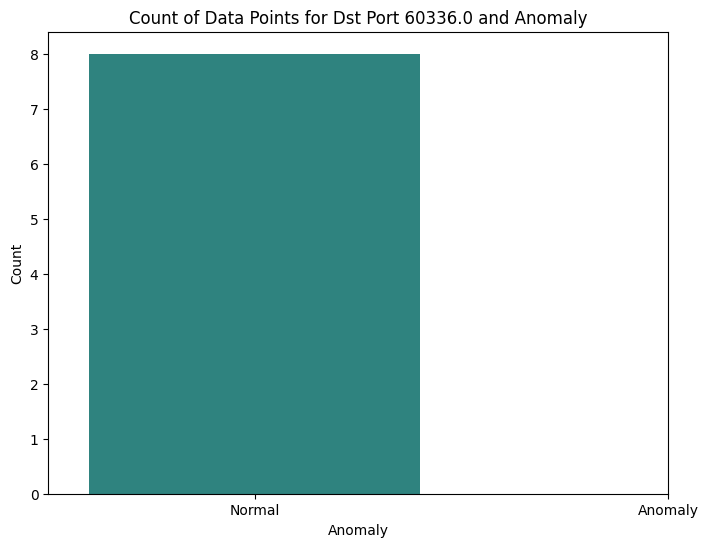

anomaly count:    anomaly  count
0        0     19


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


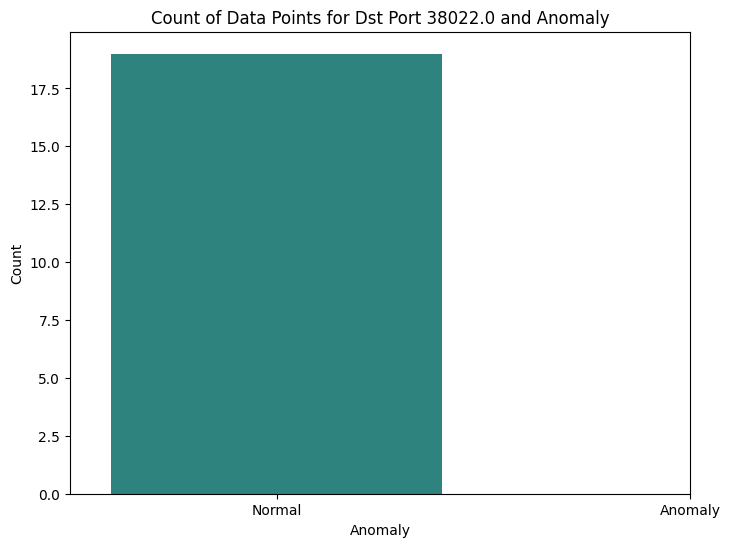

anomaly count:    anomaly  count
0        0      8


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


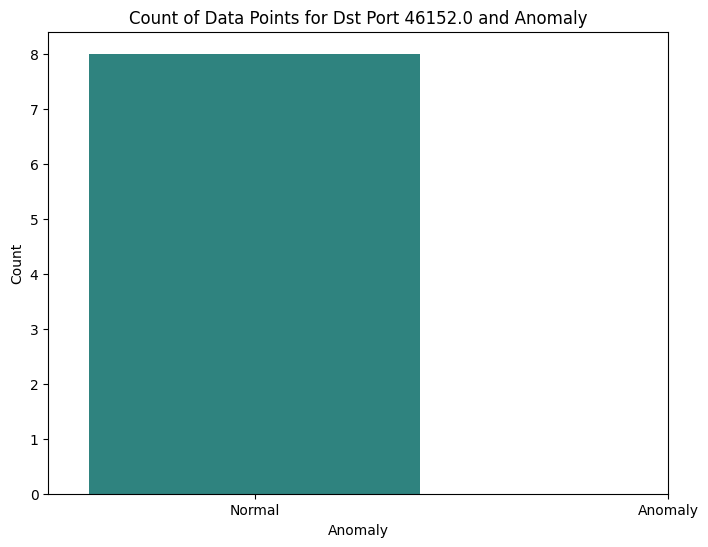

anomaly count:    anomaly  count
0        0     10


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


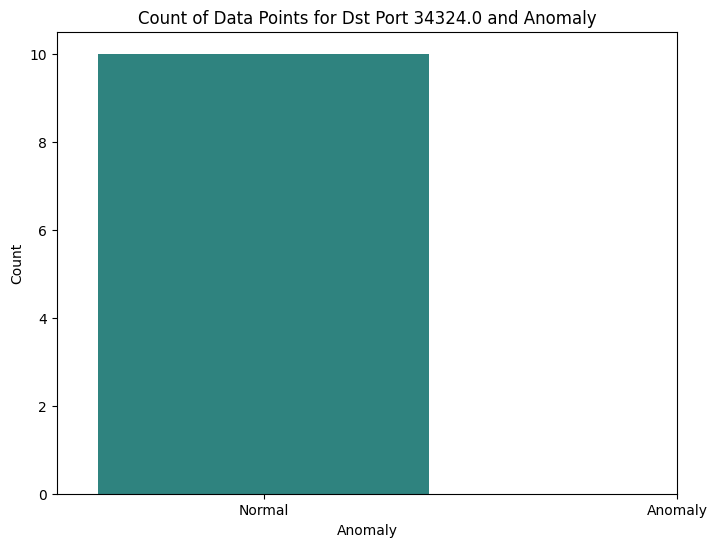

anomaly count:    anomaly  count
0        0     13


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


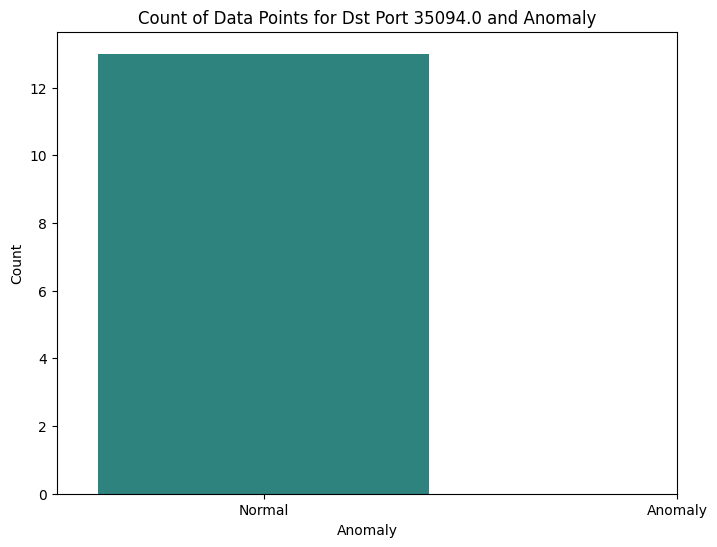

anomaly count:    anomaly  count
0        0     13


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


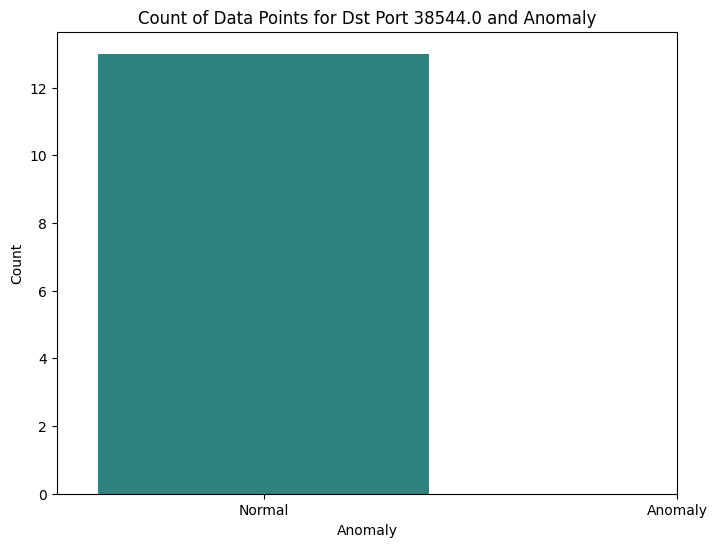

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


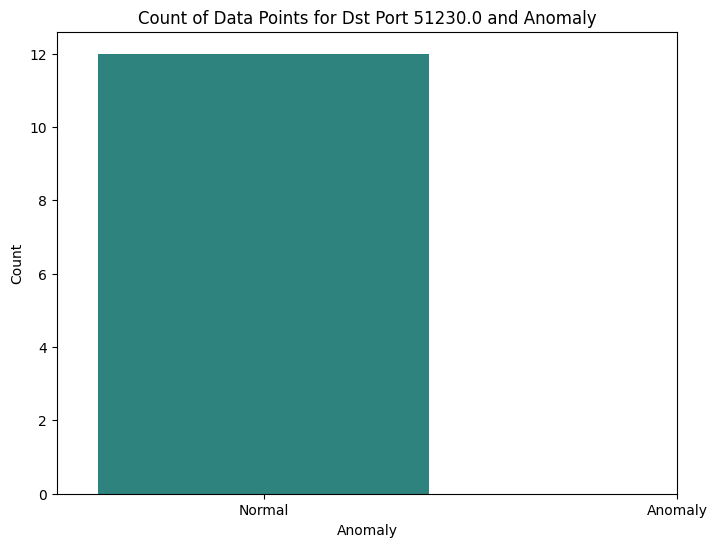

anomaly count:    anomaly  count
0        0     13


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


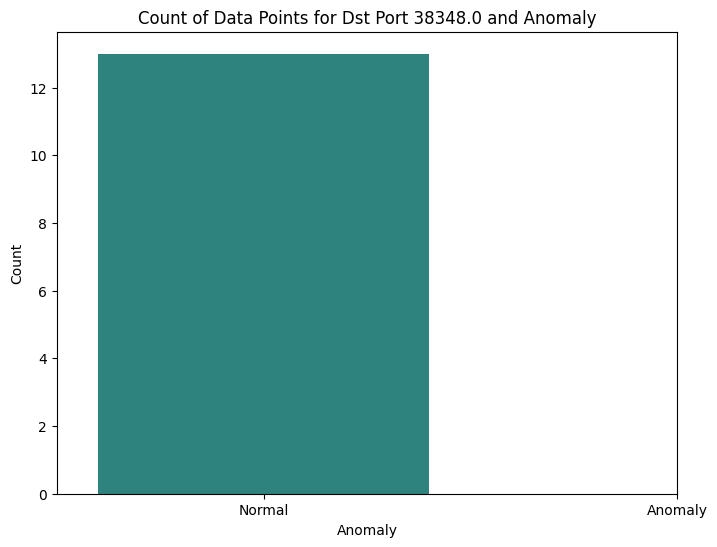

anomaly count:    anomaly  count
0        0      5


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


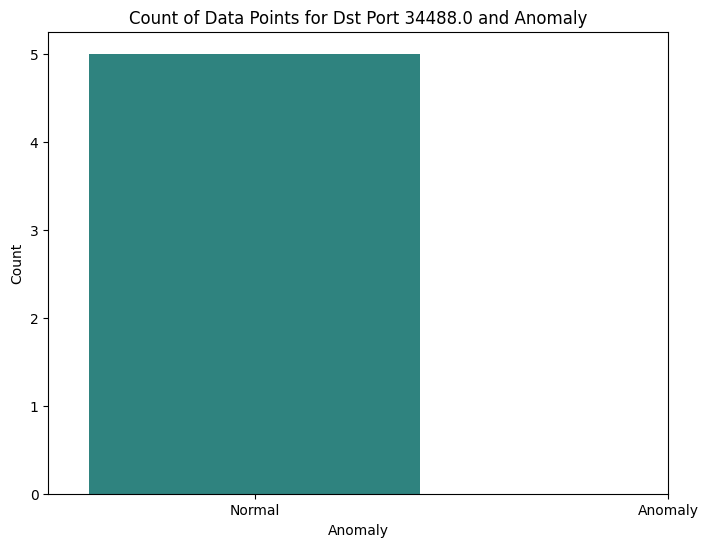

anomaly count:    anomaly  count
0        0     16
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


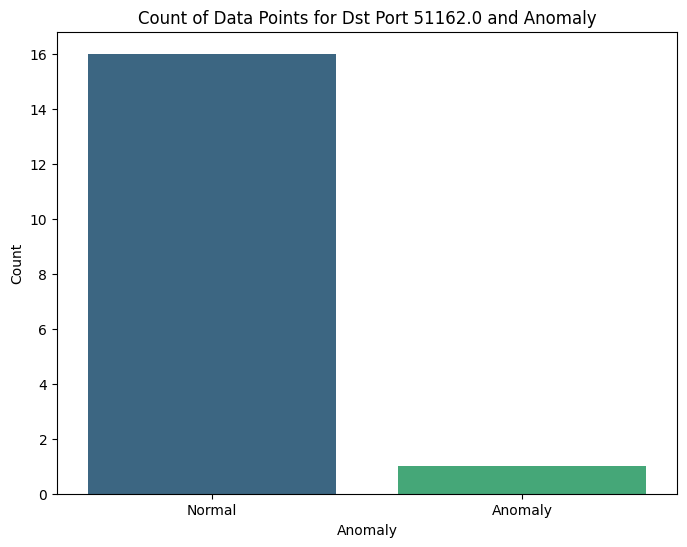

anomaly count:    anomaly  count
0        0      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


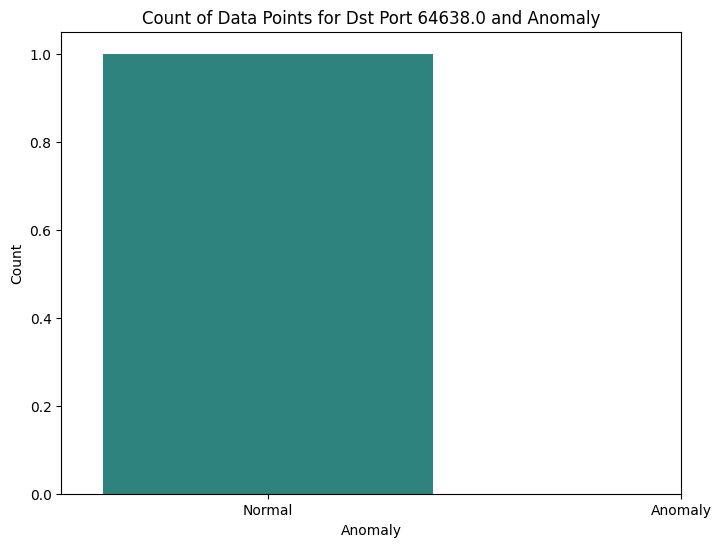

anomaly count:    anomaly  count
0        0      5


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


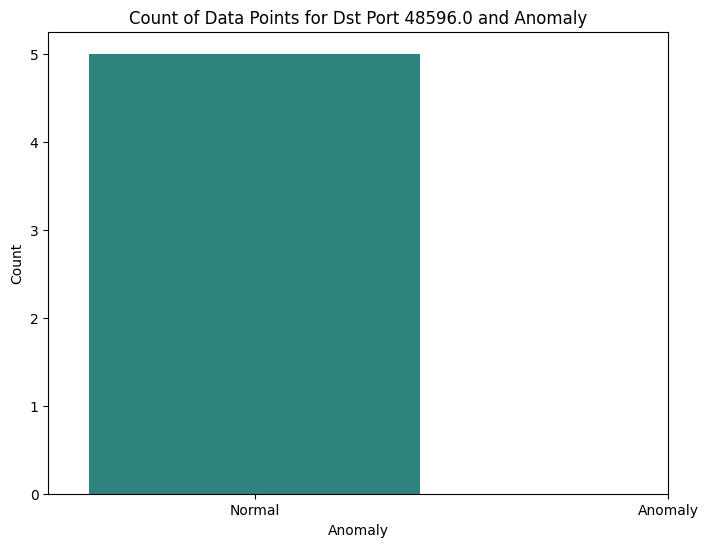

anomaly count:    anomaly  count
0        0      7


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


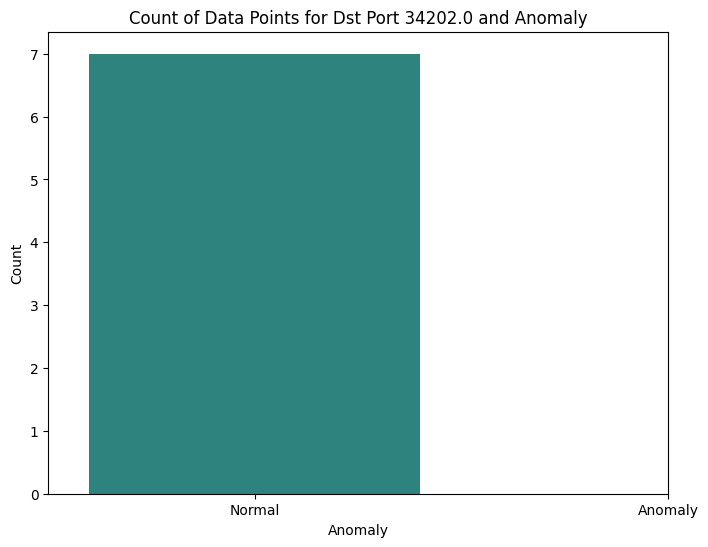

anomaly count:    anomaly  count
0        0      6


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


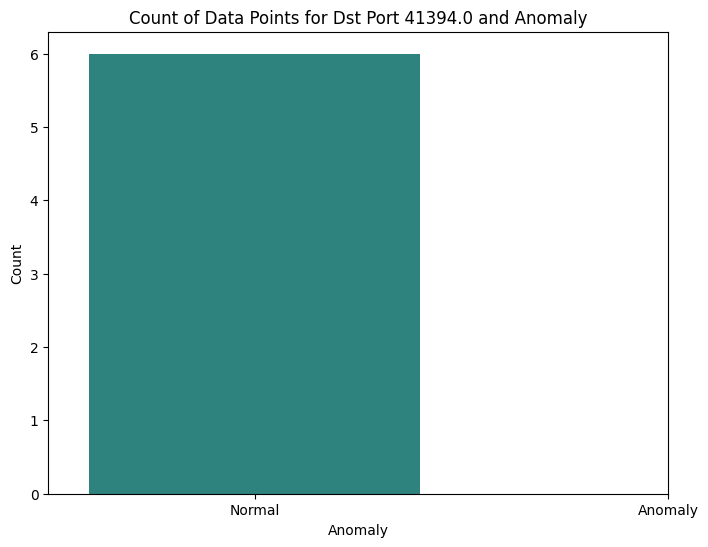

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


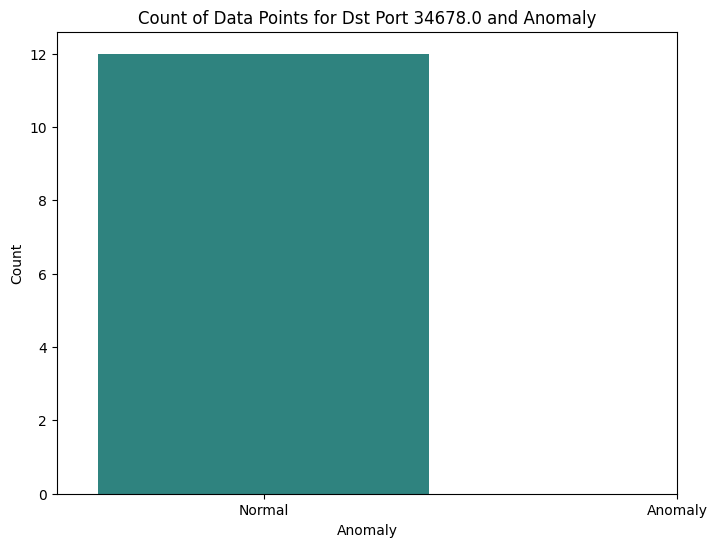

anomaly count:    anomaly  count
0        0      4
1        1      2


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


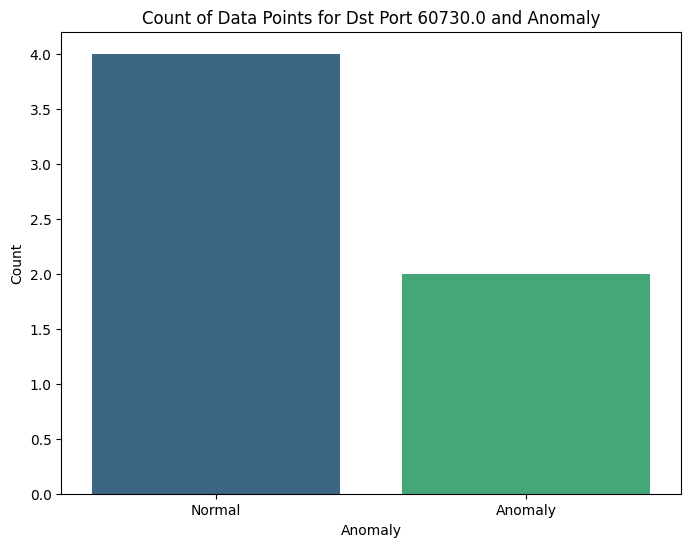

anomaly count:    anomaly  count
0        0      8
1        1      2


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


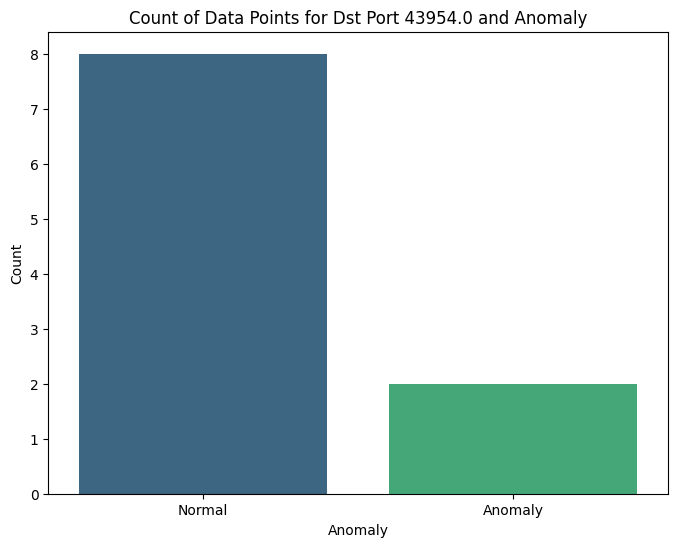

anomaly count:    anomaly  count
0        0     10
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


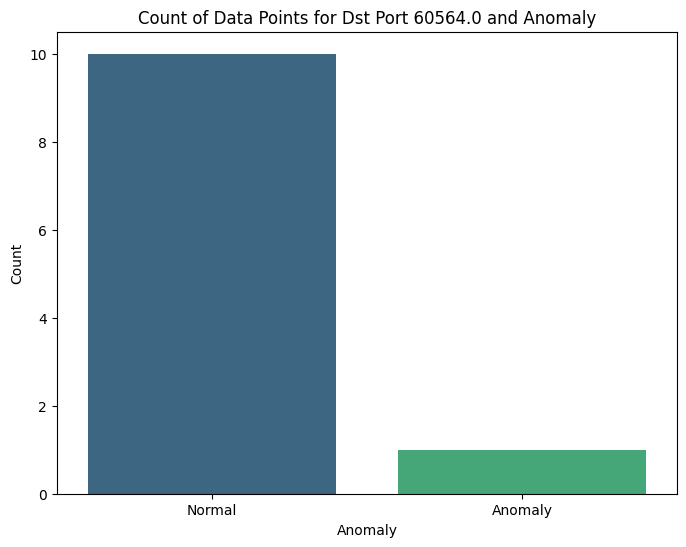

anomaly count:    anomaly  count
0        0     10


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


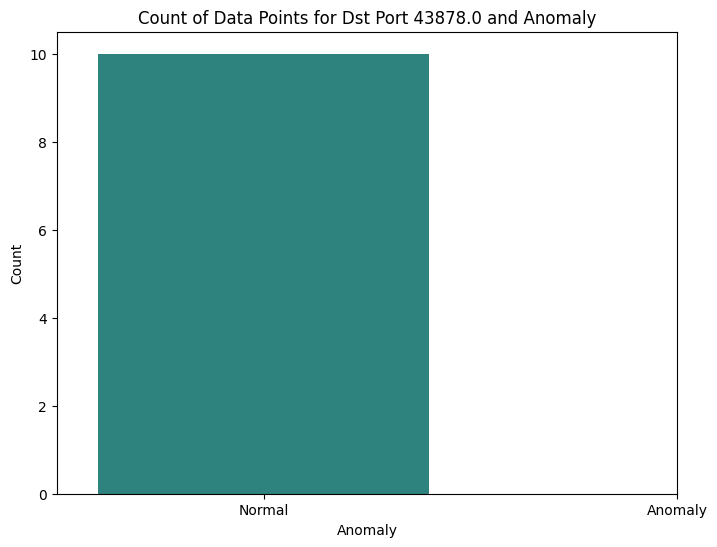

anomaly count:    anomaly  count
0        0      6


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


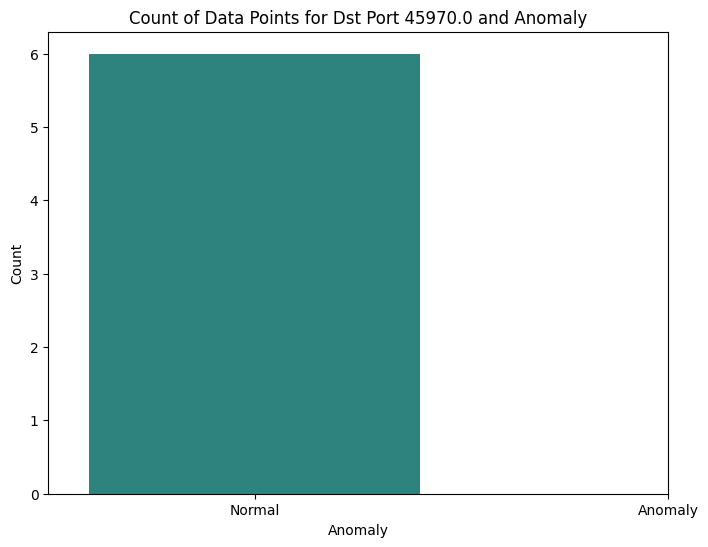

anomaly count:    anomaly  count
0        0     12
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


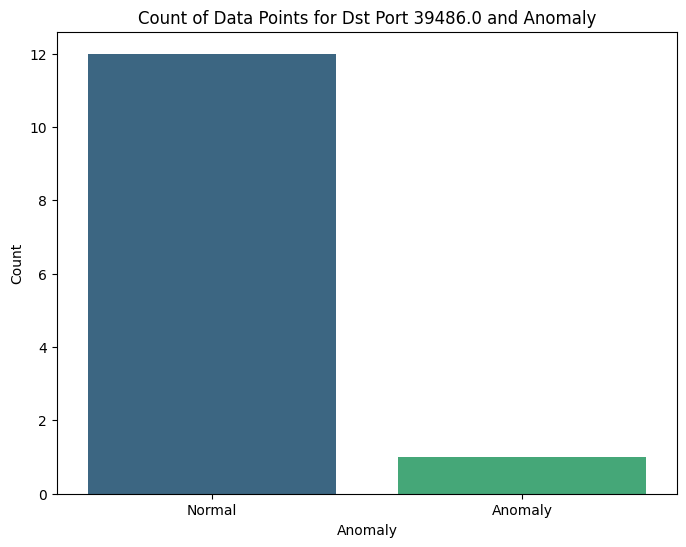

anomaly count:    anomaly  count
0        0     20
1        1      3


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


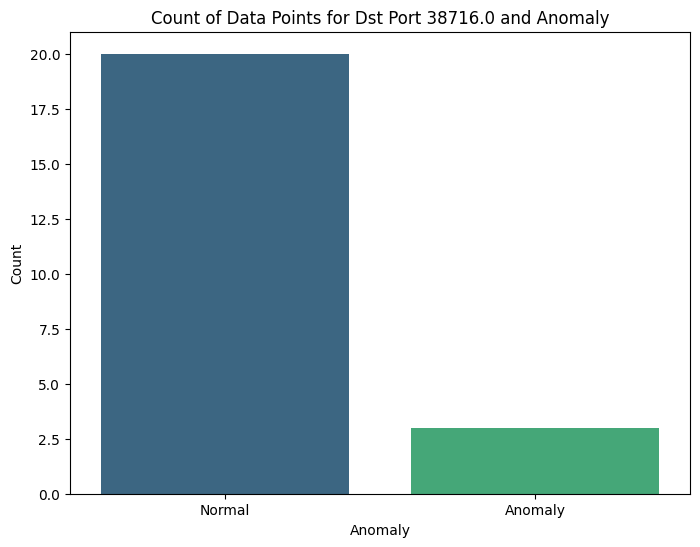

anomaly count:    anomaly  count
0        0     11


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


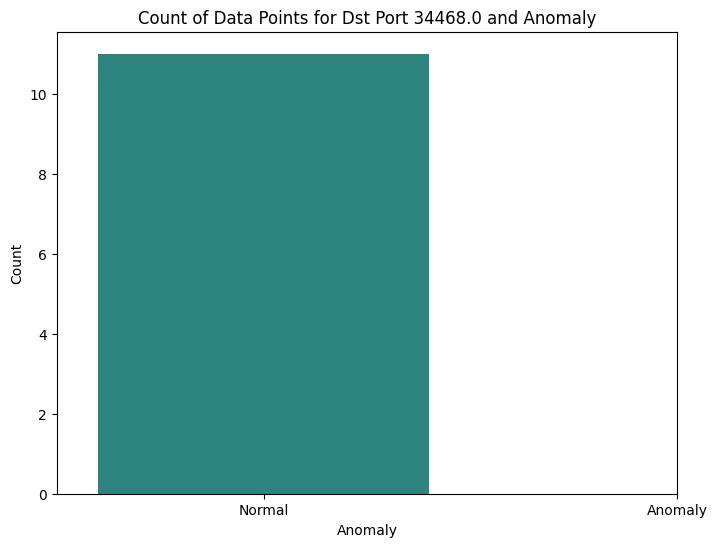

anomaly count:    anomaly  count
0        0     16


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


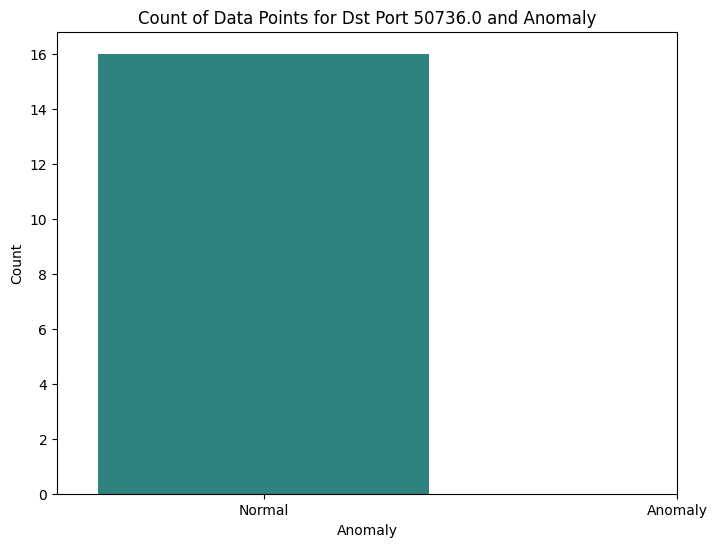

anomaly count:    anomaly  count
0        0      5


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


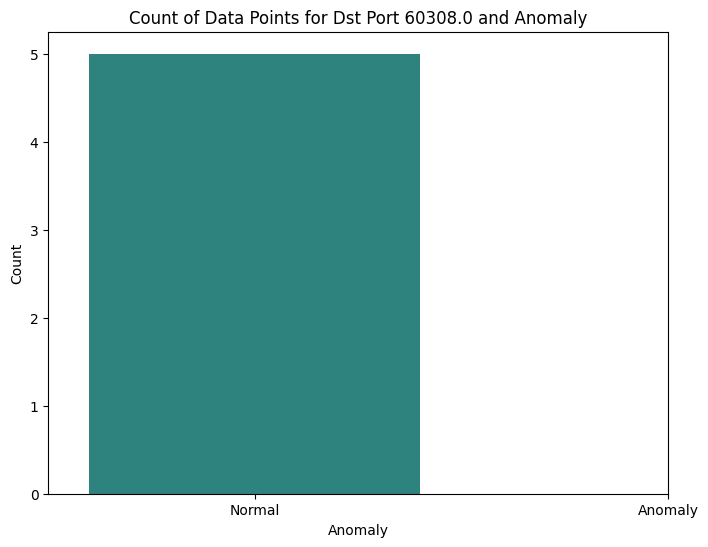

anomaly count:    anomaly  count
0        0     15
1        1      2


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


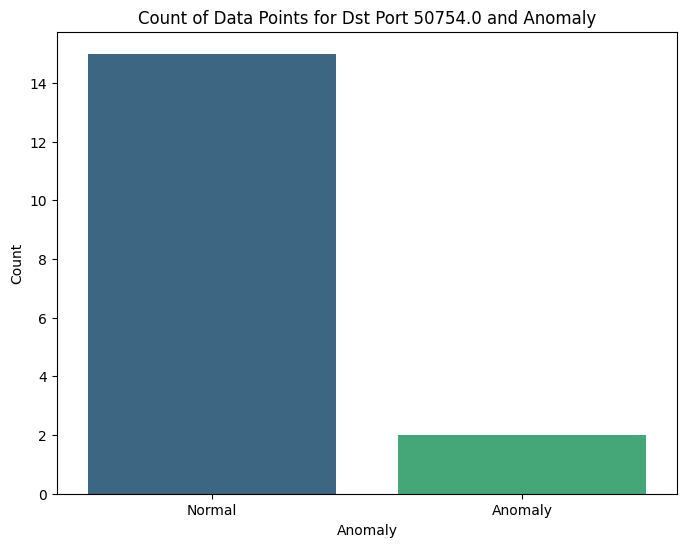

anomaly count:    anomaly  count
0        0     11


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


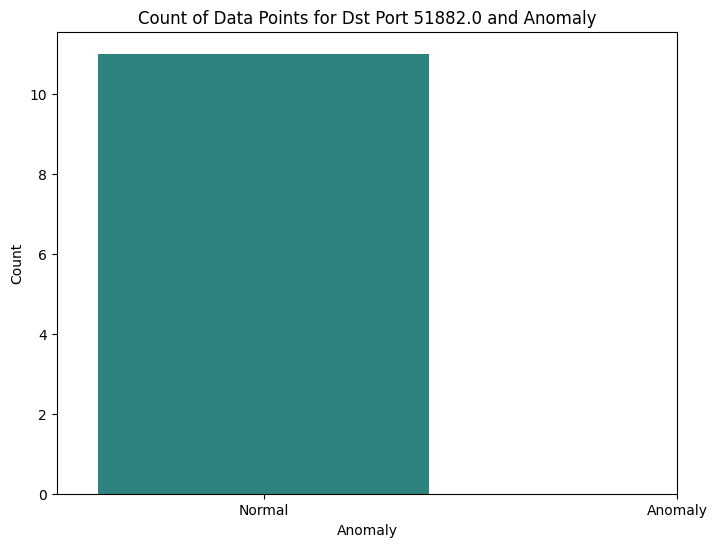

anomaly count:    anomaly  count
0        0     15


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


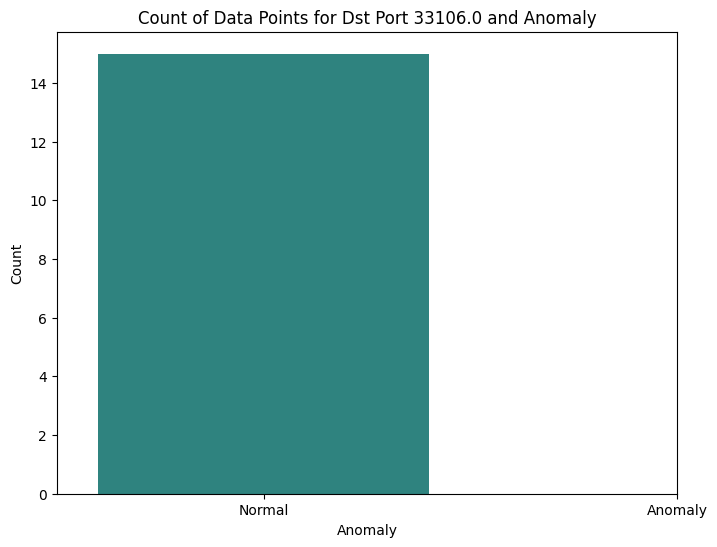

anomaly count:    anomaly  count
0        0     13


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


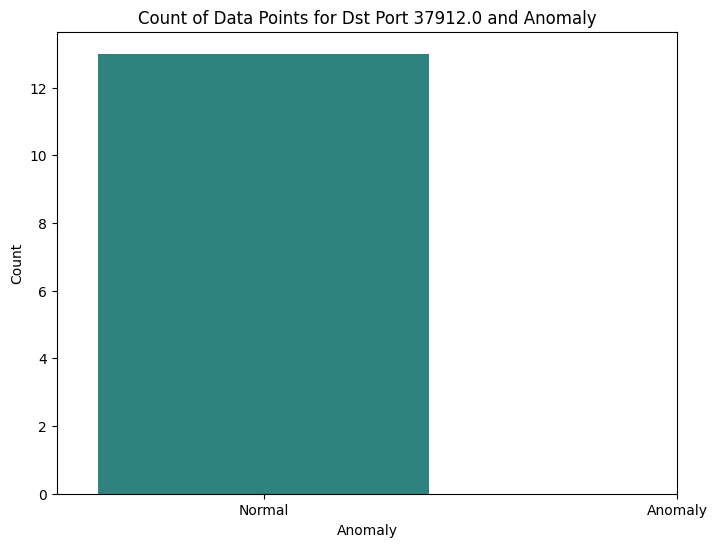

anomaly count:    anomaly  count
0        0      5


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


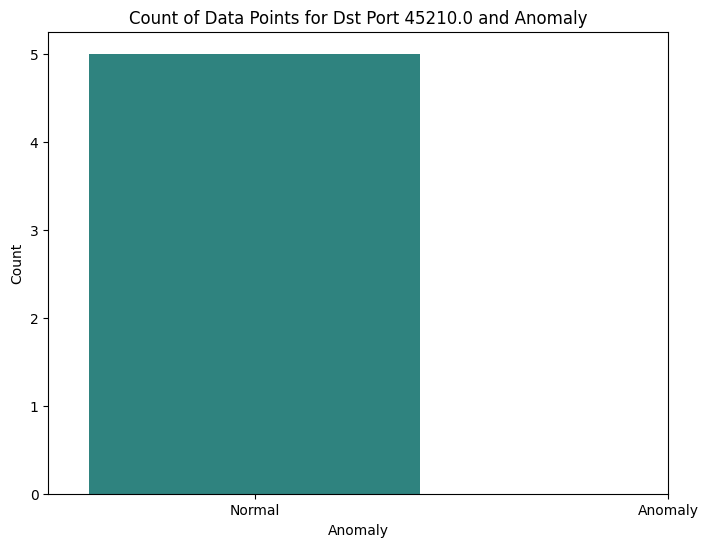

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


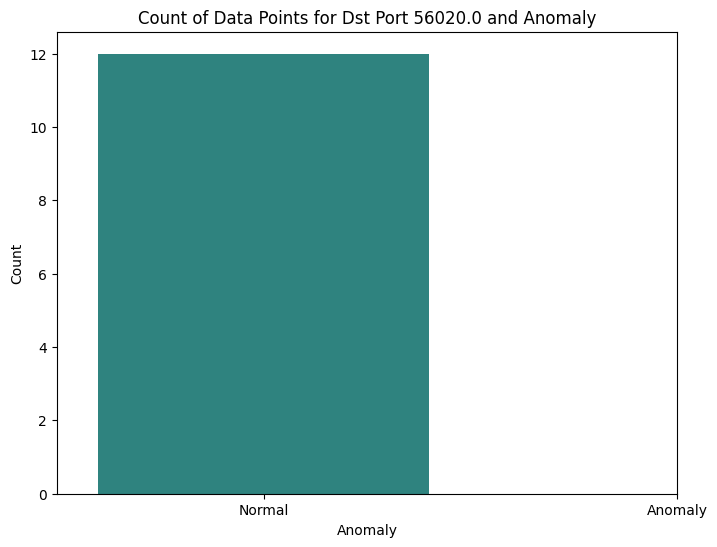

anomaly count:    anomaly  count
0        0     13


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


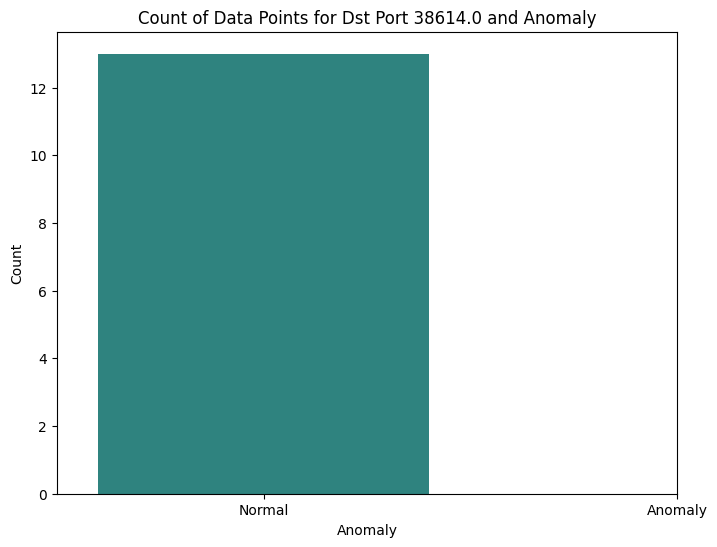

anomaly count:    anomaly  count
0        0     11


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


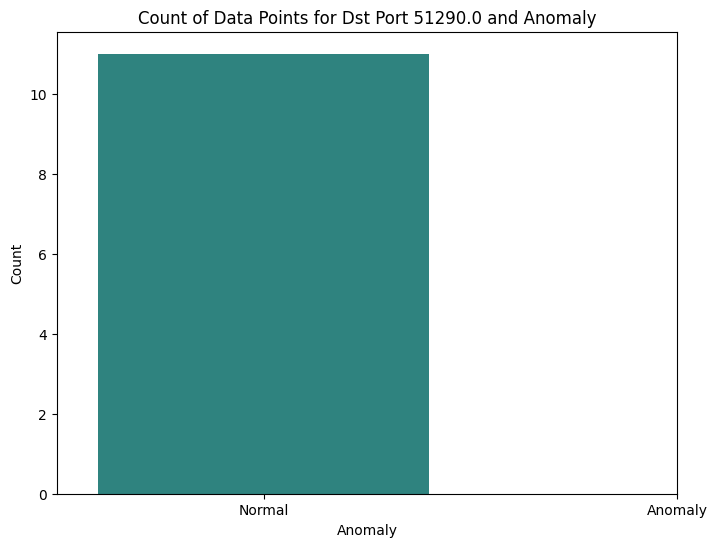

anomaly count:    anomaly  count
0        0      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


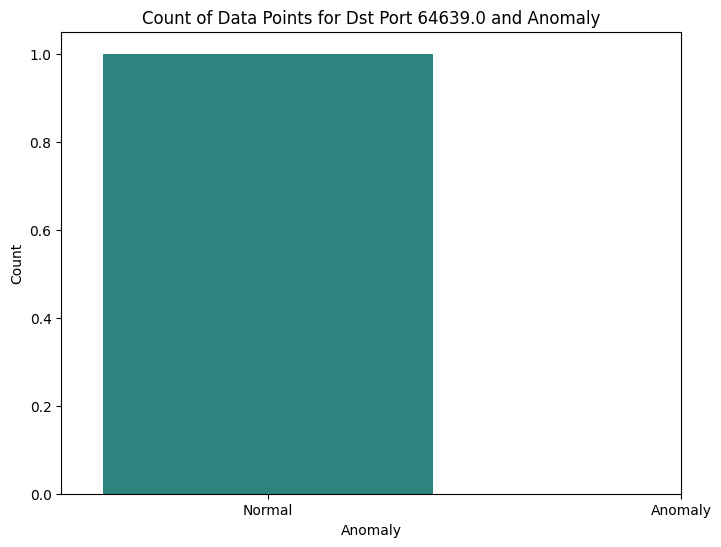

anomaly count:    anomaly  count
0        0      9
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


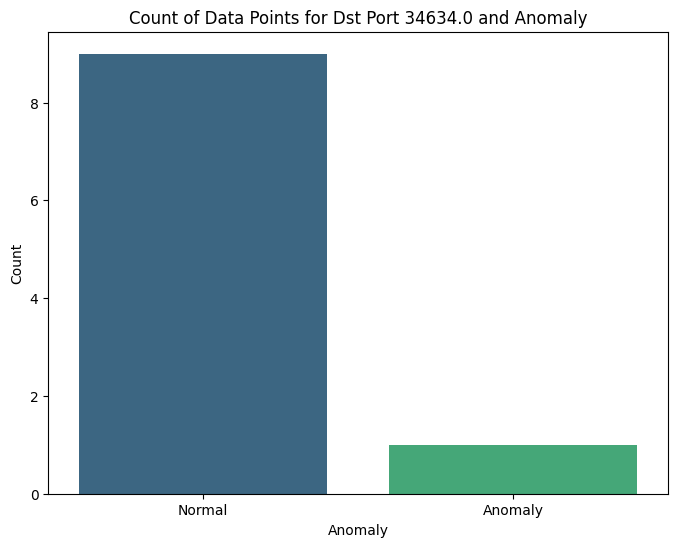

anomaly count:    anomaly  count
0        0     15


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


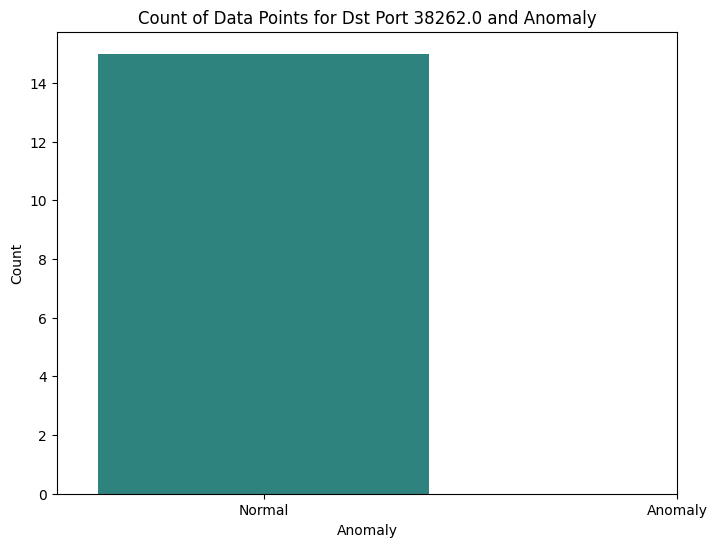

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


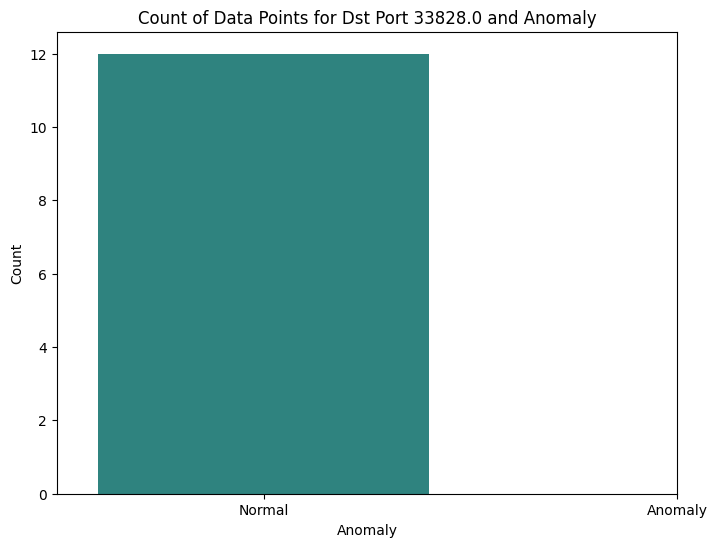

anomaly count:    anomaly  count
0        0      9


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


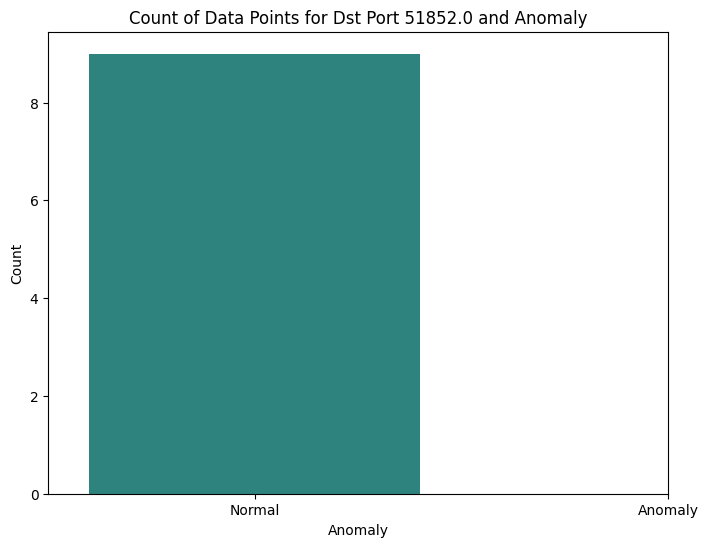

anomaly count:    anomaly  count
0        0      4
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


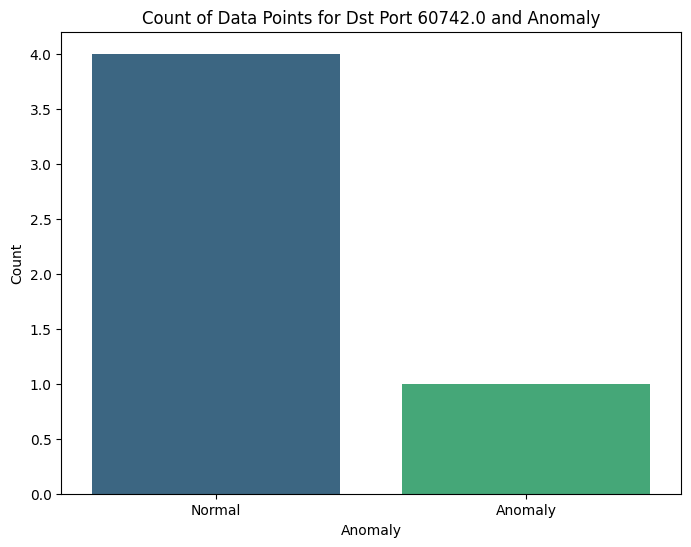

anomaly count:    anomaly  count
0        0     25
1        1      3


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


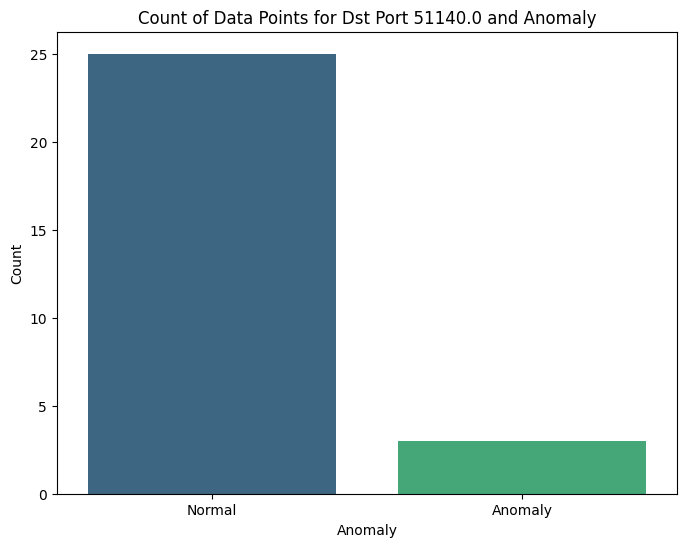

anomaly count:    anomaly  count
0        0      5
1        1      1


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


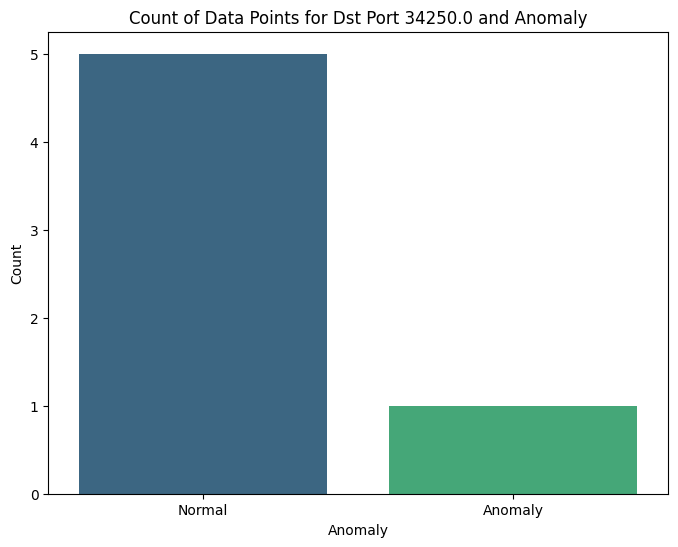

anomaly count:    anomaly  count
0        0      8


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


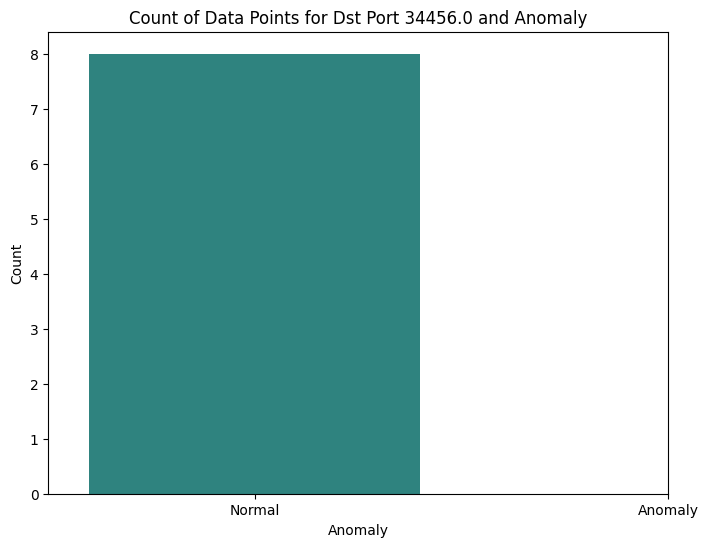

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


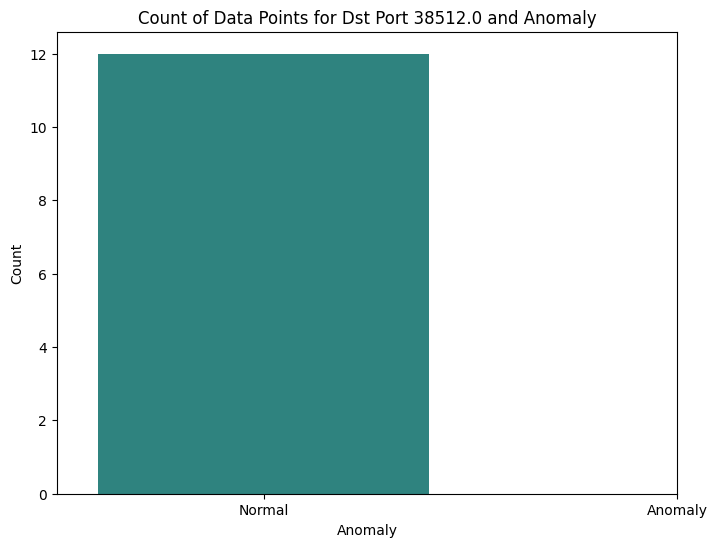

anomaly count:    anomaly  count
0        0     12


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


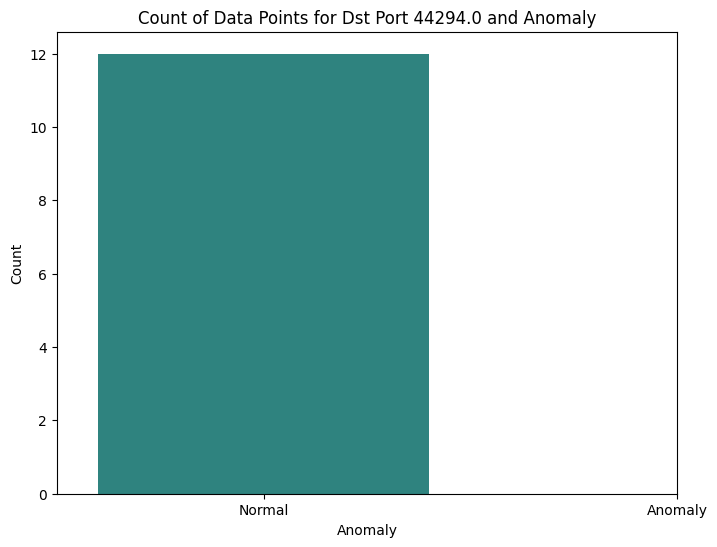

anomaly count:    anomaly  count
0        0     11


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


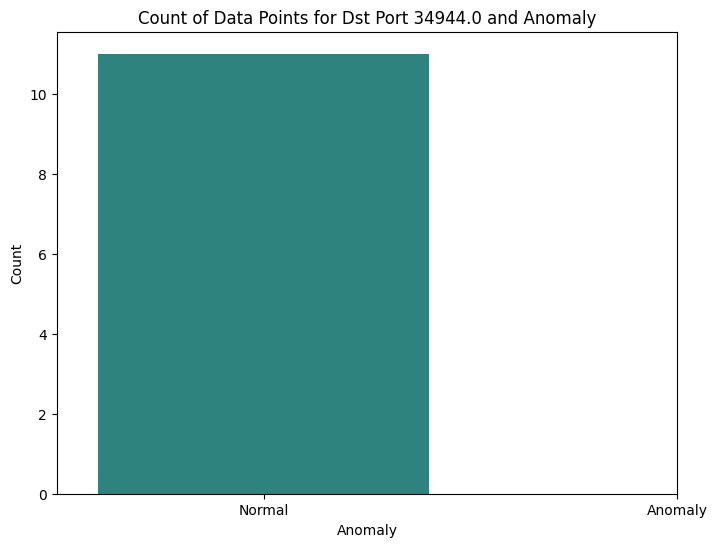

anomaly count:    anomaly  count
0        0      9


/var/folders/t8/_2vv47_s12d49vpmvrkng3c80000gn/T/ipykernel_49507/4291702958.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')


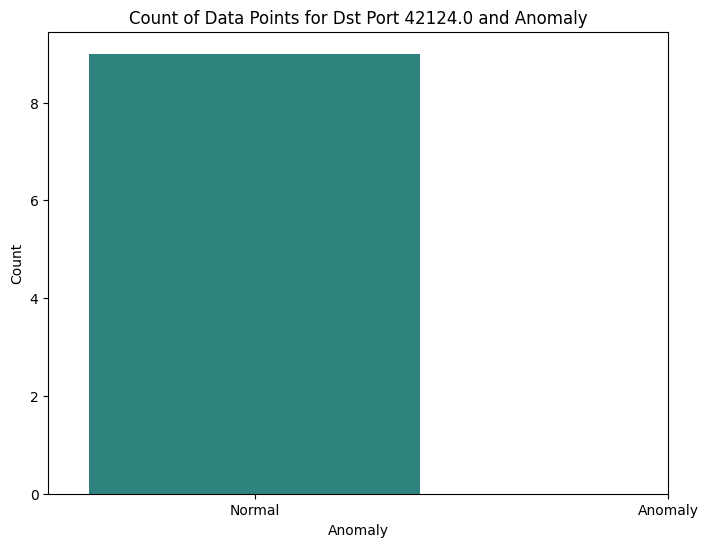

In [16]:
for port in unique_list_port[105:205]:
    current = df[df['Dst Port'] == port]
    
    anomaly_counts = current.groupby('anomaly').size().reset_index(name='count')
    
    if anomaly_counts.empty:
        continue
    else:
        print(f'anomaly count: {anomaly_counts}')
        plt.figure(figsize=(8, 6))
        sns.barplot(x='anomaly', y='count', data=anomaly_counts, palette='viridis')
        plt.title(f'Count of Data Points for Dst Port {port} and Anomaly')
        plt.xlabel('Anomaly')
        plt.ylabel('Count')
        plt.xticks(ticks=[0, 1], labels=['Normal', 'Anomaly'])
        plt.show()

In [4]:
import pysal as ps

In [6]:
features = ['Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Tot',
       'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min',
       'Bwd IAT Tot', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
       'Bwd IAT Min']

summary_stats = df[features].describe()

summary_stats

,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Tot,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Tot,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min
count,5.855611e+06,5.855611e+06,5.855611e+06,5.855611e+06,5.855611e+06,5.855611e+06,5.855611e+06,5.855611e+06,5.855611e+06,5.855611e+06,5.855611e+06,5.855611e+06,5.855611e+06
mean,9.635578e+06,2.600669e+07,4.359657e+06,6.294766e+07,1.403761e+07,1.001516e+07,2.562961e+07,6.241608e+06,3.563678e+07,1.335627e+07,3.631131e+06,1.729602e+07,1.032663e+07
std,1.248315e+07,2.770223e+07,1.484340e+07,4.974460e+07,1.749831e+07,1.472632e+07,2.762443e+07,1.648249e+07,4.553541e+07,2.197152e+07,9.086829e+06,2.521921e+07,2.189831e+07
min,0.000000e+00,4.000000e+00,-4.900000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,3.708681e+02,6.721350e+04,3.850000e+02,6.000100e+04,2.034900e+04,0.000000e+00,3.997700e+04,9.400000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,6.391247e+05,1.034420e+07,3.386000e+03,8.992014e+07,5.000054e+06,2.450158e+04,1.031627e+07,2.219700e+04,3.730000e+02,3.660000e+02,0.000000e+00,3.690000e+02,6.000000e+01
75%,1.953031e+07,5.497285e+07,2.689750e+04,1.116497e+08,2.250122e+07,1.670766e+07,5.413299e+07,1.011448e+06,9.009178e+07,2.141849e+07,4.348365e+04,3.010103e+07,1.018580e+06
max,8.480077e+07,1.200000e+08,1.200000e+08,1.200000e+08,1.200000e+08,8.476312e+07,1.200000e+08,1.200000e+08,1.199998e+08,1.198124e+08,8.472358e+07,1.198598e+08,1.198124e+08


In [12]:
df.columns

Index(['Flow ID', 'Src IP', 'Src Port', 'Dst IP', 'Dst Port', 'Protocol',
       'Timestamp', 'Flow Duration', 'Tot Fwd Pkts', 'Tot Bwd Pkts',
       'TotLen Fwd Pkts', 'TotLen Bwd Pkts', 'Fwd Pkt Len Max',
       'Fwd Pkt Len Min', 'Fwd Pkt Len Mean', 'Fwd Pkt Len Std',
       'Bwd Pkt Len Max', 'Bwd Pkt Len Min', 'Bwd Pkt Len Mean',
       'Bwd Pkt Len Std', 'Flow Byts/s', 'Flow Pkts/s', 'Flow IAT Mean',
       'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Tot',
       'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min',
       'Bwd IAT Tot', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
       'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags',
       'Bwd URG Flags', 'Fwd Header Len', 'Bwd Header Len', 'Fwd Pkts/s',
       'Bwd Pkts/s', 'Pkt Len Min', 'Pkt Len Max', 'Pkt Len Mean',
       'Pkt Len Std', 'Pkt Len Var', 'FIN Flag Cnt', 'SYN Flag Cnt',
       'RST Flag Cnt', 'PSH Flag Cnt', 'ACK Flag Cnt', 'URG Flag Cnt',
       'CWE Flag Count', 'ECE 

In [ ]:
#Histogram to compare the 
plt.figure(figsize=(16,12))
for i, feature in enumerate(features):
    plt.subplot(4, 4, i + 1)
    sns.histplot(df[features], kde = True)
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()
